# Previsão de Consumo Energético com Séries Temporais

**OBJETIVOS**:
- **Primário**: Construir uma solução preditiva para estimar o consumo energético de clientes residenciais. ✅
- **Secundário**: Desenvolver o projeto ponta a ponta, desde a análise exploratória até a construção de pipelines e boas práticas de MLOps.✅


**TAREFAS ESPERADAS**:
2. Tratamento de dados ausentes e inconsistentes. ✅
3. Criação de tabelas no DuckDB com os dados normalizados. ✅
4. Consultas SQL para geração de insights e features E 1. Análise exploratória (EDA) dos dados. ✅
5. Treinamento de pelo menos dois modelos preditivos.✅
6. Validação temporal adequada para séries temporais.✅
7. Construção de um pipeline contendo:✅
  - Ingestão dos CSVs✅
  - Transformações✅
  - Treinamento✅
  - Inferência✅
8. Registro do modelo treinado (MLflow ou pickle versionado).✅
9. Dashboard interativo com visualizações de previsões e métricas (pode ser
interativo dentro de um jupyter).✅
10. Apresentação executiva com storytelling (slides PDF ou PPT).✅

# Preparação do Ambiente

Certifique-se de ter seguido todos os passos da documentação README.md, para a criação do ambiente virtual com as devidas dependências. Este notebook deve ser executado tendo como kernel o ambiente virtual descrito no projeto.

In [1]:
!python --version
# Ou
import sys
print(sys.version)

Python 3.9.23
3.9.23 (main, Jun  5 2025, 13:25:08) [MSC v.1929 64 bit (AMD64)]


In [2]:
import ast
from contextlib import redirect_stderr
from datetime import datetime
import duckdb
from io import StringIO
import lightgbm as lgb
import logging
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import mlflow
import mlflow.statsmodels
import numpy as np
import os
import pandas as pd
from pathlib import Path
import pymannkendall as mk
import re
import seaborn as sns
from scipy.stats import spearmanr
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.stats.diagnostic import acorr_ljungbox
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sktime.performance_metrics.forecasting import mean_absolute_scaled_error
import sys
from typing import Dict, Any, Optional, List, Tuple
import warnings

mpl_logger = logging.getLogger('matplotlib')
mpl_logger.setLevel(logging.WARNING)
warnings.filterwarnings("ignore", module="matplotlib.*")
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

C:\Users\Administrador\miniconda3\envs\projeto_case_aquarela\lib\site-packages\mlflow\utils\requirements_utils.py:20: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import pkg_resources  # noqa: TID251


In [3]:
# Obtém o caminho do diretório do notebook atual (dashboard/)
notebook_dir = os.path.abspath('') 
# Navega para o diretório raiz do projeto (um nível acima de dashboard/)
# Assumindo que o notebook está em `seu_projeto_raiz/dashboard/`
# e as pastas `pipeline/` e `src/` estão em `seu_projeto_raiz/pipeline/src/`
project_root = os.path.dirname(notebook_dir)

# Adiciona o diretório 'pipeline' ao sys.path
# Isso permite importar módulos como `pipeline.src.model_loading`
sys.path.append(os.path.join(project_root, 'pipeline'))

print(f"Diretório raiz do projeto adicionado ao PATH: {project_root}")
print(f"Diretório da pipeline adicionado ao PATH: {os.path.join(project_root, 'pipeline')}")

# Verifique o sys.path
print(sys.path)

Diretório raiz do projeto adicionado ao PATH: C:\Users\Administrador\Desktop\CaseTecAquarela_TimeSeries
Diretório da pipeline adicionado ao PATH: C:\Users\Administrador\Desktop\CaseTecAquarela_TimeSeries\pipeline
['C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela\\python39.zip', 'C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela\\DLLs', 'C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela\\lib', 'C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela', '', 'C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela\\lib\\site-packages', 'C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela\\lib\\site-packages\\win32', 'C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela\\lib\\site-packages\\win32\\lib', 'C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela\\lib\\site-packages\\Pythonwin', 'C:\\Users\\Administrador\\miniconda3\\envs\\projeto_case_aquarela\\lib\\site-packages\\setupto

In [4]:
# --- Configuração do MLflow para usar a pasta local ---
# Isso fará com que o MLflow crie uma pasta 'mlruns' na mesma pasta do seu script.
mlflow_artifacts_path = os.path.join(project_root, 'models', 'artifacts')
mlflow_path = Path(mlflow_artifacts_path).as_uri()
mlflow.set_tracking_uri(mlflow_path)

In [9]:
data_path = os.path.join(project_root, 'data', 'src')
path_clientes = '../data/src/clientes.csv' #f'{Path(data_path).as_uri()}/clientes.csv'
path_clima = '../data/src/clima.csv' #f'{Path(data_path).as_uri()}/clima.csv'
path_consumo = '../data/src/consumo.csv' #f'{Path(data_path).as_uri()}/consumo.csv'

In [10]:
# Conectar ao DuckDB (cria um banco de dados temporário em memória por padrão)
con = duckdb.connect(database=':memory:', read_only=False)

In [11]:
path_clientes

'../data/src/clientes.csv'

In [12]:
qry_cli = f"SELECT * FROM '{path_clientes}'"
cli_raw = con.execute(qry_cli).fetchdf()

qry_clima = f"SELECT * FROM '{path_clima}'"
clima_raw = con.execute(qry_clima).fetchdf()

qry_con = f"SELECT * FROM '{path_consumo}'"
con_raw = con.execute(qry_con).fetchdf()

# Pré-processamento dos Dados

## Tratamento

Tratamento de dados ausentes e inconsistentes ✅

### Clientes

In [ ]:
cli_raw.head()

,client_id,region
0,C0000,Norte
1,C0001,Norte
2,C0002,Sul
3,C0003,Norte
4,C0004,Oeste


In [ ]:
cli_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   client_id  100 non-null    object
 1   region     100 non-null    object
dtypes: object(2)
memory usage: 1.7+ KB


Verificando duplicidade na chave primária.

In [ ]:
cli_raw['client_id'].value_counts().max()

1

In [ ]:
cli_raw['region'].value_counts()

,count
region,
Norte,31
Leste,18
Centro,16
Sul,15
Oeste,15
Desconhecida,5


In [ ]:
cli_raw[cli_raw['region']=='Desconhecida']

,client_id,region
15,C0015,Desconhecida
50,C0050,Desconhecida
58,C0058,Desconhecida
77,C0077,Desconhecida
92,C0092,Desconhecida


Base de clientes OK

### Clima

In [ ]:
clima_raw.head()

,region,date,temperature,humidity
0,Centro,2023-01-01,25.652941,57.188235
1,Centro,2023-01-02,23.794118,52.517647
2,Centro,2023-01-03,22.900000,61.358824
3,Centro,2023-01-04,24.158824,64.223529
4,Centro,2023-01-05,24.870588,59.058824


In [ ]:
clima_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   region       900 non-null    object        
 1   date         900 non-null    datetime64[us]
 2   temperature  855 non-null    float64       
 3   humidity     900 non-null    float64       
dtypes: datetime64[us](1), float64(2), object(1)
memory usage: 28.3+ KB


Entendo as classes contidas em `region`

In [ ]:
clima_raw['region'].value_counts()

,count
region,
Centro,180
Leste,180
Norte,180
Oeste,180
Sul,180


Entendendo o impacto dos dados ausentes na variável `temperature` e possível viés em outras classes.

In [ ]:
clima_raw[clima_raw['temperature'].isnull()]['region'].value_counts()

,count
region,
Leste,13
Norte,11
Centro,8
Oeste,7
Sul,6


Vemos que a falta da temperatura ocorre em todas as regiões, mas a região Leste é a mais afetada, podendo ser devido à uma falha nos sensores de captura dos dados daquela região.

Agora verificando superficialmente a distribuição dessa falta de dados nos dias.

In [ ]:
clima_raw[clima_raw['temperature'].isnull()]['date'].value_counts().reset_index()['date'].describe()

,date
count,41
mean,2023-04-05 21:39:30.731707
min,2023-01-01 00:00:00
25%,2023-02-27 00:00:00
50%,2023-03-31 00:00:00
75%,2023-05-26 00:00:00
max,2023-06-27 00:00:00


Count = 41: Confirma que há 41 datas distintas

Mean, min, 25%, 50%, 75%, max: Essas estatísticas indicam que os NaNs estão espalhados ao longo do tempo, desde o início de janeiro até o final de junho de 2023. Não é um problema concentrado em um período específico, mas sim um problema distribuído ao longo dos meses.

A partir disso, defini que a estratégia de interpolação (linear, ffill, bfill) que é ideal para dados de séries temporais como temperatura, que são fenômenos contínuos.
Como os NaNs não estão agrupados em um único período ou em datas específicas, a interpolação consegue "preencher" essas lacunas usando os valores observados antes e depois, mantendo a característica de série temporal dos dados. Se estivessem concentrados em um único mês, por exemplo, talvez tivéssemos que considerar outras fontes de dados para aquele período ou aceitar uma imputação mais simples como a média do mês.

**Assim, tratarei estas ausências através da interpolação linear por grupo (region), seguida por um preenchimento ffill (forward fill) e bfill (backward fill), também por grupo.**

O agrupamento é crucial para garantir que a interpolação ocorra apenas entre temperaturas da mesma região, evitando misturar padrões climáticos de locais diferentes.

Segue aplicação:

In [ ]:
print("--- DataFrame ORIGINAL (com NAs) ---")
print(clima_raw.info())
print("\nValores ausentes antes do tratamento:")
print(clima_raw.isnull().sum())

# 1. ORDENANDO os dados: Essencial para interpolação e preenchimento sequencial.
# Ordena por 'region' e depois por 'date' para garantir que as operações de grupo funcionem corretamente.
clima_raw_sorted = clima_raw.sort_values(by=['region', 'date']).reset_index(drop=True)

# 2. INTERPOLAÇÃO LINEAR por grupo (`region`)
# Preenche NAs usando interpolação linear dentro de cada grupo de região.
clima_raw_sorted['temperature'] = clima_raw_sorted.groupby('region')['temperature'].transform(lambda x: x.interpolate(method='linear'))

# 3. PREENCHENDO NAs restantes com FFILL (Forward Fill) por grupo
# Trata NAs que podem estar no início das séries de cada região, usando o último valor válido.
clima_raw_sorted['temperature'] = clima_raw_sorted.groupby('region')['temperature'].transform(lambda x: x.fillna(method='ffill'))

# 4. PREENCHENDO NAs restantes com BFILL (Backward Fill) por grupo
# Trata NAs que podem estar no final das séries de cada região, usando o próximo valor válido.
clima_raw_sorted['temperature'] = clima_raw_sorted.groupby('region')['temperature'].transform(lambda x: x.fillna(method='bfill'))

print("\n--- DataFrame APÓS TRATAMENTO ---")
print(clima_raw_sorted.info())
print("\nValores ausentes após tratamento:")
print(clima_raw_sorted.isnull().sum())


--- DataFrame ORIGINAL (com NAs) ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   region       900 non-null    object        
 1   date         900 non-null    datetime64[us]
 2   temperature  855 non-null    float64       
 3   humidity     900 non-null    float64       
dtypes: datetime64[us](1), float64(2), object(1)
memory usage: 28.3+ KB
None

Valores ausentes antes do tratamento:
region          0
date            0
temperature    45
humidity        0
dtype: int64

--- DataFrame APÓS TRATAMENTO ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 900 entries, 0 to 899
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype         
---  ------       --------------  -----         
 0   region       900 non-null    object        
 1   date         900 non-null    datetime64[us]
 2   temperature  900 non-nul

In [ ]:
clima_raw_sorted['temperature'].describe()

,temperature
count,900.000000
mean,25.105312
std,1.163087
min,21.313333
25%,24.343056
50%,25.036397
75%,25.875000
max,28.746667


Agora temos uma coluna de temperatura totalomente preenchida e com valores consistêntes ao senso comum (sem temperaturas exorbitantes para mais ou para menos).

Verificando se os dados cronológicos não estão no futuro ou se não estão muito no passado

In [ ]:
print(f"Data min: {clima_raw_sorted['date'].min()} Data max: {clima_raw_sorted['date'].max()}\n")

Data min: 2023-01-01 00:00:00 Data max: 2023-06-29 00:00:00



Verificando se a série de datas é  contínua (sem pulos de datas ou datas repetidas para a mesma região).

In [ ]:
# 1. ORDENANDO os dados: Essencial para que o .diff() funcione corretamente dentro de cada grupo.
# A ordem deve ser por 'region' e depois por 'date'.
df_verificacao = clima_raw_sorted.sort_values(by=['region', 'date']).reset_index(drop=True)

# 2. CALCULANDO A DIFERENÇA DE DIAS DENTRO DE CADA GRUPO DE REGIÃO
# O `groupby('region')` garante que a comparação de datas seja feita apenas entre entradas da mesma região.
df_verificacao['diff_dias'] = df_verificacao.groupby('region')['date'].diff().dt.days

# 3. IDENTIFICANDO AS INCONSISTÊNCIAS (Gaps ou Duplicidades)
# Buscamos por:
# - `diff_dias != 1`: Indica um gap (pulou dias) ou uma duplicidade.
# - `notna()`: Ignora o primeiro `NaN` de cada grupo, que é esperado no resultado do `diff()`.
inconsistencias = df_verificacao[
    (df_verificacao['diff_dias'] != 1) &
    (df_verificacao['diff_dias'].notna())
]

if inconsistencias.empty:
    print("\n✅ As datas parecem ser contínuas (diferença de 1 dia) para todas as regiões e não há duplicidades de datas por região.")
else:
    print("\n⚠️ Foram encontradas interrupções na continuidade ou datas duplicadas por região:")
    for index, row in inconsistencias.iterrows():
        regiao = row['region']
        data_atual = row['date']
        diferenca_dias = row['diff_dias']

        # Tenta pegar a data anterior no mesmo grupo para contexto
        data_anterior = None
        # Verifica se o índice anterior existe e se é da mesma região para pegar a data anterior
        if index > 0 and df_verificacao.loc[index - 1, 'region'] == regiao:
            data_anterior = df_verificacao.loc[index - 1, 'date']

        print(f"  --- Região: {regiao} ---")
        if diferenca_dias == 0:
            print(f"    Inconsistência: Data duplicada.")
            print(f"    Data: {data_atual}")
            print(f"    Verifique se há múltiplas entradas para {data_atual} na região {regiao}.")
        elif data_anterior is not None:
            print(f"    Inconsistência: Gap detectado.")
            print(f"    Data Esperada: {data_anterior + pd.Timedelta(days=1)}")
            print(f"    Próxima data no dataset: {data_atual}")
            print(f"    Diferença de dias: {int(diferenca_dias)} (esperado 1)")
        else:
            # Caso raro onde o primeiro item do grupo já é um problema de diff_dias (ex: 0)
            print(f"    Inconsistência no início da série ou formato inesperado.")
            print(f"    Data: {data_atual}")
            print(f"    Diferença de dias: {int(diferenca_dias)}")
        print("    --------------------------")

df_verificacao.drop(columns=['diff_dias'], inplace=True)


✅ As datas parecem ser contínuas (diferença de 1 dia) para todas as regiões e não há duplicidades de datas por região.


Verificando a consistência semântica dos dados de `humidity`. Como a humidade é majoritariamente apresentada como percentual, ela deve variar ou entre 0 e 1 ou entre 0 e 100 (como é mais apresentado pro público geral).

In [ ]:
clima_raw['humidity'].describe()

,humidity
count,900.000000
mean,60.013529
std,2.421545
min,52.517647
25%,58.456111
50%,60.005556
75%,61.565196
max,69.111765


Humidade com comportamente consistente.

### Consumo

In [ ]:
con_raw.head()

,client_id,date,consumption_kwh
0,C0000,2023-01-01,18.64
1,C0000,2023-01-02,16.63
2,C0000,2023-01-03,18.11
3,C0000,2023-01-04,18.25
4,C0000,2023-01-05,19.81


In [ ]:
con_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18000 entries, 0 to 17999
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   client_id        18000 non-null  object        
 1   date             18000 non-null  datetime64[us]
 2   consumption_kwh  18000 non-null  float64       
dtypes: datetime64[us](1), float64(1), object(1)
memory usage: 422.0+ KB


Agora irei verificar se todos os client_ids do con_raw estão presentes no cli_raw, e vice-versa. Isso é importante para garantir que a união (merge) entre os dois DataFrames ocorra sem perder informações.

In [ ]:
# Obtendo conjuntos de IDs únicos para facilitar a comparação
ids_con_raw = set(con_raw['client_id'].unique())
ids_cli_raw = set(cli_raw['client_id'].unique())

print("\n--- Verificando Correspondência de client_id ---")

# 1. Verificando se TODOS os IDs de con_raw estão em cli_raw
ids_em_con_mas_nao_em_cli = ids_con_raw - ids_cli_raw
if not ids_em_con_mas_nao_em_cli:
    print("✅ Todos os 'client_id's em 'con_raw' estão presentes em 'cli_raw'.")
else:
    print(f"⚠️ Alerta: Existem 'client_id's em 'con_raw' que NÃO estão em 'cli_raw': {ids_em_con_mas_nao_em_cli}")

# 2. Verificar se TODOS os IDs de cli_raw estão em con_raw
ids_em_cli_mas_nao_em_con = ids_cli_raw - ids_con_raw
if not ids_em_cli_mas_nao_em_con:
    print("✅ Todos os 'client_id's em 'cli_raw' estão presentes em 'con_raw'.")
else:
    print(f"⚠️ Alerta: Existem 'client_id's em 'cli_raw' que NÃO estão em 'con_raw': {ids_em_cli_mas_nao_em_con}")



--- Verificando Correspondência de client_id ---
✅ Todos os 'client_id's em 'con_raw' estão presentes em 'cli_raw'.
✅ Todos os 'client_id's em 'cli_raw' estão presentes em 'con_raw'.


Verificando a continuidade das datas. Irei usar a mesma lógica que usei para o clima, mas agrupando por client_id. Isso garante que estamos olhando para a continuidade da série de consumo de cada cliente individualmente.

In [ ]:
df_consumo_verificacao = con_raw.sort_values(by=['client_id', 'date']).reset_index(drop=True)
df_consumo_verificacao['diff_dias'] = df_consumo_verificacao.groupby('client_id')['date'].diff().dt.days
inconsistencias_consumo = df_consumo_verificacao[
    (df_consumo_verificacao['diff_dias'] != 1) &
    (df_consumo_verificacao['diff_dias'].notna())
]

if inconsistencias_consumo.empty:
    print("\n✅ As datas parecem ser contínuas (diferença de 1 dia) para todos os clientes e não há duplicidades de datas por cliente.")
else:
    print("\n⚠️ Foram encontradas interrupções na continuidade ou datas duplicadas por cliente:")
    for index, row in inconsistencias_consumo.iterrows():
        cliente = row['client_id']
        data_atual = row['date']
        diferenca_dias = row['diff_dias']
        data_anterior = None
        if index > 0 and df_consumo_verificacao.loc[index - 1, 'client_id'] == cliente:
            data_anterior = df_consumo_verificacao.loc[index - 1, 'date']

        print(f"  --- Cliente: {cliente} ---")
        if diferenca_dias == 0:
            print(f"    Inconsistência: Data duplicada.")
            print(f"    Data: {data_atual}")
            print(f"    Verifique se há múltiplas entradas para {data_atual} no cliente {cliente}.")
        elif data_anterior is not None:
            print(f"    Inconsistência: Gap detectado.")
            print(f"    Data Esperada: {data_anterior + pd.Timedelta(days=1)}")
            print(f"    Próxima data no dataset: {data_atual}")
            print(f"    Diferença de dias: {int(diferenca_dias)} (esperado 1)")
        else:
            print(f"    Inconsistência no início da série ou formato inesperado.")
            print(f"    Data: {data_atual}")
            print(f"    Diferença de dias: {int(diferenca_dias)}")
        print("    --------------------------")


✅ As datas parecem ser contínuas (diferença de 1 dia) para todos os clientes e não há duplicidades de datas por cliente.


Validação semântica da coluna de consumo energético.

In [ ]:
con_raw['consumption_kwh'].describe()

,consumption_kwh
count,18000.000000
mean,14.811876
std,3.728855
min,2.640000
25%,12.070000
50%,14.890000
75%,17.630000
max,27.920000


Após pesquisa externa, identifiquei que estes valores são coerentes para uma residência.

Tratamento Concluído com Sucesso ✅

## Normalização e Materialização dos Dados

Criação de tabelas no DuckDB com os dados normalizados✅

In [ ]:
# Tabela de Clientes
con.execute("CREATE OR REPLACE TABLE clientes AS SELECT * FROM cli_raw")
print("✅ Tabela 'clientes' materializada no DuckDB.")

# Tabela de Consumo
con.execute("CREATE OR REPLACE TABLE consumo AS SELECT * FROM con_raw")
print("✅ Tabela 'consumo' materializada no DuckDB.")

# Tabela de Clima
con.execute("CREATE OR REPLACE TABLE clima AS SELECT * FROM clima_raw_sorted")
print("✅ Tabela 'clima' materializada no DuckDB.")


# Query SQL para a união (JOIN) das tabelas, desnormalizando os dados.
query = """
SELECT
    c.client_id,
    c.date,
    c.consumption_kwh,
    cli.region,
    cl.temperature,
    cl.humidity
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
LEFT JOIN clima AS cl ON cli.region = cl.region AND c.date = cl.date"""

df_geral = con.execute(query).fetchdf()

print(df_geral.info())
print(df_geral.head())

#con.close()

✅ Tabela 'clientes' materializada no DuckDB.
✅ Tabela 'consumo' materializada no DuckDB.
✅ Tabela 'clima' materializada no DuckDB.
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18000 entries, 0 to 17999
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   client_id        18000 non-null  object        
 1   date             18000 non-null  datetime64[us]
 2   consumption_kwh  18000 non-null  float64       
 3   region           18000 non-null  object        
 4   temperature      17100 non-null  float64       
 5   humidity         17100 non-null  float64       
dtypes: datetime64[us](1), float64(3), object(2)
memory usage: 843.9+ KB
None
  client_id       date  consumption_kwh region  temperature   humidity
0     C0000 2023-01-01            18.64  Norte    27.090625  59.068750
1     C0000 2023-01-02            16.63  Norte    27.090625  59.206250
2     C0000 2023-01-03            18.11  Norte

A base desnormalizada obteve 18000 entradas, e destas, 17100 com dados de clime preenchidos (900 nulos), pois existem 5 clientes com região 'Desconhecida', e a região é a chave para unir os dados de temperatura para a região de cada cliente. 5 clientes de 100 são 5% de perda de dados.

Como nesse momento pretendo analisar os dados de maneira global, manterei desta forma, mas posteriormente isso deverá ser tratado na modelagem, caso a abordagem escolhida for a multivariada. Se a abordagem escolhida for um modelo estatístico tradicional (como ARIMA e suas variações), a informação de clima pode ser desconsiderada.

# Exploração dos Dados

Consultas SQL para geração de insights e features, juntamente com Análise Gráfica dos dados✅

## Análise Exploratória Geral

### Dados Numéricos

Extraindo as estatísticas descritivas de forma univariada, analisando as séries numéricas individualmente.

O boxplot é ideal para isso.

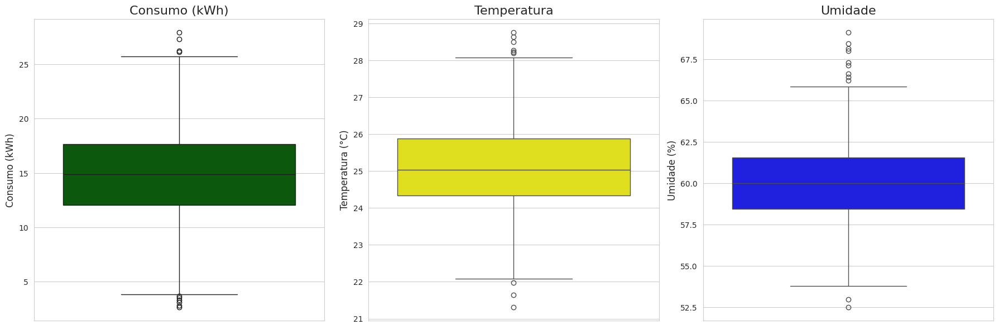

In [ ]:
df_consumo = con.execute("SELECT consumption_kwh FROM consumo").fetchdf()
df_temperatura = con.execute("SELECT temperature FROM clima").fetchdf()
df_umidade = con.execute("SELECT humidity FROM clima").fetchdf()

sns.set_style("whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Boxplot para o Consumo (na primeira coluna)
sns.boxplot(
    y=df_consumo['consumption_kwh'],
    ax=axes[0],
    color='darkgreen'
)
axes[0].set_title('Consumo (kWh)', fontsize=16)
axes[0].set_ylabel('Consumo (kWh)', fontsize=12)

# Boxplot para a Temperatura (na segunda coluna)
sns.boxplot(
    y=df_temperatura['temperature'],
    ax=axes[1],
    color='yellow'
)
axes[1].set_title('Temperatura', fontsize=16)
axes[1].set_ylabel('Temperatura (°C)', fontsize=12)

# Boxplot para a Umidade (na terceira coluna)
sns.boxplot(
    y=df_umidade['humidity'],
    ax=axes[2],
    color='blue'
)
axes[2].set_title('Umidade', fontsize=16)
axes[2].set_ylabel('Umidade (%)', fontsize=12)

plt.tight_layout()
plt.show()

Os três gráficos mostram uma distribuição de dados razoavelmente concentrada em torno da mediana, mas com a presença de valores atípicos (outliers) em todas as três variáveis. Isso sugere que, embora a maioria das medições de consumo, temperatura e umidade ocorra dentro de uma faixa esperada, há momentos de desvio pequeno em relação ao padrão.

### Dados Categóricos

Analisando as variáveis numéricas para cada classe de região.

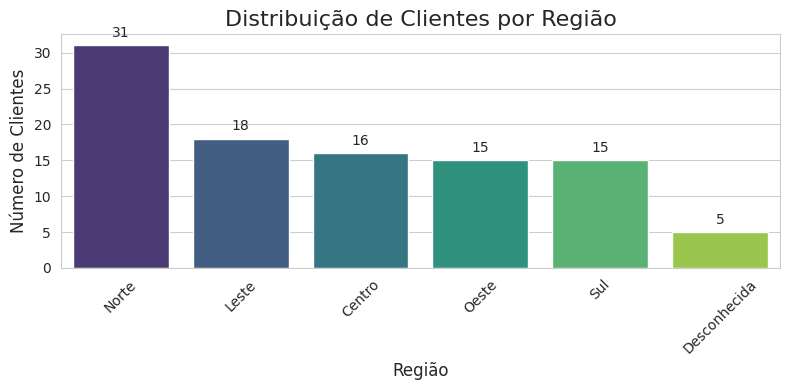

In [ ]:
query = """
SELECT
    region,
    COUNT(client_id) AS total_clientes
FROM clientes
GROUP BY region
ORDER BY total_clientes DESC;
"""
df_clientes_por_regiao = con.execute(query).fetchdf()
#df_clientes_por_regiao.head(None)

sns.set_style("whitegrid")

plt.figure(figsize=(8, 4))
grafico = sns.barplot(
    x='region',
    y='total_clientes',
    data=df_clientes_por_regiao,
    hue='region',
    legend=False,
    palette='viridis'
)

grafico.set_title('Distribuição de Clientes por Região', fontsize=16)
grafico.set_xlabel('Região', fontsize=12)
grafico.set_ylabel('Número de Clientes', fontsize=12)

# Adicionando o número exato de clientes em cada barra para maior clareza
for p in grafico.patches:
    grafico.annotate(
        f'{int(p.get_height())}',
        (p.get_x() + p.get_width() / 2., p.get_height()),
        ha='center',
        va='center',
        xytext=(0, 9),
        textcoords='offset points'
    )

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

Vemos que o Norte é a região mais populosa, quase o dobro de clientes que a maioria das regiões.

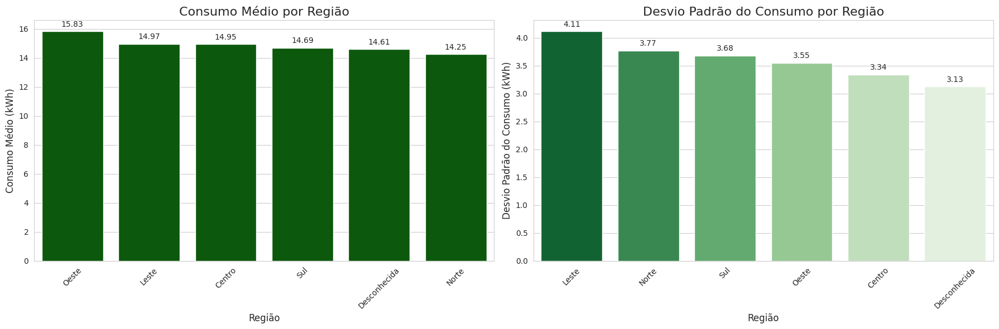

In [ ]:
def plot_with_values(ax, data, x, y, title, ylabel, color=None, palette=None):
    """
    Função auxiliar para gerar um gráfico de barras com valores nas barras.
    """
    sns.barplot(
        ax=ax,
        x=x,
        y=y,
        data=data,
        color=color,
        palette=palette,
        hue=x if palette else None,
        legend=False
    )
    ax.set_title(title, fontsize=16)
    ax.set_xlabel('Região', fontsize=12)
    ax.set_ylabel(ylabel, fontsize=12)
    ax.tick_params(axis='x', rotation=45)

    # Adiciona o valor em cada barra
    for p in ax.patches:
        ax.annotate(
            f'{p.get_height():.2f}',
            (p.get_x() + p.get_width() / 2., p.get_height()),
            ha='center', va='center', xytext=(0, 9), textcoords='offset points'
        )

query_media_consumo = """
SELECT
    cli.region,
    AVG(c.consumption_kwh) AS avg_consumption
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
GROUP BY cli.region
ORDER BY avg_consumption DESC;
"""
df_media_consumo = con.execute(query_media_consumo).fetchdf()

query_stddev_consumo = """
SELECT
    cli.region,
    STDDEV(c.consumption_kwh) AS std_dev_consumption
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
GROUP BY cli.region
ORDER BY std_dev_consumption DESC;
"""
df_stddev_consumo = con.execute(query_stddev_consumo).fetchdf()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Gráfico do Consumo Médio (na primeira coluna)
plot_with_values(
    ax=axes[0],
    data=df_media_consumo,
    x='region',
    y='avg_consumption',
    title='Consumo Médio por Região',
    ylabel='Consumo Médio (kWh)',
    color='darkgreen'
)

# Gráfico do Desvio Padrão do Consumo (na segunda coluna)
plot_with_values(
    ax=axes[1],
    data=df_stddev_consumo,
    x='region',
    y='std_dev_consumption',
    title='Desvio Padrão do Consumo por Região',
    ylabel='Desvio Padrão do Consumo (kWh)',
    palette='Greens_r'
)

plt.tight_layout()
plt.show()

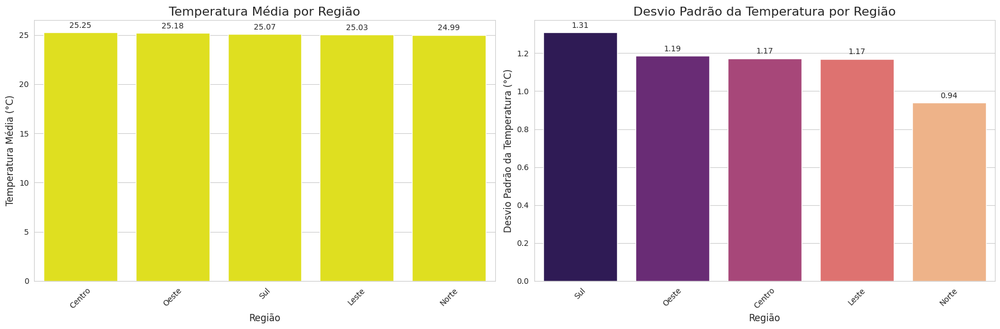

In [ ]:
query_media = """
SELECT
    region,
    AVG(temperature) AS avg_temperature
FROM clima
GROUP BY region
ORDER BY avg_temperature DESC;
"""
df_media = con.execute(query_media).fetchdf()

query_stddev = """
SELECT
    region,
    STDDEV(temperature) AS std_dev_temperature
FROM clima
GROUP BY region
ORDER BY std_dev_temperature DESC;
"""
df_stddev = con.execute(query_stddev).fetchdf()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

plot_with_values(
    ax=axes[0],
    data=df_media,
    x='region',
    y='avg_temperature',
    title='Temperatura Média por Região',
    ylabel='Temperatura Média (°C)',
    color='yellow'
)

plot_with_values(
    ax=axes[1],
    data=df_stddev,
    x='region',
    y='std_dev_temperature',
    title='Desvio Padrão da Temperatura por Região',
    ylabel='Desvio Padrão da Temperatura (°C)',
    palette='magma'
)

plt.tight_layout()
plt.show()

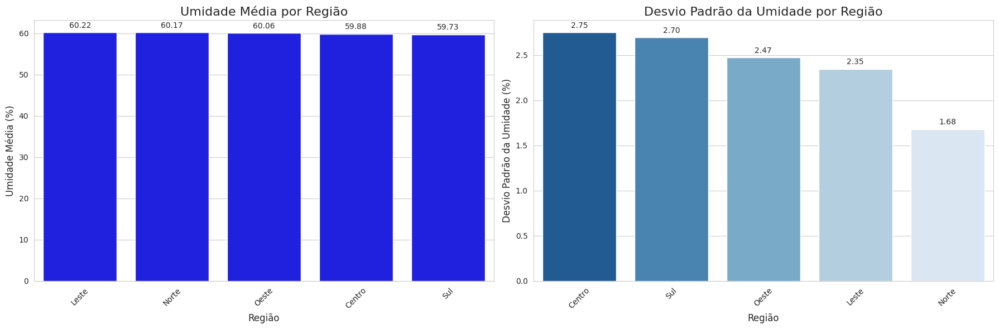

In [ ]:
query_media_umidade = """
SELECT
    region,
    AVG(humidity) AS avg_humidity
FROM clima
GROUP BY region
ORDER BY avg_humidity DESC;
"""
df_media_umidade = con.execute(query_media_umidade).fetchdf()

query_stddev_umidade = """
SELECT
    region,
    STDDEV(humidity) AS std_dev_humidity
FROM clima
GROUP BY region
ORDER BY std_dev_humidity DESC;
"""
df_stddev_umidade = con.execute(query_stddev_umidade).fetchdf()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Gráfico da Umidade Média (na primeira coluna)
plot_with_values(
    ax=axes[0],
    data=df_media_umidade,
    x='region',
    y='avg_humidity',
    title='Umidade Média por Região',
    ylabel='Umidade Média (%)',
    color='blue'  # Cor azul sólida
)

# Gráfico do Desvio Padrão da Umidade (na segunda coluna)
plot_with_values(
    ax=axes[1],
    data=df_stddev_umidade,
    x='region',
    y='std_dev_humidity',
    title='Desvio Padrão da Umidade por Região',
    ylabel='Desvio Padrão da Umidade (%)',
    palette='Blues_r'
)

plt.tight_layout()
plt.show()

### Correlação

Analisando a possível correlação entre:
- consumo x temperatura
- consumo x umidade

Agrupando por região.

A função CORR() no DuckDB calcula o coeficiente de correlação de Pearson.

- **Positivo (+)**: Indica que as variáveis se movem na mesma direção. Se uma aumenta, a outra tende a aumentar.
- **Negativo (-)**: Indica que as variáveis se movem em direções opostas. Se uma aumenta, a outra tende a diminuir.
- **Zero (0)**: Indica que não há uma relação linear entre as variáveis.

É importante lembrar que a correlação de Pearson mede apenas a relação linear. Se houver uma relação não-linear entre as variáveis (por exemplo, um formato de U), o coeficiente pode ser baixo ou zero, mesmo que a relação seja forte.

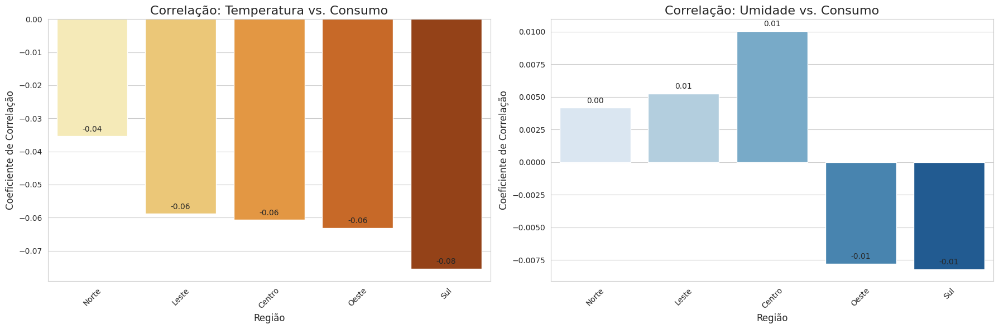

In [ ]:
query_correlacao = """
SELECT
    cli.region,
    CORR(c.consumption_kwh, cl.temperature) AS corr_temp_consumo,
    CORR(c.consumption_kwh, cl.humidity) AS corr_umidade_consumo
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
JOIN clima AS cl ON cli.region = cl.region AND c.date = cl.date
GROUP BY cli.region
ORDER BY corr_temp_consumo DESC;
"""
df_correlacoes = con.execute(query_correlacao).fetchdf()

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Gráfico da Correlação entre Temperatura e Consumo
plot_with_values(
    ax=axes[0],
    data=df_correlacoes,
    x='region',
    y='corr_temp_consumo',
    title='Correlação: Temperatura vs. Consumo',
    ylabel='Coeficiente de Correlação',
    palette='YlOrBr'  # Cores quentes para a temperatura
)

# Gráfico da Correlação entre Umidade e Consumo
plot_with_values(
    ax=axes[1],
    data=df_correlacoes,
    x='region',
    y='corr_umidade_consumo',
    title='Correlação: Umidade vs. Consumo',
    ylabel='Coeficiente de Correlação',
    palette='Blues' # Cores frias para a umidade
)

plt.tight_layout()
plt.show()

Assim, vemos que os índices de correlação gerados tiveram valores irrisórios, não passando de 1% tanto pra mais quanto pra menos.  Isso não significa necessariamente que não haja uma relação, mas sim que a relação pode ser não linear.

Como uma das opções de modelagem são os modelos de árvore, ótimos para captar relações não lineares, estes dados ainda poderão ter valor preditivo.

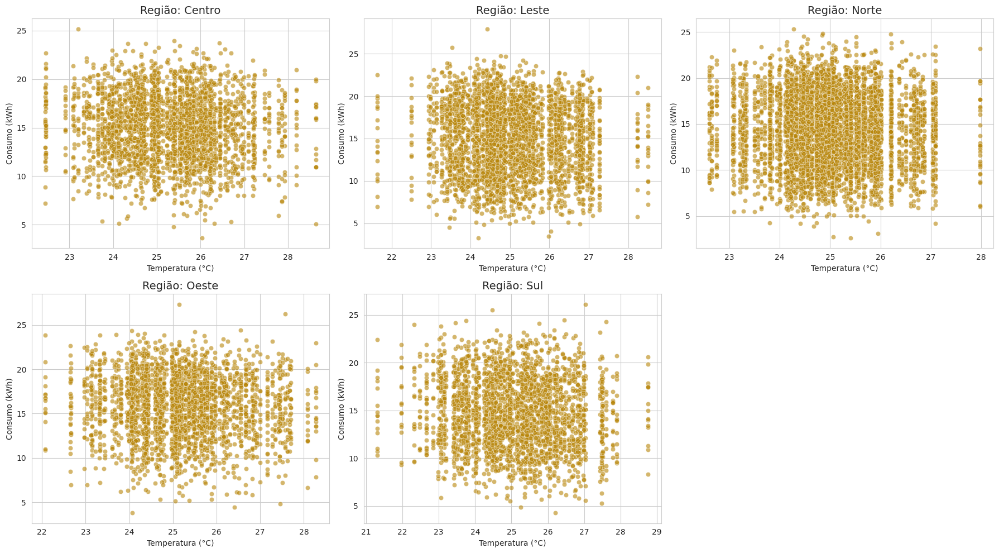

In [ ]:
query_completa = """
SELECT
    cli.region,
    cl.temperature,
    c.consumption_kwh
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
JOIN clima AS cl ON cli.region = cl.region AND c.date = cl.date;
"""
df_completo = con.execute(query_completa).fetchdf()

regioes_unicas = df_completo['region'].unique()
num_regioes = len(regioes_unicas)

cols = 3  # Número de colunas no grid
rows = (num_regioes + cols - 1) // cols # Garante o número de linhas suficiente
fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
axes = axes.flatten() # Achata o array de eixos para facilitar a iteração

# Cria um scatter plot para cada região
for i, region in enumerate(regioes_unicas):
    df_regiao = df_completo[df_completo['region'] == region]
    ax = axes[i]

    sns.scatterplot(
        x='temperature',
        y='consumption_kwh',
        data=df_regiao,
        ax=ax,
        color='darkgoldenrod',
        alpha=0.6
    )

    ax.set_title(f'Região: {region}', fontsize=14)
    ax.set_xlabel('Temperatura (°C)', fontsize=10)
    ax.set_ylabel('Consumo (kWh)', fontsize=10)

# Oculta subplots não utilizados, se houver
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

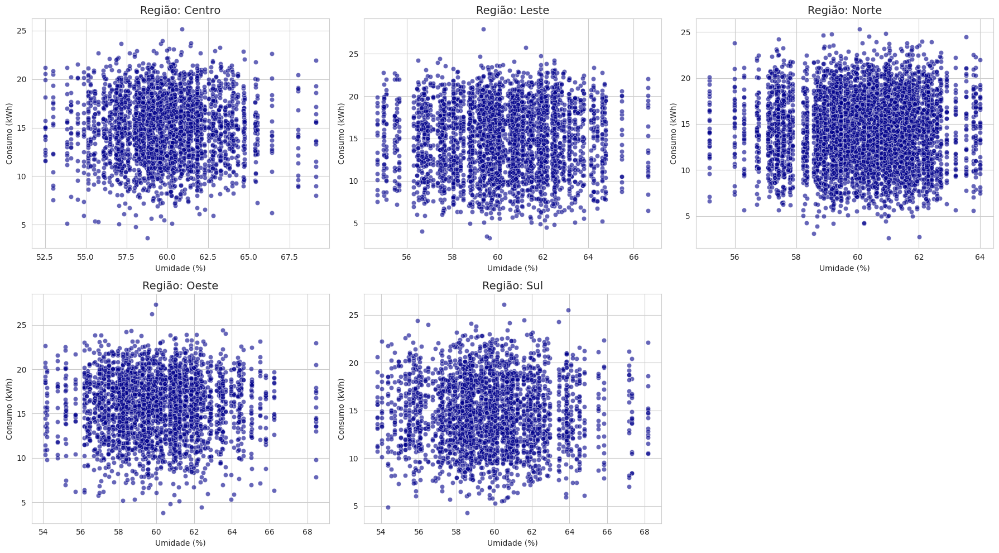

In [ ]:
query_completa = """
SELECT
    cli.region,
    cl.humidity,
    c.consumption_kwh
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
JOIN clima AS cl ON cli.region = cl.region AND c.date = cl.date;
"""
df_completo = con.execute(query_completa).fetchdf()

regioes_unicas = df_completo['region'].unique()
num_regioes = len(regioes_unicas)


cols = 3  # Número de colunas no grid
rows = (num_regioes + cols - 1) // cols # Garante o número de linhas suficiente
fig, axes = plt.subplots(rows, cols, figsize=(18, 5 * rows))
axes = axes.flatten() # Achata o array de eixos para facilitar a iteração

# Cria um scatter plot para cada região
for i, region in enumerate(regioes_unicas):
    df_regiao = df_completo[df_completo['region'] == region]
    ax = axes[i]

    sns.scatterplot(
        x='humidity',
        y='consumption_kwh',
        data=df_regiao,
        ax=ax,
        color='darkblue',
        alpha=0.6
    )

    ax.set_title(f'Região: {region}', fontsize=14)
    ax.set_xlabel('Umidade (%)', fontsize=10)
    ax.set_ylabel('Consumo (kWh)', fontsize=10)

# Oculta subplots não utilizados, se houver
for j in range(i + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

Os gráficos de dispersão mostraram que, da maneira como os dados estão dispostos, não existe tendência nenhuma, seja de aumento ou de diminuição, do consumo em função da temperatura ou da umidade.

A última abordagem que usarei é analisar a correlação com um lag de 1 dia, uma vez que possa ser que a temperatura ou umidade do dia anterior tenha mais influência no consumo de hoje.

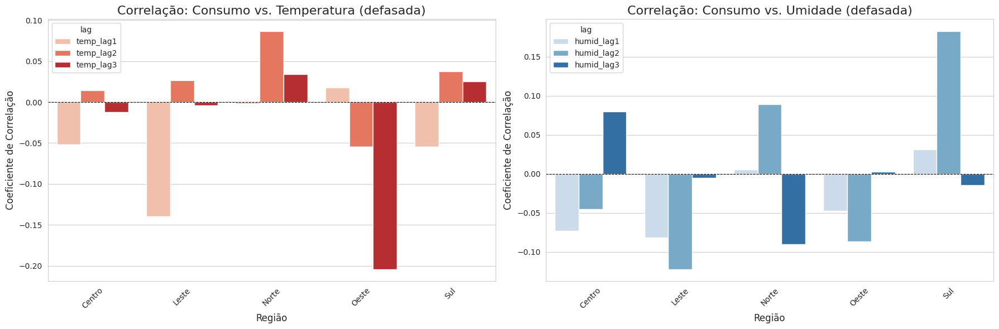

In [ ]:
query_completa_diaria = """
SELECT
    cli.region,
    c.date,
    AVG(c.consumption_kwh) AS avg_consumption,
    AVG(cl.temperature) AS avg_temperature,
    AVG(cl.humidity) AS avg_humidity
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
JOIN clima AS cl ON cli.region = cl.region AND c.date = cl.date
WHERE cli.region <> 'Desconhecida'
GROUP BY cli.region, c.date
ORDER BY cli.region, c.date;
"""
df_completo_diario = con.execute(query_completa_diaria).fetchdf()

df_completo_diario['date'] = pd.to_datetime(df_completo_diario['date'])

# Usa groupby e shift para criar os lags das variáveis climáticas
df_completo_diario['temp_lag1'] = df_completo_diario.groupby('region')['avg_temperature'].shift(1)
df_completo_diario['temp_lag2'] = df_completo_diario.groupby('region')['avg_temperature'].shift(2)
df_completo_diario['temp_lag3'] = df_completo_diario.groupby('region')['avg_temperature'].shift(3)

df_completo_diario['humid_lag1'] = df_completo_diario.groupby('region')['avg_humidity'].shift(1)
df_completo_diario['humid_lag2'] = df_completo_diario.groupby('region')['avg_humidity'].shift(2)
df_completo_diario['humid_lag3'] = df_completo_diario.groupby('region')['avg_humidity'].shift(3)

# --- Calcula a correlação cruzada ---
# Correlação: Consumo vs. Temperatura defasada
corr_temp = df_completo_diario.groupby('region').apply(
    lambda x: x[['avg_consumption', 'temp_lag1', 'temp_lag2', 'temp_lag3']].corr().loc['avg_consumption'], include_groups=False
)[['temp_lag1', 'temp_lag2', 'temp_lag3']].reset_index().melt(
    id_vars='region', var_name='lag', value_name='correlation'
)

# Correlação: Consumo vs. Umidade defasada
corr_humid = df_completo_diario.groupby('region').apply(
    lambda x: x[['avg_consumption', 'humid_lag1', 'humid_lag2', 'humid_lag3']].corr().loc['avg_consumption'], include_groups=False
)[['humid_lag1', 'humid_lag2', 'humid_lag3']].reset_index().melt(
    id_vars='region', var_name='lag', value_name='correlation'
)

# --- Visualiza os resultados com gráficos de barras lado a lado ---
fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# Gráfico da Correlação Cruzada com a Temperatura
sns.barplot(
    x='region', y='correlation', hue='lag', data=corr_temp, ax=axes[0], palette='Reds'
)
axes[0].set_title('Correlação: Consumo vs. Temperatura (defasada)', fontsize=16)
axes[0].set_xlabel('Região', fontsize=12)
axes[0].set_ylabel('Coeficiente de Correlação', fontsize=12)
axes[0].axhline(0, color='black', linestyle='--', linewidth=0.8)
axes[0].tick_params(axis='x', rotation=45)

# Gráfico da Correlação Cruzada com a Umidade
sns.barplot(
    x='region', y='correlation', hue='lag', data=corr_humid, ax=axes[1], palette='Blues'
)
axes[1].set_title('Correlação: Consumo vs. Umidade (defasada)', fontsize=16)
axes[1].set_xlabel('Região', fontsize=12)
axes[1].set_ylabel('Coeficiente de Correlação', fontsize=12)
axes[1].axhline(0, color='black', linestyle='--', linewidth=0.8)
axes[1].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.show()

A correlação aumentou para os dados com o lag, porém ainda não o suficiente (>0.5 ou < -0.5) para afirmar a existência da correlação.

De acordo com isso, **os dados de clima sozinhos não possuem informação preditiva** suficiente. Porém, a construção de features características das datas pode complementar os dados de clima e juntas gerarem uma predição mais assertiva, o que será explorado no próximo tópico.

## Análise Exploratória Temporal

### Construção das Features Temporais

Extração de informações úteis da data, como:
- **Flag Final de semana:** (is_final_semana) O consumo pode variar significativamente em fins de semana.
- **Número da semana**: O consumo pode ter padrões que se repetem semanalmente, o número da semana pode capturar esses padrões.
- **Número do Dia no mês:** Em alguns casos, o consumo pode ser afetado por eventos que ocorrem no início ou no fim do mês, como o recebimento de salários.
- **Flag para início e fim de mês** (is_inicio_mes, is_final_mes): O consumo pode ter um comportamento particular nos primeiros e últimos dias do mês, essas flags podem isolar esse efeito.
- **Mês:** Consumo tende a ser maior em meses mais quentes ou mais frios.
- **Estação do ano:** Relacionado ao mês.
- **Feriados:** Flag para identificar feriados, pois o consumo pode mudar nesses dias.
- **Flag de Feriado Prolongado** (is_feriado_prolongado): A duração de um feriado pode ter um impacto diferente no consumo. Um feriado de um dia pode ter um comportamento de consumo diferente de um feriado de três dias.


**OBS** Nem todas estas features serão usadas para modelagem, devido à multicolinearidade entre elas, a maioria será usada para a exploração gráficas dos dados.

In [ ]:
# Cria a tabela de calendário
query_calendario_sql = """
CREATE OR REPLACE TABLE calendario AS
    SELECT
        date,
        MONTH(date) AS month,
        DAY(date) AS day,
        --WEEKOFYEAR(date) AS week_of_year, -- o DuckDB (e a maioria dos sistemas de banco de dados) calcula o número da semana pela ISO 8601
        (CAST(strftime(date, '%W') AS BIGINT) + 1) AS week_of_year, -- CALCULA O NÚMERO DA SEMANA SEQUENCIALMENTE
        DAYOFWEEK(date) AS day_of_week,
        DAYOFYEAR(date) AS day_of_year,

        -- Dia da semana: 'is_final_semana' (0=domingo, 6=sábado)
        CASE
            WHEN DAYOFWEEK(date) IN (0, 6) THEN TRUE
            ELSE FALSE
        END AS is_final_semana,

        -- Estação do ano (Hemisfério Sul)
        CASE
            WHEN (MONTH(date) = 12 AND DAY(date) >= 21) OR (MONTH(date) IN (1, 2)) OR (MONTH(date) = 3 AND DAY(date) < 21) THEN 'Verao'
            WHEN (MONTH(date) = 3 AND DAY(date) >= 21) OR (MONTH(date) IN (4, 5)) OR (MONTH(date) = 6 AND DAY(date) < 21) THEN 'Outono'
            WHEN (MONTH(date) = 6 AND DAY(date) >= 21) OR (MONTH(date) IN (7, 8)) OR (MONTH(date) = 9 AND DAY(date) < 21) THEN 'Inverno'
            ELSE 'Primavera'
        END AS estacao,

        -- Feriados Nacionais Brasil
        CASE
            WHEN date IN ('2023-01-01', '2023-04-21', '2023-05-01', '2023-09-07', '2023-10-12', '2023-11-02', '2023-11-15', '2023-12-25') THEN TRUE
            ELSE FALSE
        END AS is_feriado,

        -- Flag para Feriado Prolongado
        CASE
            WHEN is_feriado = TRUE AND DAYOFWEEK(date) IN (1, 2, 4, 5) THEN TRUE
            ELSE FALSE
        END AS is_feriado_prolongado,

        CASE
            WHEN date IN ('2023-01-01', '2023-04-21', '2023-05-01', '2023-09-07', '2023-10-12', '2023-11-02', '2023-11-15', '2023-12-25') THEN 'Feriado'
            WHEN DAYOFWEEK(date) IN (1, 2, 4, 5) AND (date IN ('2023-01-01', '2023-04-21', '2023-05-01', '2023-09-07', '2023-10-12', '2023-11-02', '2023-11-15', '2023-12-25')) THEN 'Feriado Prolongado'
            ELSE 'Nenhum'
        END AS tipo_feriado,

        -- Flag para dia útil
        CASE
            WHEN DAYOFWEEK(date) IN (0, 6) OR date IN ('2023-01-01', '2023-04-21', '2023-05-01', '2023-09-07', '2023-10-12', '2023-11-02', '2023-11-15', '2023-12-25') THEN FALSE
            ELSE TRUE
        END AS is_dia_util,

        -- Flag para início e fim do mês
        CASE
            WHEN DAY(date) = 1 THEN TRUE
            ELSE FALSE
        END AS is_inicio_mes,
        CASE
            WHEN DAY(date) = DAY(LAST_DAY(date)) THEN TRUE
            ELSE FALSE
        END AS is_final_mes

    FROM (SELECT DISTINCT date FROM clima)
    ORDER BY date;
"""

con.execute(query_calendario_sql)

print("✅ Tabela 'calendario' criada com sucesso diretamente pelo DuckDB!")
print("\nPrimeiras 5 linhas da nova tabela:")
print(con.execute("SELECT * FROM calendario LIMIT 5;").fetchdf())


✅ Tabela 'calendario' criada com sucesso diretamente pelo DuckDB!

Primeiras 5 linhas da nova tabela:
        date  month  day  week_of_year  day_of_week  day_of_year  \
0 2023-01-01      1    1             1            0            1   
1 2023-01-02      1    2             2            1            2   
2 2023-01-03      1    3             2            2            3   
3 2023-01-04      1    4             2            3            4   
4 2023-01-05      1    5             2            4            5   

   is_final_semana estacao  is_feriado  is_feriado_prolongado tipo_feriado  \
0             True   Verao        True                  False      Feriado   
1            False   Verao       False                  False       Nenhum   
2            False   Verao       False                  False       Nenhum   
3            False   Verao       False                  False       Nenhum   
4            False   Verao       False                  False       Nenhum   

   is_dia_util  is_i

Geração de insights

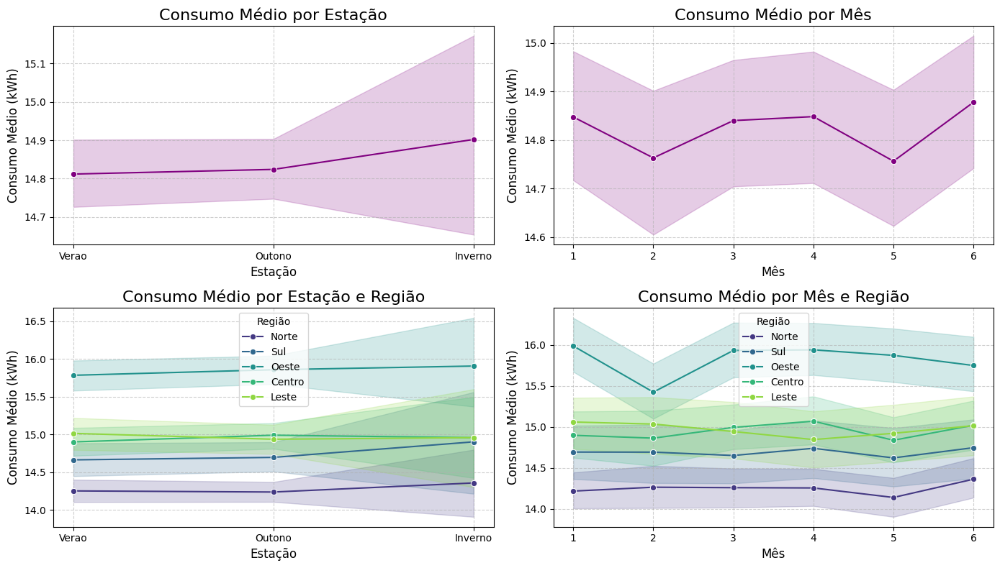

In [ ]:
# Query para unir consumo, clientes e a nova tabela de calendário
query_consumo_completo = """
SELECT
    c.consumption_kwh,
    cli.region,
    cal.estacao,
    cal.month
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
JOIN calendario AS cal ON c.date = cal.date
WHERE cli.region <> 'Desconhecida';
"""
df_completo = con.execute(query_consumo_completo).fetchdf()

# O Seaborn agrega os dados automaticamente, mas definir a ordem é importante
ordem_estacoes = ['Verao', 'Outono', 'Inverno', 'Primavera']
df_completo['estacao'] = pd.Categorical(df_completo['estacao'], categories=ordem_estacoes, ordered=True)

# --- Gera o grid de gráficos ---
fig, axes = plt.subplots(2, 2, figsize=(14, 8))

# 1. Consumo por Estação (Todos os clientes)
sns.lineplot(
    x='estacao', y='consumption_kwh', data=df_completo, estimator='mean', ax=axes[0, 0], marker='o',
    color='purple'
)
axes[0, 0].set_title('Consumo Médio por Estação', fontsize=16)
axes[0, 0].set_xlabel('Estação', fontsize=12)
axes[0, 0].set_ylabel('Consumo Médio (kWh)', fontsize=12)
axes[0, 0].grid(True, linestyle='--', alpha=0.6)

# 2. Consumo por Mês (Todos os clientes)
sns.lineplot(
    x='month', y='consumption_kwh', data=df_completo, estimator='mean', ax=axes[0, 1], marker='o',
    color='purple'
)
axes[0, 1].set_title('Consumo Médio por Mês', fontsize=16)
axes[0, 1].set_xlabel('Mês', fontsize=12)
axes[0, 1].set_ylabel('Consumo Médio (kWh)', fontsize=12)
axes[0, 1].grid(True, linestyle='--', alpha=0.6)

# 3. Consumo por Estação (Por Região)
sns.lineplot(
    x='estacao', y='consumption_kwh', hue='region', data=df_completo, estimator='mean', ax=axes[1, 0],
    marker='o', palette='viridis'
)
axes[1, 0].set_title('Consumo Médio por Estação e Região', fontsize=16)
axes[1, 0].set_xlabel('Estação', fontsize=12)
axes[1, 0].set_ylabel('Consumo Médio (kWh)', fontsize=12)
axes[1, 0].grid(True, linestyle='--', alpha=0.6)
axes[1, 0].legend(title='Região')

# 4. Consumo por Mês (Por Região)
sns.lineplot(
    x='month', y='consumption_kwh', hue='region', data=df_completo, estimator='mean', ax=axes[1, 1],
    marker='o', palette='viridis'
)
axes[1, 1].set_title('Consumo Médio por Mês e Região', fontsize=16)
axes[1, 1].set_xlabel('Mês', fontsize=12)
axes[1, 1].set_ylabel('Consumo Médio (kWh)', fontsize=12)
axes[1, 1].grid(True, linestyle='--', alpha=0.6)
axes[1, 1].legend(title='Região')

plt.tight_layout()
plt.show()

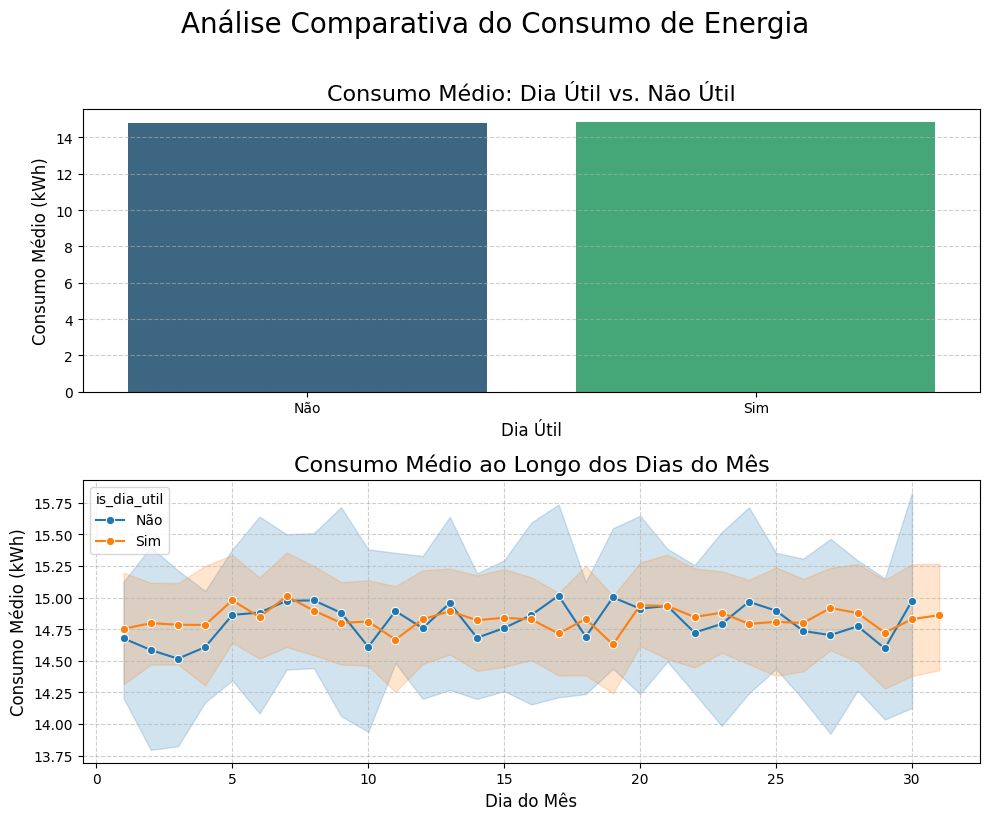

In [ ]:
query_consumo = """
    SELECT
        c.consumption_kwh,
        cal.is_dia_util,
        cal.day AS day_of_month,
        cal.is_inicio_mes,
        cal.is_final_mes
    FROM consumo AS c
    JOIN clientes AS cli ON c.client_id = cli.client_id
    JOIN calendario AS cal ON c.date = cal.date
    WHERE cli.region <> 'Desconhecida';
    """
df_consumo = con.execute(query_consumo).fetchdf()


# Para o primeiro gráfico: agrega a média de consumo por tipo de dia
df_consumo['is_dia_util'] = df_consumo['is_dia_util'].map({True: 'Sim', False: 'Não'})
df_comparacao_dias = df_consumo.groupby('is_dia_util')['consumption_kwh'].mean().reset_index()

fig, axes = plt.subplots(2, 1, figsize=(10, 8))
fig.suptitle('Análise Comparativa do Consumo de Energia', fontsize=20, y=1.02)

# --- Gráfico 1: Consumo Médio por Tipo de Dia ---
sns.barplot(
    x='is_dia_util', y='consumption_kwh', data=df_comparacao_dias, ax=axes[0],
    palette='viridis', hue='is_dia_util'
)
axes[0].set_title('Consumo Médio: Dia Útil vs. Não Útil', fontsize=16)
axes[0].set_xlabel('Dia Útil', fontsize=12)
axes[0].set_ylabel('Consumo Médio (kWh)', fontsize=12)
axes[0].grid(axis='y', linestyle='--', alpha=0.6)

# --- Gráfico 2: Consumo Médio ao Longo do Mês ---
sns.lineplot(
    x='day_of_month', y='consumption_kwh', data=df_consumo, estimator='mean', ax=axes[1],
    marker='o', color='darkblue', hue='is_dia_util'
)
axes[1].set_title('Consumo Médio ao Longo dos Dias do Mês', fontsize=16)
axes[1].set_xlabel('Dia do Mês', fontsize=12)
axes[1].set_ylabel('Consumo Médio (kWh)', fontsize=12)
axes[1].grid(True, linestyle='--', alpha=0.6)

plt.tight_layout()
plt.show()

Não houve diferença de consumo médio para dias úteis e não úteis, mas como a definição de "dia útil" não é estática e seu padrão de consumo pode ser influenciado por fatores sazonais como as férias escolares, abrirei a granularidade para enxergar o comportamento destes ao longo do mês.

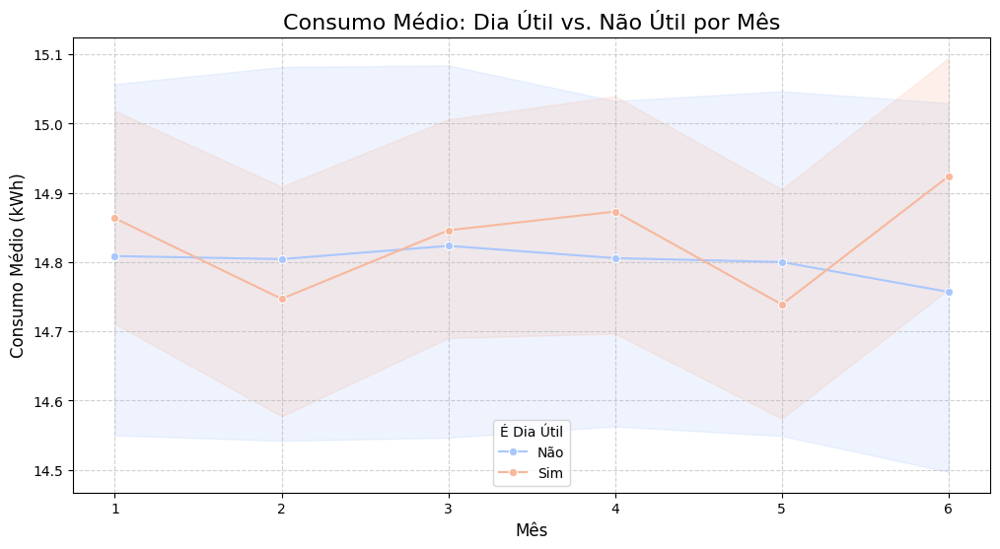

In [ ]:
query_consumo = """
    SELECT
        c.consumption_kwh,
        cal.is_dia_util,
        cal.month
    FROM consumo AS c
    JOIN clientes AS cli ON c.client_id = cli.client_id
    JOIN calendario AS cal ON c.date = cal.date
    WHERE cli.region <> 'Desconhecida';
    """
df_consumo = con.execute(query_consumo).fetchdf()

# Converte os valores booleanos para strings para a legenda
df_consumo['is_dia_util'] = df_consumo['is_dia_util'].map({True: 'Sim', False: 'Não'})

plt.figure(figsize=(12, 6))

sns.lineplot(
    x='month', y='consumption_kwh', hue='is_dia_util', data=df_consumo, estimator='mean',
    marker='o', palette='coolwarm'
)

plt.title('Consumo Médio: Dia Útil vs. Não Útil por Mês', fontsize=16)
plt.xlabel('Mês', fontsize=12)
plt.ylabel('Consumo Médio (kWh)', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.legend(title='É Dia Útil')

plt.show()

### Decomposição Temporal

Decomposição de tendência, sazonalidade e diferenciação.

--- Decomposição para o Consumo TOTAL ---


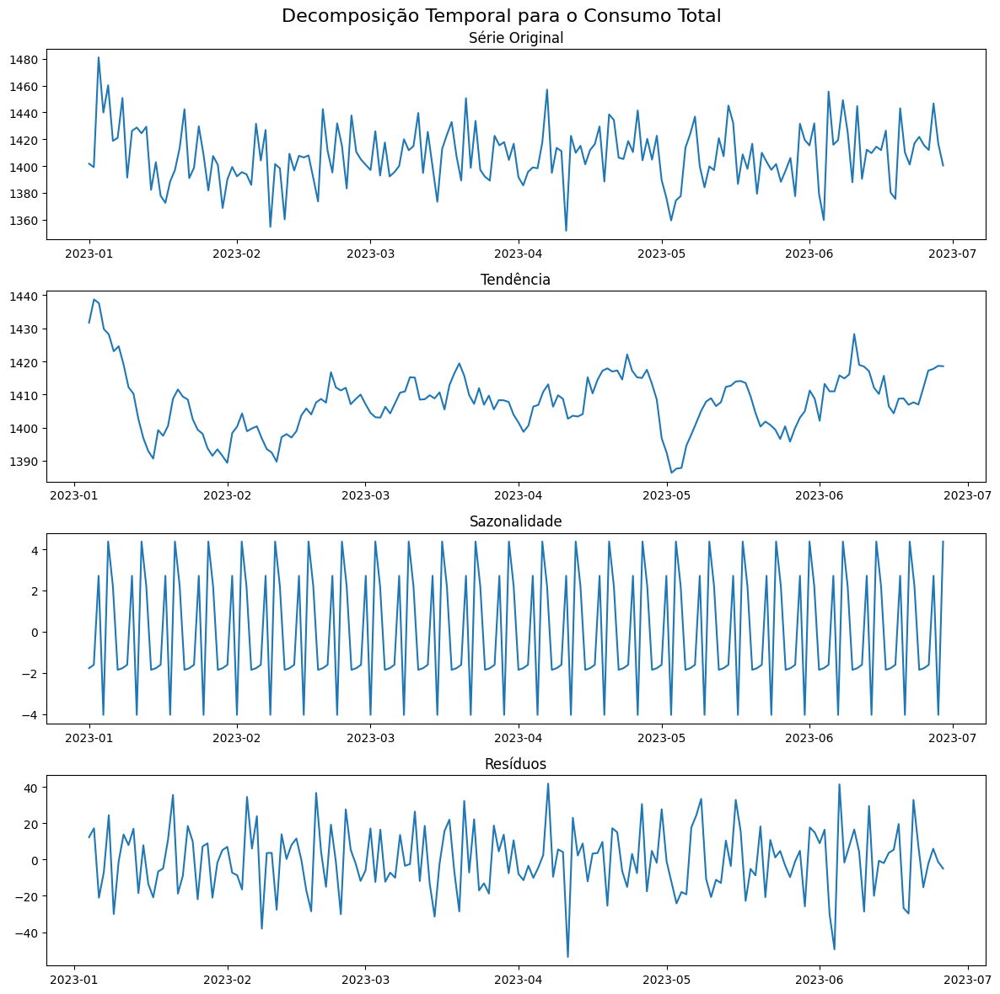

In [ ]:
query_consumo_diario = """
SELECT
    cal.date,
    cli.region,
    cli.client_id,
    SUM(c.consumption_kwh) AS total_consumption
FROM consumo AS c
JOIN clientes AS cli ON c.client_id = cli.client_id
JOIN calendario AS cal ON c.date = cal.date
WHERE cli.region <> 'Desconhecida'
GROUP BY cal.date, cli.region, cli.client_id
ORDER BY cal.date;
"""
df_consumo = con.execute(query_consumo_diario).fetchdf()
df_consumo['date'] = pd.to_datetime(df_consumo['date'])

def decompor_serie_consumo(df, por_regiao=False, por_cliente=False):
    if por_cliente:
        # Lógica por cliente
        for client_id in df['client_id'].unique():
            df_client = df[df['client_id'] == client_id].set_index('date')
            df_resampled = df_client['total_consumption'].resample('D').mean().to_frame()

            decomposition = seasonal_decompose(df_resampled['total_consumption'], model='additive', period=7)

            fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12))
            fig.suptitle(f'Decomposição Temporal para o Cliente: {client_id}', fontsize=16)

            axes[0].plot(df_resampled['total_consumption'])
            axes[0].set_title('Série Original', fontsize=12)
            axes[1].plot(decomposition.trend)
            axes[1].set_title('Tendência', fontsize=12)
            axes[2].plot(decomposition.seasonal)
            axes[2].set_title('Sazonalidade', fontsize=12)
            axes[3].plot(decomposition.resid)
            axes[3].set_title('Resíduos', fontsize=12)

            plt.tight_layout()
            plt.show()

    elif por_regiao:
        # --- ETAPA 1: DECOMPOSIÇÃO TEMPORAL POR REGIÃO E DADOS ORIGINAIS ---
        decomposed_series = {}
        original_series_list = []
        tendencia_df_decomposicao_list = []
        sazonalidade_df_list = []

        for region in df['region'].unique():
            df_region = df[df['region'] == region].groupby('date')['total_consumption'].sum().reset_index()
            df_resampled = df_region.set_index('date').resample('D').mean()

            # Adiciona a série original limpa à lista para ser usada na função de tendência
            df_temp_original = df_resampled.reset_index().rename(columns={'total_consumption': 'Valor'})
            df_temp_original['Região'] = region
            original_series_list.append(df_temp_original)

            decomposition = seasonal_decompose(df_resampled['total_consumption'], model='additive', period=7)
            decomposed_series[region] = {
                'Série Original': df_resampled['total_consumption'],
                'Tendência': decomposition.trend,
                'Sazonalidade': decomposition.seasonal,
                'Resíduos': decomposition.resid
            }

            df_tend = decomposition.trend.reset_index().dropna().rename(columns={'trend': 'Valor'})
            df_tend['Região'] = region
            tendencia_df_decomposicao_list.append(df_tend)

            df_sazonal = decomposition.seasonal.reset_index().dropna().rename(columns={'seasonal': 'Valor'})
            df_sazonal['Região'] = region
            sazonalidade_df_list.append(df_sazonal)

        # Concatena os DataFrames de forma segura e reordena
        original_series_df = pd.concat(original_series_list, ignore_index=True).sort_values(['Região', 'date'])
        tendencia_df_decomposicao = pd.concat(tendencia_df_decomposicao_list, ignore_index=True).sort_values(['Região', 'date'])
        sazonalidade_df = pd.concat(sazonalidade_df_list, ignore_index=True).sort_values(['Região', 'date'])

        # --- ETAPA 2: CÁLCULO DA ORDEM DOS GRÁFICOS E LEGENDAS ---
        mean_tendency_by_region = tendencia_df_decomposicao.groupby('Região')['Valor'].mean().sort_values(ascending=False)
        regions_ordered = mean_tendency_by_region.index.tolist()

        cores = list(mcolors.TABLEAU_COLORS.keys())[:len(regions_ordered)]
        region_colors = {region: cor for region, cor in zip(regions_ordered, cores)}

        # --- BLOCO 1: VISUALIZAÇÃO POR COMPONENTE DESAGRUPADO ---
        components = ['Série Original', 'Tendência', 'Sazonalidade', 'Resíduos']
        for component in components:
            fig, axes = plt.subplots(nrows=1, ncols=len(regions_ordered), figsize=(7 * len(regions_ordered), 6))
            fig.suptitle(f'Componente: {component} (Comparativo por Região)', fontsize=18)

            for i, region in enumerate(regions_ordered):
                color = region_colors[region]
                axes[i].plot(decomposed_series[region][component], color=color)
                axes[i].set_title(f'Região: {region}', fontsize=14, color=color)
                axes[i].grid(True, linestyle='--', alpha=0.6)
                axes[i].tick_params(axis='x', rotation=45)

            plt.tight_layout()
            plt.show()

        # --- BLOCO 2: ANÁLISE DE TENDÊNCIA E SAZONALIDADE AGRUPADOS ---
        fig, axes = plt.subplots(5, 1, figsize=(15, 30))

        # 1. Tendência (Absoluta) - Usando a decomposição para a tendência geral
        sns.lineplot(
            x='date', y='Valor', hue='Região', data=tendencia_df_decomposicao,
            palette=region_colors, legend='full', linewidth=2.5, ax=axes[0],
            hue_order=regions_ordered
        )
        axes[0].set_title('1. Tendência do Consumo por Região', fontsize=18)
        axes[0].set_xlabel('Data', fontsize=12)
        axes[0].set_ylabel('Valor da Tendência (kWh)', fontsize=12)
        axes[0].grid(True, linestyle='--', alpha=0.6)
        axes[0].legend(title='Região', bbox_to_anchor=(1.05, 1), loc='upper left')

        # Função auxiliar para calcular a tendência de curto prazo usando a decomposição com a janela certa
        def calcular_tendencia_e_variacao_janela(df, window_days):
            df_final = pd.DataFrame()
            end_date = df['date'].max()
            start_date = end_date - pd.Timedelta(days=window_days)

            for region in df['Região'].unique():
                df_region = df[df['Região'] == region].sort_values('date').copy()
                df_region = df_region.set_index('date')

                # Usando média móvel para calcular a tendência
                df_region['Valor'] = df_region['Valor'].rolling(window=window_days, min_periods=1, center=True).mean()
                df_tendencia = df_region.reset_index()

                df_filtered = df_tendencia[(df_tendencia['date'] > start_date) & (df_tendencia['date'] <= end_date)].copy()
                df_filtered['Região'] = region

                if not df_filtered.empty:
                    primeiro_valor = df_filtered['Valor'].iloc[0]
                    df_filtered['Valor Normalizado (%)'] = ((df_filtered['Valor'] / primeiro_valor) - 1) * 100
                else:
                    df_filtered['Valor Normalizado (%)'] = np.nan

                df_final = pd.concat([df_final, df_filtered], ignore_index=True)

            return df_final.sort_values(['Região', 'date'])

        # 2. Variação Percentual da Tendência (30 dias)
        tendencia_30d = calcular_tendencia_e_variacao_janela(original_series_df, 30)
        sns.lineplot(
            x='date', y='Valor Normalizado (%)', hue='Região', data=tendencia_30d,
            palette=region_colors, legend='full', linewidth=2.5, ax=axes[1],
            hue_order=regions_ordered
        )
        axes[1].set_title('2. Variação Percentual da Tendência (30 dias)', fontsize=18)
        axes[1].set_xlabel('Data', fontsize=12)
        axes[1].set_ylabel('Variação Relativa (%)', fontsize=12)
        axes[1].grid(True, linestyle='--', alpha=0.6)
        axes[1].legend(title='Região', bbox_to_anchor=(1.05, 1), loc='upper left')

        # 3. Variação Percentual da Tendência (15 dias)
        tendencia_15d = calcular_tendencia_e_variacao_janela(original_series_df, 15)
        sns.lineplot(
            x='date', y='Valor Normalizado (%)', hue='Região', data=tendencia_15d,
            palette=region_colors, legend='full', linewidth=2.5, ax=axes[2],
            hue_order=regions_ordered
        )
        axes[2].set_title('3. Variação Percentual da Tendência (15 dias)', fontsize=18)
        axes[2].set_xlabel('Data', fontsize=12)
        axes[2].set_ylabel('Variação Relativa (%)', fontsize=12)
        axes[2].grid(True, linestyle='--', alpha=0.6)
        axes[2].legend(title='Região', bbox_to_anchor=(1.05, 1), loc='upper left')

        # 4. Variação Percentual da Tendência (7 dias)
        tendencia_7d = calcular_tendencia_e_variacao_janela(original_series_df, 7)
        sns.lineplot(
            x='date', y='Valor Normalizado (%)', hue='Região', data=tendencia_7d,
            palette=region_colors, legend='full', linewidth=2.5, ax=axes[3],
            hue_order=regions_ordered
        )
        axes[3].set_title('4. Variação Percentual da Tendência (7 dias)', fontsize=18)
        axes[3].set_xlabel('Data', fontsize=12)
        axes[3].set_ylabel('Variação Relativa (%)', fontsize=12)
        axes[3].grid(True, linestyle='--', alpha=0.6)
        axes[3].legend(title='Região', bbox_to_anchor=(1.05, 1), loc='upper left')

        # 5. Sazonalidade (Janela Ajustada)
        def filter_data_by_window(df, window_days):
            end_date = df['date'].max()
            start_date = end_date - pd.Timedelta(days=window_days)
            return df[(df['date'] > start_date) & (df['date'] <= end_date)]

        sazonalidade_30d = filter_data_by_window(sazonalidade_df, 30)
        sns.lineplot(
            x='date', y='Valor', hue='Região', data=sazonalidade_30d,
            palette=region_colors, legend='full', linewidth=2.5, ax=axes[4],
            hue_order=regions_ordered
        )
        axes[4].set_title('5. Sazonalidade do Consumo por Região (Últimos 30 dias)', fontsize=18)
        axes[4].set_xlabel('Data', fontsize=12)
        axes[4].set_ylabel('Valor da Sazonalidade', fontsize=12)
        axes[4].grid(True, linestyle='--', alpha=0.6)
        axes[4].legend(title='Região', bbox_to_anchor=(1.05, 1), loc='upper left')

        plt.tight_layout()
        plt.show()

    else:
        # Lógica para decomposição total
        df_total = df.groupby('date')['total_consumption'].sum().reset_index().set_index('date')
        df_resampled = df_total.resample('D').mean()

        decomposition = seasonal_decompose(df_resampled['total_consumption'], model='additive', period=7)

        fig, axes = plt.subplots(nrows=4, ncols=1, figsize=(12, 12))
        fig.suptitle('Decomposição Temporal para o Consumo Total', fontsize=16)

        axes[0].plot(df_resampled['total_consumption'])
        axes[0].set_title('Série Original', fontsize=12)
        axes[1].plot(decomposition.trend)
        axes[1].set_title('Tendência', fontsize=12)
        axes[2].plot(decomposition.seasonal)
        axes[2].set_title('Sazonalidade', fontsize=12)
        axes[3].plot(decomposition.resid)
        axes[3].set_title('Resíduos', fontsize=12)

        plt.tight_layout()
        plt.show()

print("--- Decomposição para o Consumo TOTAL ---")
decompor_serie_consumo(df_consumo, por_cliente=False, por_regiao=False)

Os gráficos de Tendência agrupados mostram primeiro a tendência absoluta, e depois as variações percentuais para 3 janelas de tempo distintas (30, 15 e 7 dias).

Para as variações percentuais, é feito:
 - O cálculo da média móvel (média deslizante) sobre a série original para criar uma curva de tendência para cada janela (7, 15 e 30 dias);
 - A partir dessas novas curvas de tendência, que terão diferentes níveis de suavização, é feito o cálculo da variação percentual.


--- Decomposição para CADA REGIÃO ---


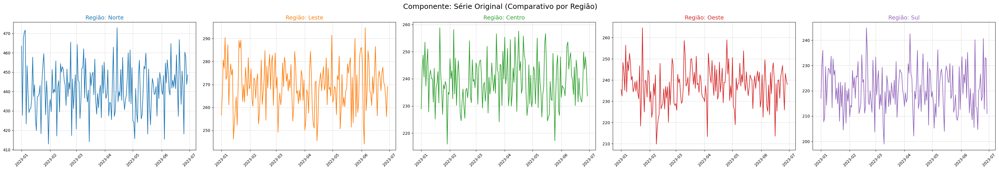

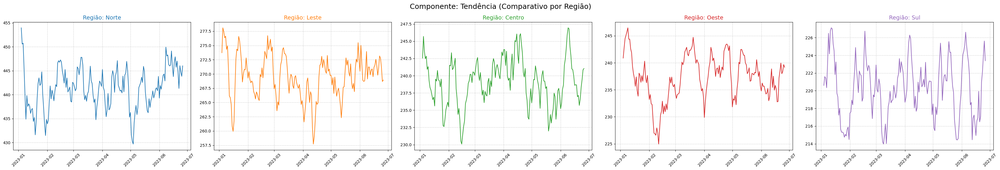

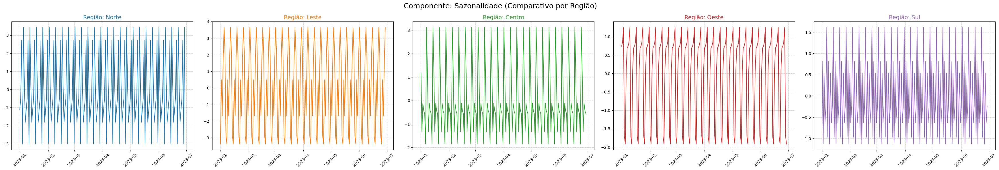

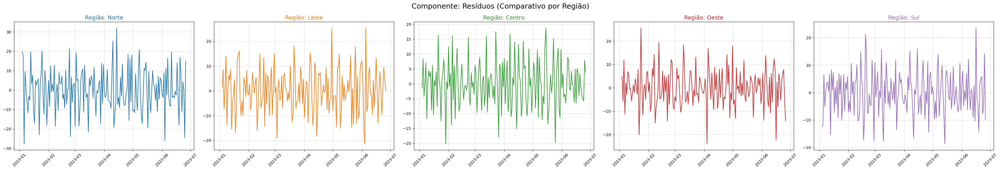

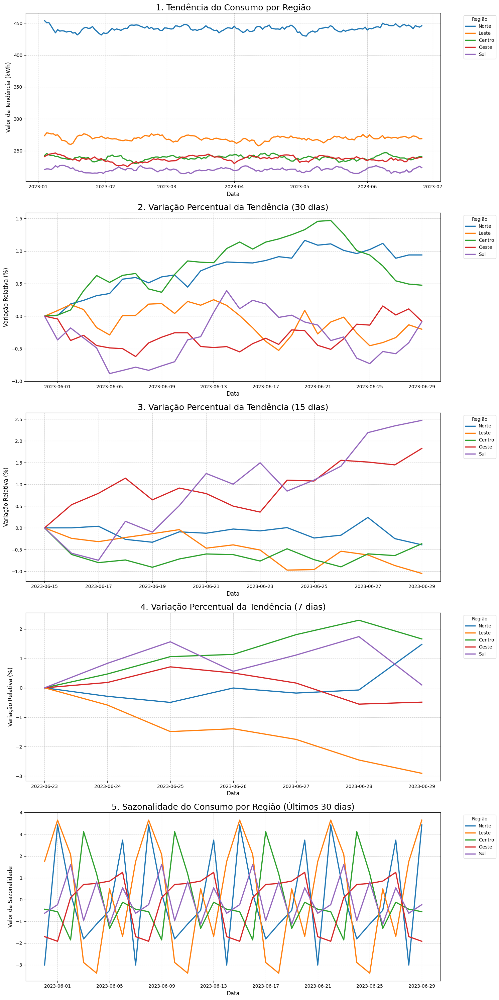

In [ ]:
print("\n--- Decomposição para CADA REGIÃO ---")
decompor_serie_consumo(df_consumo, por_cliente=False, por_regiao=True)


--- Decomposição para CADA CLIENTE (apenas para os 5 primeiros clientes) ---


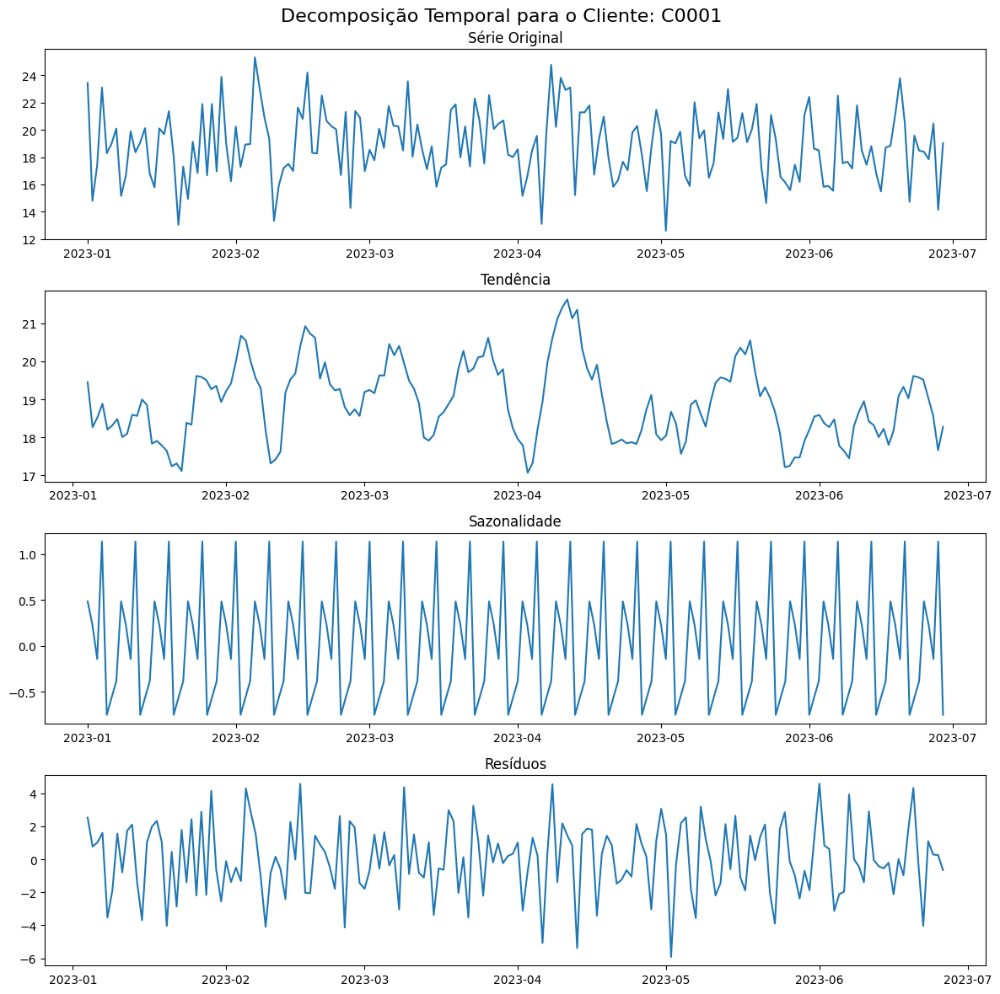

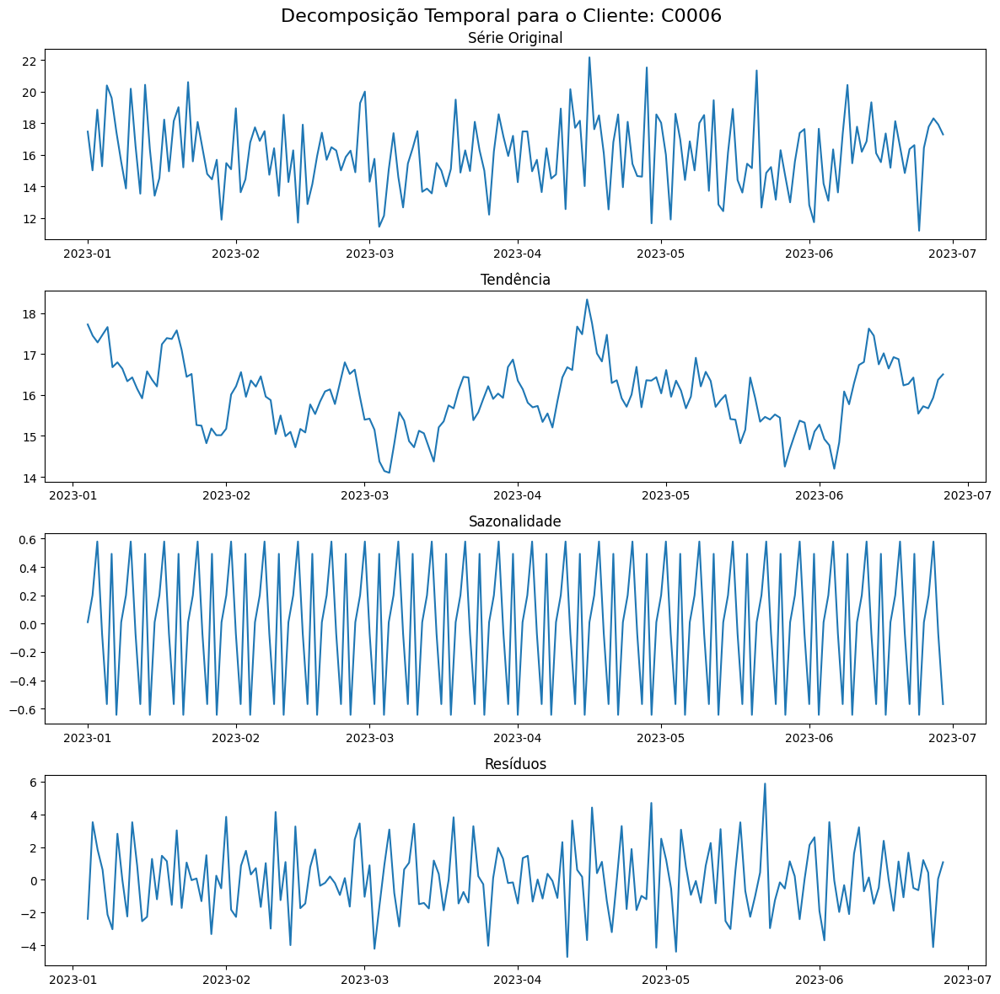

In [ ]:
print("\n--- Decomposição para CADA CLIENTE (apenas para os 2 primeiros clientes) ---")
# Para evitar a geração de muitos gráficos, vamos filtrar apenas alguns clientes.
clientes_amostra = df_consumo['client_id'].unique()[:2]
df_amostra = df_consumo[df_consumo['client_id'].isin(clientes_amostra)]
decompor_serie_consumo(df_amostra, por_cliente=True)

Verificação das premissas da modelagem estatística:
-

In [ ]:
def analise_componentes_series(df, col_categoria, col_data, col_valor, period):
    """
    Análise completa das componentes de séries temporais em um DataFrame.

    Parâmetros:
    df (pandas.DataFrame): DataFrame contendo as séries temporais.
    col_categoria (str): Nome da coluna que contém as categorias (ex: 'region').
    col_data (str): Nome da coluna de data (ex: 'date').
    col_valor (str): Nome da coluna que contém os valores da série temporal (ex: 'total_consumption').
    period (int): Período da sazonalidade (ex: 7 para dados diários com sazonalidade semanal).

    Retorna:
    pandas.DataFrame: DataFrame com os resultados da análise.
    """
    resultados = []
    warnings.filterwarnings("ignore", category=UserWarning)

    # Itera sobre as categorias únicas
    for categoria in df[col_categoria].unique():
        # Seleciona a série temporal da categoria atual e define a data como índice
        df_serie = df[df[col_categoria] == categoria].copy()
        df_serie = df_serie.set_index(col_data).sort_index()
        serie = df_serie[col_valor].dropna()

        # Verifica se a série tem dados suficientes
        if len(serie) < 2 * period:
            print(f"Aviso: Série para '{categoria}' é muito curta para a análise. Ignorando...")
            continue

        # Realiza o teste de Mann-Kendall para tendência
        mk_result = mk.original_test(serie)

        # Realiza uma regressão linear simples para a força da tendência
        X = np.arange(len(serie)).reshape(-1, 1)
        reg = LinearRegression().fit(X, serie)
        r2 = reg.score(X, serie)

        # Realiza a decomposição para calcular a força da sazonalidade
        decomposicao = seasonal_decompose(serie, model='additive', period=period)
        seasonal_strength = np.var(decomposicao.seasonal) / np.var(serie - decomposicao.trend)
        sazonalidade_presente = seasonal_strength > 0.36  # Considera sazonalidade se força > 0.36

        # Realiza o teste ADF (Augmented Dickey-Fuller) para estacionaridade
        adf_result = adfuller(serie)

        # Realiza o teste KPSS para estacionaridade
        kpss_result = kpss(serie, nlags='auto')

        # Realiza o teste de Ljung-Box para autocorrelação
        lb_result = acorr_ljungbox(serie, lags=[10], return_df=True)

        row = {
            f'{col_categoria}': categoria,
            'Tendência Presente (MK)': 'Sim' if mk_result.p < 0.05 else 'Não',
            'Força da Tendência (R² Regressão)': f'{r2:.2f}',
            'P-valor Tendência (MK)': f'{mk_result.p:.4f}',
            'Sazonalidade Presente': 'Sim' if sazonalidade_presente else 'Não',
            'Força da Sazonalidade': f'{seasonal_strength:.2f}',
            'Série Estacionária (ADF)': 'Sim' if adf_result[1] < 0.05 else 'Não',
            'P-valor ADF': f'{adf_result[1]:.4f}',
            'Série Estacionária (KPSS)': 'Sim' if kpss_result[1] >= 0.05 else 'Não',
            'P-valor KPSS': f'{kpss_result[1]:.4f}',
            'Autocorrelação Presente (LB)': 'Sim' if lb_result['lb_pvalue'].values[0] < 0.05 else 'Não',
            'P-valor Ljung-Box': f'{lb_result["lb_pvalue"].values[0]:.4f}'
        }
        resultados.append(row)
        df_resultados = pd.DataFrame(resultados)
    if col_categoria == 'client_id':
        resumo_contagem = {
            'Tendência Presente (MK)': df_resultados['Tendência Presente (MK)'].value_counts(),
            'Sazonalidade Presente': df_resultados['Sazonalidade Presente'].value_counts(),
            'Série Estacionária (ADF)': df_resultados['Série Estacionária (ADF)'].value_counts()
        }

        # Converte o dicionário de contagens para um DataFrame e o preenche com 0s se necessário
        df_resumo = pd.DataFrame(resumo_contagem).fillna(0).astype(int)
        return df_resultados, df_resumo

    return df_resultados

In [ ]:
query_consumo_diario = """
    SELECT
        cal.date,
        cli.region,
        SUM(c.consumption_kwh) AS total_consumption
    FROM consumo AS c
    JOIN clientes AS cli ON c.client_id = cli.client_id
    JOIN calendario AS cal ON c.date = cal.date
    WHERE cli.region <> 'Desconhecida'
    GROUP BY cal.date, cli.region
    ORDER BY cal.date;
    """
df_consumo = con.execute(query_consumo_diario).fetchdf()
df_consumo['date'] = pd.to_datetime(df_consumo['date'])

# --- Chamada da função para o seu DataFrame ---
tabela_de_diagnostico = analise_componentes_series(
    df=df_consumo,
    col_categoria='region',
    col_data='date',
    col_valor='total_consumption',
    period=3
)

print("\n--- Tabela de Diagnóstico das Séries Temporais por Região (janela de 3 dias) \n\n---")
tabela_de_diagnostico.head()



--- Tabela de Diagnóstico das Séries Temporais por Região (janela de 3 dias) 

---


,region,Tendência Presente (MK),Força da Tendência (R² Regressão),P-valor Tendência (MK),Sazonalidade Presente,Força da Sazonalidade,Série Estacionária (ADF),P-valor ADF,Série Estacionária (KPSS),P-valor KPSS,Autocorrelação Presente (LB),P-valor Ljung-Box
0,Norte,Não,0.00,0.3503,Não,0.02,Sim,0.0000,Sim,0.1000,Não,0.6488
1,Sul,Não,0.00,0.8219,Não,0.02,Sim,0.0000,Sim,0.1000,Não,0.8962
2,Centro,Não,0.00,0.7628,Não,0.01,Sim,0.0000,Sim,0.1000,Não,0.9533
3,Leste,Não,0.00,0.6695,Não,0.01,Sim,0.0000,Sim,0.1000,Não,0.2511
4,Oeste,Não,0.00,0.4557,Não,0.02,Sim,0.0000,Sim,0.1000,Não,0.0848


In [ ]:
tabela_de_diagnostico = analise_componentes_series(
    df=df_consumo,
    col_categoria='region',
    col_data='date',
    col_valor='total_consumption',
    period=7
)

print("\n--- Tabela de Diagnóstico das Séries Temporais por Região (janela de 7 dias) \n\n---")
tabela_de_diagnostico.head()



--- Tabela de Diagnóstico das Séries Temporais por Região (janela de 15 dias) 

---


,region,Tendência Presente (MK),Força da Tendência (R² Regressão),P-valor Tendência (MK),Sazonalidade Presente,Força da Sazonalidade,Série Estacionária (ADF),P-valor ADF,Série Estacionária (KPSS),P-valor KPSS,Autocorrelação Presente (LB),P-valor Ljung-Box
0,Norte,Não,0.00,0.3503,Não,0.04,Sim,0.0000,Sim,0.1000,Não,0.6488
1,Sul,Não,0.00,0.8219,Não,0.01,Sim,0.0000,Sim,0.1000,Não,0.8962
2,Centro,Não,0.00,0.7628,Não,0.04,Sim,0.0000,Sim,0.1000,Não,0.9533
3,Leste,Não,0.00,0.6695,Não,0.07,Sim,0.0000,Sim,0.1000,Não,0.2511
4,Oeste,Não,0.00,0.4557,Não,0.02,Sim,0.0000,Sim,0.1000,Não,0.0848


In [ ]:
tabela_de_diagnostico = analise_componentes_series(
    df=df_consumo,
    col_categoria='region',
    col_data='date',
    col_valor='total_consumption',
    period=15
)

print("\n--- Tabela de Diagnóstico das Séries Temporais por Região (janela de 15 dias) \n\n---")
tabela_de_diagnostico.head()


--- Tabela de Diagnóstico das Séries Temporais por Região (janela de 15 dias) 

---


,region,Tendência Presente (MK),Força da Tendência (R² Regressão),P-valor Tendência (MK),Sazonalidade Presente,Força da Sazonalidade,Série Estacionária (ADF),P-valor ADF,Série Estacionária (KPSS),P-valor KPSS,Autocorrelação Presente (LB),P-valor Ljung-Box
0,Norte,Não,0.00,0.3503,Não,0.09,Sim,0.0000,Sim,0.1000,Não,0.6488
1,Sul,Não,0.00,0.8219,Não,0.16,Sim,0.0000,Sim,0.1000,Não,0.8962
2,Centro,Não,0.00,0.7628,Não,0.14,Sim,0.0000,Sim,0.1000,Não,0.9533
3,Leste,Não,0.00,0.6695,Não,0.07,Sim,0.0000,Sim,0.1000,Não,0.2511
4,Oeste,Não,0.00,0.4557,Não,0.11,Sim,0.0000,Sim,0.1000,Não,0.0848


In [ ]:
query_consumo_cliente = """
    SELECT
        cal.date,
        cli.client_id,
        SUM(c.consumption_kwh) AS total_consumption
    FROM consumo AS c
    JOIN clientes AS cli ON c.client_id = cli.client_id
    JOIN calendario AS cal ON c.date = cal.date
    WHERE cli.region <> 'Desconhecida'
    GROUP BY cal.date, cli.client_id
    ORDER BY cal.date;
    """
df_consumo_cliente = con.execute(query_consumo_cliente).fetchdf()

tabela_de_diagnostico, resumo = analise_componentes_series(
    df=df_consumo_cliente,
    col_categoria='client_id',
    col_data='date',
    col_valor='total_consumption',
    period=3
)

print("\n--- Tabela de Diagnóstico das Séries Temporais por Cliente (janela de 3 dias) \n\n---")
tabela_de_diagnostico.head()


--- Tabela de Diagnóstico das Séries Temporais por Cliente (janela de 3 dias) 

---


,client_id,Tendência Presente (MK),Força da Tendência (R² Regressão),P-valor Tendência (MK),Sazonalidade Presente,Força da Sazonalidade,Série Estacionária (ADF),P-valor ADF,Série Estacionária (KPSS),P-valor KPSS,Autocorrelação Presente (LB),P-valor Ljung-Box
0,C0000,Não,0.02,0.0730,Não,0.01,Sim,0.0000,Sim,0.1000,Não,0.8065
1,C0003,Não,0.00,0.5337,Não,0.06,Sim,0.0000,Sim,0.1000,Não,0.3468
2,C0004,Não,0.00,0.6551,Não,0.03,Sim,0.0001,Sim,0.1000,Sim,0.0151
3,C0005,Não,0.00,0.7393,Não,0.01,Sim,0.0000,Sim,0.1000,Não,0.0693
4,C0007,Não,0.01,0.0944,Não,0.02,Sim,0.0000,Sim,0.1000,Não,0.3475


In [ ]:
resumo.head()

,Tendência Presente (MK),Sazonalidade Presente,Série Estacionária (ADF)
Não,91,95,0
Sim,4,0,95


In [ ]:
query_consumo_cliente = """
    SELECT
        cal.date,
        cli.client_id,
        SUM(c.consumption_kwh) AS total_consumption
    FROM consumo AS c
    JOIN clientes AS cli ON c.client_id = cli.client_id
    JOIN calendario AS cal ON c.date = cal.date
    WHERE cli.region <> 'Desconhecida'
    GROUP BY cal.date, cli.client_id
    ORDER BY cal.date;
    """
df_consumo_cliente = con.execute(query_consumo_cliente).fetchdf()

tabela_de_diagnostico, resumo = analise_componentes_series(
    df=df_consumo_cliente,
    col_categoria='client_id',
    col_data='date',
    col_valor='total_consumption',
    period=7
)

print("\n--- Tabela de Diagnóstico das Séries Temporais por Cliente (janela de 7 dias) \n\n---")
tabela_de_diagnostico.head()


--- Tabela de Diagnóstico das Séries Temporais por Cliente (janela de 7 dias) 

---


,client_id,Tendência Presente (MK),Força da Tendência (R² Regressão),P-valor Tendência (MK),Sazonalidade Presente,Força da Sazonalidade,Série Estacionária (ADF),P-valor ADF,Série Estacionária (KPSS),P-valor KPSS,Autocorrelação Presente (LB),P-valor Ljung-Box
0,C0001,Não,0.00,0.4700,Não,0.08,Sim,0.0000,Sim,0.1000,Não,0.8317
1,C0002,Não,0.00,0.9349,Não,0.01,Sim,0.0000,Sim,0.1000,Não,0.6195
2,C0006,Não,0.00,0.8878,Não,0.04,Sim,0.0000,Sim,0.1000,Não,0.5477
3,C0008,Não,0.01,0.3086,Não,0.02,Sim,0.0000,Sim,0.1000,Não,0.7578
4,C0009,Não,0.02,0.0937,Não,0.02,Sim,0.0000,Sim,0.0667,Não,0.6378


In [ ]:
resumo.head()

,Tendência Presente (MK),Sazonalidade Presente,Série Estacionária (ADF)
Não,91,95,0
Sim,4,0,95


In [ ]:
query_consumo_cliente = """
    SELECT
        cal.date,
        cli.client_id,
        SUM(c.consumption_kwh) AS total_consumption
    FROM consumo AS c
    JOIN clientes AS cli ON c.client_id = cli.client_id
    JOIN calendario AS cal ON c.date = cal.date
    WHERE cli.region <> 'Desconhecida'
    GROUP BY cal.date, cli.client_id
    ORDER BY cal.date;
    """
df_consumo_cliente = con.execute(query_consumo_cliente).fetchdf()

tabela_de_diagnostico, resumo = analise_componentes_series(
    df=df_consumo_cliente,
    col_categoria='client_id',
    col_data='date',
    col_valor='total_consumption',
    period=15
)

print("\n--- Tabela de Diagnóstico das Séries Temporais por Cliente (janela de 15 dias) \n\n---")
tabela_de_diagnostico.head()


--- Tabela de Diagnóstico das Séries Temporais por Cliente (janela de 15 dias) 

---


,client_id,Tendência Presente (MK),Força da Tendência (R² Regressão),P-valor Tendência (MK),Sazonalidade Presente,Força da Sazonalidade,Série Estacionária (ADF),P-valor ADF,Série Estacionária (KPSS),P-valor KPSS,Autocorrelação Presente (LB),P-valor Ljung-Box
0,C0000,Não,0.02,0.0730,Não,0.08,Sim,0.0000,Sim,0.1000,Não,0.8065
1,C0003,Não,0.00,0.5337,Não,0.12,Sim,0.0000,Sim,0.1000,Não,0.3468
2,C0004,Não,0.00,0.6551,Não,0.07,Sim,0.0001,Sim,0.1000,Sim,0.0151
3,C0005,Não,0.00,0.7393,Não,0.12,Sim,0.0000,Sim,0.1000,Não,0.0693
4,C0007,Não,0.01,0.0944,Não,0.12,Sim,0.0000,Sim,0.1000,Não,0.3475


In [ ]:
resumo.head()

,Tendência Presente (MK),Sazonalidade Presente,Série Estacionária (ADF)
Não,91,95,0
Sim,4,0,95


#### Conclusão da Decomposição Temporal

- **Sazonalidade fraca (period=3, 7 e 15)**: Os testes não detectaram sazonalidade semanal ou quinzenal, isso sugere que a série não tem um padrão de consumo que se repete de forma significativa nesses intervalos. Ou o padrão é muito sutil, ou ele realmente não existe nos seus dados;
- **Séries Estacionárias:** Os testes de estacionariedade confirmaram que as séries já são estacionárias.

Dadas estas circunstâncias, dentre os modelos tradicionais, o ARIMAX se torna o mais apropriado. **O modelo ARIMAX (ARIMA with eXogenous variables)** pode ser usado para modelar séries estacionárias e incluir variáveis externas como temperatura e umidade, sem a necessidade de um componente sazonal. Ele usa os mesmos princípios de autoregressão e médias móveis, mas se concentra nas dinâmicas não sazonais.

# Feature Engineering

Construção de features adicionais a partir da interação das variáveis, seleção e transformação final dos dados para o formato do treinamento✅

In [ ]:
query_create_features = """
CREATE OR REPLACE TABLE features AS
SELECT
    c.date,
    c.client_id,
    c.consumption_kwh AS total_consumption,
    cl.temperature as avg_temperature,
    cl.humidity as avg_humidity,
    cl.temperature * cl.humidity AS temp_humid_interaction,
    ROW_NUMBER() OVER (PARTITION BY c.client_id ORDER BY c.date) AS day_counter,
     LAG(c.consumption_kwh, 1) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_1,
    LAG(c.consumption_kwh, 2) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_2,
    LAG(c.consumption_kwh, 3) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_3,
    LAG(c.consumption_kwh, 4) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_4,
    LAG(c.consumption_kwh, 7) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_7,
    LAG(c.consumption_kwh, 15) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_15,

    -- Features de janela de rolagem
    AVG(c.consumption_kwh) OVER (PARTITION BY c.client_id ORDER BY c.date ROWS BETWEEN 3 PRECEDING AND 1 PRECEDING) AS rolling_mean_3,
    STDDEV(c.consumption_kwh) OVER (PARTITION BY c.client_id ORDER BY c.date ROWS BETWEEN 3 PRECEDING AND 1 PRECEDING) AS rolling_std_3,
    AVG(c.consumption_kwh) OVER (PARTITION BY c.client_id ORDER BY c.date ROWS BETWEEN 7 PRECEDING AND 1 PRECEDING) AS rolling_mean_7,
    STDDEV(c.consumption_kwh) OVER (PARTITION BY c.client_id ORDER BY c.date ROWS BETWEEN 7 PRECEDING AND 1 PRECEDING) AS rolling_std_7,

    -- Feature de diferença de lag
    c.consumption_kwh - LAG(c.consumption_kwh, 1) OVER (PARTITION BY c.client_id ORDER BY c.date) AS diff_lag_1


FROM
    consumo AS c
JOIN
    clientes AS cli ON c.client_id = cli.client_id
LEFT JOIN
    clima AS cl ON c.date = cl.date AND cli.region = cl.region
ORDER BY
    c.client_id, c.date;
"""

con.execute(query_create_features)

# Confirmação: Exibe as colunas e o número de linhas da nova tabela
print("Tabela 'features' criada com sucesso!")

# Exibe o schema da nova tabela
schema_info = con.execute("DESCRIBE features;").fetchdf()
print("\nEstrutura da Tabela 'features':")
print(schema_info)

num_rows = con.execute("SELECT COUNT(*) FROM features;").fetchone()[0]
print(f"\nNúmero de linhas na tabela 'features': {num_rows}")

df_features = con.execute("SELECT * FROM features LIMIT 5;").fetchdf()
df_features.head()

Tabela 'features' criada com sucesso!

Estrutura da Tabela 'features':
               column_name column_type null   key default extra
0                     date   TIMESTAMP  YES  None    None  None
1                client_id     VARCHAR  YES  None    None  None
2        total_consumption      DOUBLE  YES  None    None  None
3          avg_temperature      DOUBLE  YES  None    None  None
4             avg_humidity      DOUBLE  YES  None    None  None
5   temp_humid_interaction      DOUBLE  YES  None    None  None
6              day_counter      BIGINT  YES  None    None  None
7        consumption_lag_1      DOUBLE  YES  None    None  None
8        consumption_lag_2      DOUBLE  YES  None    None  None
9        consumption_lag_3      DOUBLE  YES  None    None  None
10       consumption_lag_4      DOUBLE  YES  None    None  None
11       consumption_lag_7      DOUBLE  YES  None    None  None
12      consumption_lag_15      DOUBLE  YES  None    None  None
13          rolling_mean_3      D

,date,client_id,total_consumption,avg_temperature,avg_humidity,temp_humid_interaction,day_counter,consumption_lag_1,consumption_lag_2,consumption_lag_3,consumption_lag_4,consumption_lag_7,consumption_lag_15,rolling_mean_3,rolling_std_3,rolling_mean_7,rolling_std_7,diff_lag_1
0,2023-01-01,C0000,18.64,27.090625,59.068750,1600.209355,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2023-01-02,C0000,16.63,27.090625,59.206250,1603.934316,2,18.64,NaN,NaN,NaN,NaN,NaN,18.640000,NaN,18.640000,NaN,-2.01
2,2023-01-03,C0000,18.11,24.325000,59.365625,1444.068828,3,16.63,18.64,NaN,NaN,NaN,NaN,17.635000,1.421285,17.635000,1.421285,1.48
3,2023-01-04,C0000,18.25,23.987500,57.340625,1375.458242,4,18.11,16.63,18.64,NaN,NaN,NaN,17.793333,1.041745,17.793333,1.041745,0.14
4,2023-01-05,C0000,19.81,25.200000,59.921875,1510.031250,5,18.25,18.11,16.63,18.64,NaN,NaN,17.663333,0.897626,17.907500,0.880696,1.56


## Feature Selection

Colunas Selecionadas e a Justificativa de Uso:
- **total_consumption:** Esta é a nossa variável-alvo, o que queremos prever. É a coluna central do nosso modelo.
- **avg_temperature e avg_humidity:** Mesmo tendo criado a feature de interação, é útil manter as variáveis brutas. Elas permitem que o modelo capture tanto o efeito isolado da temperatura e umidade quanto o efeito combinado.
- **temp_humid_interaction:** Ela captura o efeito conjunto da temperatura e umidade, que muitas vezes é um preditor mais forte do consumo de energia do que cada variável individualmente. Porém, este termo de interação é mais útil para modelos de árvores de decisão como o LightGBM, que consegue usá-lo de forma mais eficaz. No ARIMAX, desconsiderá-lo.
- **day_counter:** É uma feature simples, mas essencial para o modelo global de aprendizagem. Ela ajuda o modelo a capturar qualquer tendência linear subjacente nos dados que não esteja ligada diretamente a ciclos sazonais ou a fatores climáticos.
- **day_of_week_name e month** (variáveis binárias): Mesmo que os testes estatísticos não tenham encontrado sazonalidade forte, a maioria das séries de consumo tem padrões semanais e mensais. O uso de variáveis binárias (dummys) para o dia da semana e o mês permite que o modelo capture de forma flexível e robusta qualquer diferença no consumo entre, por exemplo, um sábado e uma quarta-feira, ou entre o verão e o inverno.
- **tipo_feriado**: A consolidação das variações de um feriado, o normal e o prolongado;
- **lags de consumo**: Serão usadas apenas na modelagem de árvore. Uma primeira versão com lags de 1, 7 e 15 dias gerou previsões com baixa precisão, então foram criados lags de 1, 2, 3, 4, 7 e 15.
- **Rolling Features**: Serão usadas apenas na modelagem de árvore, compostas pela média (rolling_mean) e o desvio padrão (rolling_std) do consumo nos últimos 3, 7 ou 14 dias. Essas features ajudam o modelo a entender a tendência e a volatilidade recente da série.
- **Diferenças de Lag**: Diferença entre o valor atual e o lag de 1 (consumption - consumption_lag_1). Isso ajuda o modelo a focar nas mudanças de curto prazo em vez dos valores absolutos. Usado na modelagem de árvore.



Colunas Redundantes com day_of_week_name e month:
- **day e day_of_year**: Essas colunas são redundantes, pois o month e o day_of_week já dão ao modelo o contexto da data. Usar o day ou o day_of_year junto com o month e day_of_week resultaria em alta multicolinearidade.
- **is_final_semana e is_dia_util**: Estas colunas são um subconjunto do day_of_week. Se o modelo sabe que o dia é 'saturday' ou 'sunday', ele já tem a informação de que é final de semana. Usar ambas seria redundante.
- **estacao** A estação do ano é uma informação que está altamente correlacionada com o month. As variáveis binárias de month são mais granulares e permitem ao modelo capturar variações mais detalhadas (6 categorias) do que apenas 3 estações, que é o que está presente nos dados.
- **is_inicio_mes e is_final_mes:** O month já dá o contexto do mês. Embora essas variáveis possam ser úteis, a sua informação pode ser capturada por uma combinação de outras features. Por uma questão de parcimônia, é melhor começar sem elas.
- **week_of_year:** É uma feature útil, mas muitas vezes está correlacionada com o month. Optei por começar com a feature mais simples e diretamente ligada aos ciclos esperados.
- **is_feriado e is_feriado_prolongado**: São redundantes, e forma consolidados na feature tipo_feriado;

Outras colunas desconsideradas:
- **region**: Foi intencionalmente deixada de fora do conjunto final de dados por um motivo crucial relacionado à granularidade desejada para o modelo. O nosso conjunto de dados, dados_arimax, está no nível mais baixo de detalhe: consumo diário por cliente (client_id). A coluna region é uma categoria de nível superior que agrupa vários clientes. Se a mantivéssemos, estaríamos introduzindo uma variável redundante.

# Modelagem Preditiva

Treinamento de pelo menos dois modelos preditivos✅

## Modelo A : ARIMAX

**ARIMAX:** Melhor que o ARIMA para este caso, pois permite **incluir variáveis exógenas** como temperatura, umidade, dia da semana e feriados. Isso é fundamental para incorporar o impacto do clima e dos fatores temporais no consumo. Ele é projetado especificamente para dados sequenciais e consegue modelar a dependência temporal do consumo, ao mesmo tempo em que considera as variáveis externas.

**Porém, este tipo de modelo é essencialmente univariados**. Na prática, quando se usa ARIMAX para múltiplos clientes, a abordagem padrão é treinar um modelo ARIMAX separado para cada cliente. Isso porque a estrutura temporal do consumo (suas ordens AR, MA) pode variar de cliente para cliente. Tentar "generalizar" as ordens para todos os clientes em um único ARIMAX não faria sentido, pois a premissa do modelo é capturar as características intrínsecas daquela série específica.

Como verificamos que as features de clima possuem valores estáveis, não há necessidade de transformação de escala das variáveis de entrada.

In [ ]:
# --- SQL para dados COMPLETOS (região conhecida) ---
query_completa = """
CREATE OR REPLACE TABLE dados_arimax_completo AS
SELECT
    f.date, f.client_id, f.total_consumption, f.avg_temperature, f.avg_humidity,
    cal.day_of_week AS day_of_week_name, cal.month,
    cal.tipo_feriado
FROM features AS f
JOIN clientes AS cli ON f.client_id = cli.client_id
JOIN calendario AS cal ON f.date = cal.date
WHERE cli.region <> 'Desconhecida'
ORDER BY f.client_id, f.date;
"""
con.execute(query_completa)
print("Tabela 'dados_arimax_completo' criada com sucesso. ✅")

# --- SQL para dados INCOMPLETOS (região desconhecida) ---
query_incom = """
CREATE OR REPLACE TABLE dados_arimax_desconhecido AS
SELECT
    f.date, f.client_id, f.total_consumption,
    cal.day_of_week AS day_of_week_name, cal.month,
    cal.tipo_feriado
FROM features AS f
JOIN clientes AS cli ON f.client_id = cli.client_id
JOIN calendario AS cal ON f.date = cal.date
WHERE cli.region = 'Desconhecida'
ORDER BY f.client_id, f.date;
"""
con.execute(query_incom)
print("Tabela 'dados_arimax_desconhecido' criada com sucesso. ✅")

# Carrega os dados para o Pandas
df_completo = con.execute("SELECT * FROM dados_arimax_completo").fetchdf()
df_desconhecido = con.execute("SELECT * FROM dados_arimax_desconhecido").fetchdf()

Tabela 'dados_arimax_completo' criada com sucesso. ✅
Tabela 'dados_arimax_desconhecido' criada com sucesso. ✅


Para o modelo ARIMAX, a melhor abordagem é transformar as colunas categóricas em booleanas pelo One-Hot Encoding, pois sendo um modelo linear, ele não consegue lidar com variáveis categóricas diretamente (ex: uma coluna com valores 'Monday', 'Tuesday', 'Wednesday'). Ele precisa que suas features sejam numéricas.



In [ ]:
# --- Transformações no Pandas ---
# Garante que a coluna de data seja do tipo datetime e a define como índice
df_completo['date'] = pd.to_datetime(df_completo['date'])
df_completo = df_completo.set_index('date').sort_index()

# Cria variáveis dummy para dia da semana e mês
df_completo = pd.get_dummies(df_completo, columns=['day_of_week_name', 'month'], drop_first=True)
df_completo.head()

,client_id,total_consumption,avg_temperature,avg_humidity,tipo_feriado,day_of_week_name_1,day_of_week_name_2,day_of_week_name_3,day_of_week_name_4,day_of_week_name_5,day_of_week_name_6,month_2,month_3,month_4,month_5,month_6
date,,,,,,,,,,,,,,,,
2023-01-01,C0000,18.64,27.090625,59.068750,Feriado,False,False,False,False,False,False,False,False,False,False,False
2023-01-01,C0057,13.08,25.652941,57.188235,Feriado,False,False,False,False,False,False,False,False,False,False,False
2023-01-01,C0093,13.30,25.994444,64.755556,Feriado,False,False,False,False,False,False,False,False,False,False,False
2023-01-01,C0007,14.42,25.652941,57.188235,Feriado,False,False,False,False,False,False,False,False,False,False,False
2023-01-01,C0040,12.58,25.994444,64.755556,Feriado,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
df_completo.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17100 entries, 2023-01-01 to 2023-06-29
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   client_id           17100 non-null  object 
 1   total_consumption   17100 non-null  float64
 2   avg_temperature     17100 non-null  float64
 3   avg_humidity        17100 non-null  float64
 4   tipo_feriado        17100 non-null  object 
 5   day_of_week_name_1  17100 non-null  bool   
 6   day_of_week_name_2  17100 non-null  bool   
 7   day_of_week_name_3  17100 non-null  bool   
 8   day_of_week_name_4  17100 non-null  bool   
 9   day_of_week_name_5  17100 non-null  bool   
 10  day_of_week_name_6  17100 non-null  bool   
 11  month_2             17100 non-null  bool   
 12  month_3             17100 non-null  bool   
 13  month_4             17100 non-null  bool   
 14  month_5             17100 non-null  bool   
 15  month_6             17100 non-null  

O comando pd.get_dummies que usamos tem um parâmetro chamado drop_first=True. Este parâmetro é uma prática padrão em modelagem e tem duas funções principais:
- Evitar Multicolinearidade: Ele remove a primeira categoria de cada grupo para evitar a chamada "armadilha de variável dummy". Se tivéssemos 7 colunas para os 7 dias da semana, a soma de todas elas seria sempre 1. Isso cria uma correlação perfeita, o que pode desestabilizar o modelo. Ao remover uma coluna, a informação ainda está lá: se todas as outras 6 colunas de dia da semana forem 0, o modelo sabe automaticamente que o dia é o que foi removido.

In [ ]:
# --- Transformações no Pandas ---
df_desconhecido['date'] = pd.to_datetime(df_desconhecido['date'])
df_desconhecido = df_desconhecido.set_index('date').sort_index()
df_desconhecido = pd.get_dummies(df_desconhecido, columns=['day_of_week_name', 'month'], drop_first=True)
df_desconhecido = df_desconhecido.fillna(method='ffill').fillna(0)
df_desconhecido.head()

,client_id,total_consumption,tipo_feriado,day_of_week_name_1,day_of_week_name_2,day_of_week_name_3,day_of_week_name_4,day_of_week_name_5,day_of_week_name_6,month_2,month_3,month_4,month_5,month_6
date,,,,,,,,,,,,,,
2023-01-01,C0015,17.23,Feriado,False,False,False,False,False,False,False,False,False,False,False
2023-01-01,C0077,20.51,Feriado,False,False,False,False,False,False,False,False,False,False,False
2023-01-01,C0050,13.91,Feriado,False,False,False,False,False,False,False,False,False,False,False
2023-01-01,C0092,14.03,Feriado,False,False,False,False,False,False,False,False,False,False,False
2023-01-01,C0058,12.60,Feriado,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
df_desconhecido.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 900 entries, 2023-01-01 to 2023-06-29
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   client_id           900 non-null    object 
 1   total_consumption   900 non-null    float64
 2   tipo_feriado        900 non-null    object 
 3   day_of_week_name_1  900 non-null    bool   
 4   day_of_week_name_2  900 non-null    bool   
 5   day_of_week_name_3  900 non-null    bool   
 6   day_of_week_name_4  900 non-null    bool   
 7   day_of_week_name_5  900 non-null    bool   
 8   day_of_week_name_6  900 non-null    bool   
 9   month_2             900 non-null    bool   
 10  month_3             900 non-null    bool   
 11  month_4             900 non-null    bool   
 12  month_5             900 non-null    bool   
 13  month_6             900 non-null    bool   
dtypes: bool(11), float64(1), object(2)
memory usage: 37.8+ KB


In [ ]:
# Silencia avisos de convergência que podem ocorrer durante o treinamento
warnings.filterwarnings("ignore")

def train_arimax_models(df, exog_cols, order=(1, 0, 1)):
    """
    Treina modelos ARIMAX para cada cliente em um DataFrame com features exógenas
    e registra com MLflow.
    """
    models = {}

    # Inicia um experimento do MLflow para organizar as execuções
    mlflow.set_experiment("Treinamento ARIMAX")
    print(f"\nMLflow está salvando os logs no URI: {mlflow.get_tracking_uri()}\n")

    for client_id, df_client in df.groupby('client_id'):
        # Inicia uma nova execução do MLflow para cada cliente
        with mlflow.start_run(run_name=f"ARIMAX_cliente_{client_id}", nested=True):
            print(f"Treinando modelo ARIMAX para o cliente: {client_id}...")

            # Garante que o índice seja do tipo DatetimeIndex
            df_client = df_client.reset_index(drop=False)
            df_client['date'] = pd.to_datetime(df_client['date'])
            df_client = df_client.set_index('date')

            # Converte a variável endógena para float
            endog = pd.to_numeric(df_client['total_consumption'], errors='coerce').fillna(0).astype(float)
            # Converte as variáveis exógenas para float
            exog = df_client[exog_cols].apply(
                lambda x: pd.to_numeric(x, errors='coerce')
            ).fillna(0).astype(float)

            # Registra os parâmetros do modelo com o MLflow
            mlflow.log_param("exog_cols", exog_cols)
            mlflow.log_param("modelo", "ARIMAX")
            mlflow.log_param("client_id", client_id)
            mlflow.log_param("order_p", order[0])
            mlflow.log_param("order_d", order[1])
            mlflow.log_param("order_q", order[2])

            try:
                model = SARIMAX(endog=endog, exog=exog, order=order, enforce_stationarity=False, enforce_invertibility=False)
                model_fit = model.fit(disp=False)
                models[client_id] = model_fit
                exemplo_entrada = pd.DataFrame({'start': [endog.index[0]], 'end': [endog.index[-1]]})
                # Registra o modelo treinado com MLflow
                mlflow.statsmodels.log_model(statsmodels_model=model_fit, name=f"model_arimax_{client_id}", input_example=exemplo_entrada)
                print(f"✅ Treinamento ARIMAX para {client_id} concluído com sucesso.")
            except Exception as e:
                print(f"❌ Falha no treinamento ARIMAX para {client_id}: {e}")
                models[client_id] = None

    return models

In [ ]:
# Lista das colunas exógenas para o ARIMAX para a base completa
exog_cols_compl = [
    'avg_temperature', 'avg_humidity', 'tipo_feriado', 'day_of_week_name_2',
    'day_of_week_name_3', 'day_of_week_name_4', 'day_of_week_name_5',
    'day_of_week_name_6', 'month_3', 'month_4', 'month_5', 'month_6'
]

# Lista das colunas exógenas para o ARIMAX para a base incompleta
exog_cols_incom = [
    'tipo_feriado','day_of_week_name_2',
    'day_of_week_name_3', 'day_of_week_name_4', 'day_of_week_name_5',
    'day_of_week_name_6', 'month_3', 'month_4', 'month_5', 'month_6'
]

# --- Definição da data de corte (usando os últimos 30 dias para teste) ---
end_date = df_completo.index.max()
start_date_test = end_date - pd.Timedelta(days=30)

print(f"Data de corte para o teste: {start_date_test.strftime('%Y-%m-%d')}")

# --- Divisão do df_completo ---
df_completo_train = df_completo[df_completo.index <= start_date_test]
df_completo_test = df_completo[df_completo.index > start_date_test]

print("\n--- Divisão do DataFrame Completo ---")
print(f"Número de registros para treino: {len(df_completo_train)}")
print(f"Número de registros para teste: {len(df_completo_test)}")

# --- Divisão do df_desconhecido ---
df_desconhecido_train = df_desconhecido[df_desconhecido.index <= start_date_test]
df_desconhecido_test = df_desconhecido[df_desconhecido.index > start_date_test]

print("\n--- Divisão do DataFrame Desconhecido ---")
print(f"Número de registros para treino: {len(df_desconhecido_train)}")
print(f"Número de registros para teste: {len(df_desconhecido_test)}")
arimax_models = train_arimax_models(df_completo_train, exog_cols_compl)
arimax_models2 = train_arimax_models(df_desconhecido_train, exog_cols_incom)

print("\n--- Treinamento Concluído ---")
print(f"Modelos ARIMAX treinados para {len(arimax_models)} clientes.")
print(f"Modelos ARIMA treinados para {len(arimax_models2)} clientes.")

Data de corte para o teste: 2023-05-30

--- Divisão do DataFrame Completo ---
Número de registros para treino: 14250
Número de registros para teste: 2850

--- Divisão do DataFrame Desconhecido ---
Número de registros para treino: 750
Número de registros para teste: 150

MLflow está salvando os logs no URI: file:/content/drive/MyDrive/CaseTécnico_Aquarela_TimeSeries/mlruns

Treinando modelo ARIMAX para o cliente: C0000...
✅ Treinamento ARIMAX para C0000 concluído com sucesso.
Treinando modelo ARIMAX para o cliente: C0001...
✅ Treinamento ARIMAX para C0001 concluído com sucesso.
Treinando modelo ARIMAX para o cliente: C0002...
✅ Treinamento ARIMAX para C0002 concluído com sucesso.
Treinando modelo ARIMAX para o cliente: C0003...
✅ Treinamento ARIMAX para C0003 concluído com sucesso.
Treinando modelo ARIMAX para o cliente: C0004...
✅ Treinamento ARIMAX para C0004 concluído com sucesso.
Treinando modelo ARIMAX para o cliente: C0005...
✅ Treinamento ARIMAX para C0005 concluído com sucesso.


In [ ]:
def find_run_id_by_name(experiment_name, run_name):
    """
    Busca o ID do run mais recente com um nome específico em um experimento.
    Retorna o run_id se encontrado, ou None caso contrário.
    """
    print(f"\nBuscando run com nome '{run_name}' no experimento '{experiment_name}'...")

    experiment = mlflow.get_experiment_by_name(experiment_name)
    if not experiment:
        print(f"❌ Experimento '{experiment_name}' não encontrado.")
        return None

    # O filtro 'tags.mlflow.runName' é a forma de buscar pelo nome do run.
    runs_df = mlflow.search_runs(
        experiment_ids=[experiment.experiment_id],
        filter_string=f"tags.mlflow.runName = '{run_name}'",
        order_by=["start_time DESC"]
    )

    if runs_df.empty:
        print(f"❌ Nenhum run com o nome '{run_name}' encontrado.")
        return None

    found_run_id = runs_df.iloc[0]['run_id']
    print(f"✅ Run ID encontrado: {found_run_id}")
    return found_run_id



In [ ]:
models = {}
for client_id in cli_raw['client_id'].unique():
    run_id = find_run_id_by_name('Treinamento ARIMAX', f"ARIMAX_cliente_{client_id}")
    try:
        loaded_model_uri = f"runs:/{run_id}/model_arimax_{client_id}"
        models[client_id] = mlflow.pyfunc.load_model(loaded_model_uri)
        print(f"✅ Modelo para o cliente {client_id} carregado com sucesso!")

    except Exception as e:
        print(f"❌ Não foi possível carregar o modelo para o cliente {client_id}: {e}")


Buscando run com nome 'ARIMAX_cliente_C0000' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 5012006158cd4456930a6efb9602a1a8


✅ Modelo para o cliente C0000 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0001' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: ccf86103a33d4c43b34e048195ff6cf2


✅ Modelo para o cliente C0001 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0002' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: c51cc266500f4873b54aef653c6b61f9


✅ Modelo para o cliente C0002 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0003' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: cb172d2ae7034a74bb0c4b37a8e4c674


✅ Modelo para o cliente C0003 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0004' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: a0acc99ded66475ea1db598eb6851085


✅ Modelo para o cliente C0004 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0005' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 087abd5ed430439eb2b8fdc6f1f8e3d1


✅ Modelo para o cliente C0005 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0006' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: ef28a58a45dc4a1ea9fe4244a1d9c1bb


✅ Modelo para o cliente C0006 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0007' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 11d9b3ec79874153864819c4e1bda25f


✅ Modelo para o cliente C0007 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0008' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 2a94034bb87f4e8a8b14a8e97c0aa449


✅ Modelo para o cliente C0008 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0009' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: dd61b41e0d164da3bfd24f554eff81f1


✅ Modelo para o cliente C0009 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0010' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 01be5115b5164a78aec31c58df011662


✅ Modelo para o cliente C0010 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0011' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 3a59fa35275b4896aa20825461ebb1b2


✅ Modelo para o cliente C0011 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0012' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: b9d55a26a6bb4038b64ea44ecd378cc1


✅ Modelo para o cliente C0012 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0013' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 179c8682a3e84463b38d8692912d6e16


✅ Modelo para o cliente C0013 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0014' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 5eb09448dc4642c0bbc648fbdace6de3


✅ Modelo para o cliente C0014 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0015' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 6d9c00e2efc844bca87548a40472d23f


✅ Modelo para o cliente C0015 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0016' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: b2d72ffe35a348efb723df8214d2b385


✅ Modelo para o cliente C0016 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0017' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 1ea416472d084242884553eddad379b1


✅ Modelo para o cliente C0017 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0018' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 434c9b2d051446e5a8739535d69c65ff


✅ Modelo para o cliente C0018 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0019' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 7ed85153b1514e579323397d427c9e8f


✅ Modelo para o cliente C0019 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0020' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: d901314ff11d48eca32bebadc5e26f78


✅ Modelo para o cliente C0020 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0021' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: f79c92b454954d59afa59e89aaa0c3fb


✅ Modelo para o cliente C0021 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0022' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: ee65d24d56064801b8468b12524886e8


✅ Modelo para o cliente C0022 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0023' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 670953d395d149b1b5718fb0f6f4ffa5


✅ Modelo para o cliente C0023 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0024' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 56f0a19058704eaa8c8d70fab80d72ae


✅ Modelo para o cliente C0024 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0025' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 1ea5e690b9924146bee1716df57545b0


✅ Modelo para o cliente C0025 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0026' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 1e1a21db0ab54dcf90c14688c2a1f469


✅ Modelo para o cliente C0026 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0027' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: c83ab9ffe25141a9b0f620e7192aebbe


✅ Modelo para o cliente C0027 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0028' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: cbf9a66afb134f38a5dc23422de789b4


✅ Modelo para o cliente C0028 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0029' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 013a97f8b0e04cdd8d28c07eea5b430a


✅ Modelo para o cliente C0029 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0030' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: ff0771a0132546eba2f066e23df24704


✅ Modelo para o cliente C0030 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0031' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: b025df1f973142b4ba0a7818a8266f67


✅ Modelo para o cliente C0031 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0032' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: dc1ebf87227a403ca07afe7c99eebcb2


✅ Modelo para o cliente C0032 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0033' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: af40037cb0fc40fdb102941f025a6d21


✅ Modelo para o cliente C0033 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0034' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 883cb252168d4b31b8f664f229140b49


✅ Modelo para o cliente C0034 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0035' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 0f002d2d4a1a408cbd94333edbf2f960


✅ Modelo para o cliente C0035 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0036' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: bf636ac83ab14c18bb7c89879f45f0d5


✅ Modelo para o cliente C0036 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0037' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 703e26d8de4f4c77b3e9582243df7917


✅ Modelo para o cliente C0037 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0038' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 10885c3843374d708655992f03116c4b


✅ Modelo para o cliente C0038 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0039' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 2f123060518e4fd3b36b4a1e14466aec


✅ Modelo para o cliente C0039 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0040' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: a0c9098f37464c69bc5fa7c4431bf556


✅ Modelo para o cliente C0040 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0041' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 9d58eabcb42f4912a15d394e4e3fd812


✅ Modelo para o cliente C0041 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0042' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: a6666a2ae322460fa7523a13d23f97fe


✅ Modelo para o cliente C0042 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0043' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 192c4add321e472abd281c2ede5f8712


✅ Modelo para o cliente C0043 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0044' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 9fe63d87d4e6471bb3329255d95bafe3


✅ Modelo para o cliente C0044 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0045' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 80a1df44ef6246df8ea44ad3e128231b


✅ Modelo para o cliente C0045 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0046' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 87ed8900ea9d437d829da2ad32e5a1c6


✅ Modelo para o cliente C0046 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0047' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 7a8119f17705488687f092f5f60fc129


✅ Modelo para o cliente C0047 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0048' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 0019d5aa42d9472d8ed67e779ad4ea4c


✅ Modelo para o cliente C0048 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0049' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: dcc6698eb9644fe5bb0ca787c12c7eaf


✅ Modelo para o cliente C0049 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0050' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: a4bfff6f8ba84db0800c5ca874f3ed47


✅ Modelo para o cliente C0050 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0051' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: fb5888ba8e7740449664f5608a2dc3ef


✅ Modelo para o cliente C0051 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0052' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: abb31f5e4d5e4c9e8ac8e5a87d2e9489


✅ Modelo para o cliente C0052 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0053' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: e01c7d3f1c3b423b8dc83741f939c4ff


✅ Modelo para o cliente C0053 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0054' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: d3b102779ae54b14a12c4b547d02b851


✅ Modelo para o cliente C0054 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0055' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 3810f645bf47491ca606c62dfb143a12


✅ Modelo para o cliente C0055 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0056' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: fccdfb66821b444c965e6313243f3a3d


✅ Modelo para o cliente C0056 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0057' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 93159135d32f4fa5aa7b37cdab87f0c9


✅ Modelo para o cliente C0057 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0058' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: d5a9bcc5c6e74fa8b7308851c7590b5c


✅ Modelo para o cliente C0058 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0059' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 40c6ad35e8eb472d995e7e85cb562acf


✅ Modelo para o cliente C0059 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0060' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 46da1af606524953be36253b9674e1f8


✅ Modelo para o cliente C0060 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0061' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 67a3fe6938e34fdea4b3a4b7eb37630a


✅ Modelo para o cliente C0061 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0062' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: d3505dddeb5b4a5f93432251cc9bcaba


✅ Modelo para o cliente C0062 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0063' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 8f1b10d4233248d98f564a60896edfd8


✅ Modelo para o cliente C0063 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0064' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: b3f91f7e09c547b69f00162c4b3807fd


✅ Modelo para o cliente C0064 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0065' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: ad8d1d269a1d453790e03f145e008ada


✅ Modelo para o cliente C0065 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0066' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 33235b40ed3c4d8893e32feb2b6e2186


✅ Modelo para o cliente C0066 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0067' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 4062834866084adf8b7c31c8a2487733


✅ Modelo para o cliente C0067 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0068' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: d5a154e7b7cd44189d23f658ca0a11b8


✅ Modelo para o cliente C0068 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0069' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 2d639414480b4aaca055ae4709a998e4


✅ Modelo para o cliente C0069 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0070' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 124b341336f142a4b721e9173de3e880


✅ Modelo para o cliente C0070 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0071' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 07cd0fdc6fc143a48da67ca3748c4ba0


✅ Modelo para o cliente C0071 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0072' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 988a4e750ff74e63afc56d1f5c341a93


✅ Modelo para o cliente C0072 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0073' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 8ee8680c599f418e98ecb19c55bcf07b


✅ Modelo para o cliente C0073 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0074' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: ff8bca92957d42c1972fa9cde07c3375


✅ Modelo para o cliente C0074 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0075' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: a3a105607541462d8ce5473c1d91654b


✅ Modelo para o cliente C0075 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0076' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 5fca3bc95e754c858d1e5e50577f60cf


✅ Modelo para o cliente C0076 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0077' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: a19adaa8aab740788011fe70582d6450


✅ Modelo para o cliente C0077 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0078' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 7dd272401cca45e5a4a9f1c4082c63d5


✅ Modelo para o cliente C0078 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0079' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 6a626b24b9f3400289766c0b458e8f8b


✅ Modelo para o cliente C0079 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0080' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 63f7201635e1499e8c7e2b38f31c7410


✅ Modelo para o cliente C0080 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0081' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 34f89bee1f874a2384e3e2f37d38835b


✅ Modelo para o cliente C0081 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0082' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 9087b143ee3143049721fc06bd3e89eb


✅ Modelo para o cliente C0082 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0083' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 5cf500b344524807a8ef914e1b2a4580


✅ Modelo para o cliente C0083 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0084' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 3fe1ff929d4c4614bf1af92f75dfcea8


✅ Modelo para o cliente C0084 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0085' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 1544a04b587f471ab7d39c9aa260b4b9


✅ Modelo para o cliente C0085 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0086' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: b0b6f05655de45a1b8ffaaa7dc965af4


✅ Modelo para o cliente C0086 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0087' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: c2fb87be33af435d8bc8e41b118aac96


✅ Modelo para o cliente C0087 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0088' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 96f0661cc57346399637bc8d83804478


✅ Modelo para o cliente C0088 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0089' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 4c1bcb24d5db45d4bd40fd30289cc758


✅ Modelo para o cliente C0089 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0090' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: a5042a10351b40e1bed35e9a31b7b507


✅ Modelo para o cliente C0090 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0091' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 8ebcbe95f51c41c794dc845ef20902d0


✅ Modelo para o cliente C0091 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0092' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 1705b319535b449b8f79328b1f88c358


✅ Modelo para o cliente C0092 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0093' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 292e8a89c6384c1d915d36d228954ff4


✅ Modelo para o cliente C0093 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0094' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 2859c15e47fa4cf9b2854ff59cd24d84


✅ Modelo para o cliente C0094 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0095' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: a6c654b2b63d42d6ac0c467299b1b4d0


✅ Modelo para o cliente C0095 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0096' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: c20b02d74c2149cf81b6f6d9c2bc87f9


✅ Modelo para o cliente C0096 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0097' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 8c49772d86344d47bd9126d9a7600ce6


✅ Modelo para o cliente C0097 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0098' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 4039a3b955304b4b8a0d3b7804ef58b8


✅ Modelo para o cliente C0098 carregado com sucesso!

Buscando run com nome 'ARIMAX_cliente_C0099' no experimento 'Treinamento ARIMAX'...
✅ Run ID encontrado: 3d3bc0564fb04913ab0144282960f055


✅ Modelo para o cliente C0099 carregado com sucesso!


## Modelo B: LightGBM

**LightGBM:** Ótimo para capturar relações não lineares complexas entre diversas features (temperatura, umidade, dia da semana, região, lags de consumo, etc.) e o consumo energético.

Mas para este projeto, o principal benefício deste tipo de modelagem será a possibilidade de aplicar a abordagem de **meta-aprendizagem**, ou **modelo global**, onde diferente da modelagem por ARIMA e variações, aqui é possível treinar um único modelo com previsões para todos os clientes.

Em conjunto, será utilizado o método de **validação walk-forward**. Está é uma técnica de avaliação de modelos de séries temporais que simula de perto como o modelo seria usado na vida real. Em vez de dividir os dados em treino e teste uma única vez, ela utiliza uma janela de tempo "rolante" para treinar e avaliar o modelo em vários pontos no tempo.

Benefícios da Validação Walk-Forward:
- Preserva a Ordem Temporal: Respeita a sequência natural dos dados, garantindo que o modelo sempre treine com informações do passado para prever o futuro, o que é crucial em séries temporais.
- Evita Vazamento de Dados (Data Leakage): Ao contrário de métodos aleatórios (como K-Fold), impede que dados futuros "vazem" para o treinamento, resultando em uma avaliação de desempenho mais honesta e realista.
- Avaliação Realista: Espelha o cenário de produção, onde o modelo é treinado com dados históricos e faz previsões para o futuro desconhecido, fornecendo uma estimativa precisa de como ele se comportará na prática.
- Captura Padrões Evolutivos: Permite que o modelo se adapte a mudanças em padrões (sazonalidade, tendências) ao longo do tempo, pois é retreinado em janelas que avançam, refletindo sua capacidade de adaptação.

Em suma, a validação walk-forward garante que a avaliação do modelo seja temporalmente consistente, livre de vazamento de dados e realista para o ambiente de produção.





In [ ]:
# --- Cria uma única tabela global para o treinamento ---
query_global = """
CREATE OR REPLACE TABLE dados_lgbm_global AS
SELECT
    f.date, f.client_id, f.total_consumption, f.avg_temperature, f.avg_humidity,
    f.temp_humid_interaction, f.day_counter, f.consumption_lag_1,
    f.consumption_lag_2, f.consumption_lag_3, f.consumption_lag_4,
    f.consumption_lag_7, f.consumption_lag_15,
    --f.rolling_mean_3, f.rolling_std_3, f.rolling_mean_7,
    --f.rolling_std_7, f.diff_lag_1,
    cal.day_of_week AS day_of_week_name, cal.month,
    cal.tipo_feriado
FROM features AS f
JOIN calendario AS cal ON f.date = cal.date
ORDER BY f.client_id, f.date;
"""
con.execute(query_global)
print("Tabela 'dados_lgbm_global' criada com sucesso. ✅")

# ---Carrega a tabela global para o Pandas ---
df_global = con.execute("SELECT * FROM dados_lgbm_global").fetchdf()
df_global.info()

Tabela 'dados_lgbm_global' criada com sucesso. ✅
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18000 entries, 0 to 17999
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   date                    18000 non-null  datetime64[us]
 1   client_id               18000 non-null  object        
 2   total_consumption       18000 non-null  float64       
 3   avg_temperature         17100 non-null  float64       
 4   avg_humidity            17100 non-null  float64       
 5   temp_humid_interaction  17100 non-null  float64       
 6   day_counter             18000 non-null  int64         
 7   consumption_lag_1       17900 non-null  float64       
 8   consumption_lag_2       17800 non-null  float64       
 9   consumption_lag_3       17700 non-null  float64       
 10  consumption_lag_4       17600 non-null  float64       
 11  consumption_lag_7       17300 non-null  float64       
 1

O **LightGBM é um modelo baseado em árvores** que foi projetado para lidar com variáveis categóricas de forma nativa e otimizada. Ele não precisa de One-Hot Encoding para entender a natureza das categorias.
- Eficiência: O One-Hot Encoding transforma uma única coluna em várias colunas, aumentando a dimensionalidade dos seus dados. O LightGBM evita isso ao tratar a coluna categórica de forma interna, o que economiza memória e tempo de processamento, principalmente com um grande número de categorias.
- Qualidade do Split: Em vez de fazer splits binários em cada uma das colunas booleano (day_of_week_name_2 == True?), o LightGBM usa um algoritmo mais sofisticado para encontrar o melhor split para todas as categorias de uma vez. Isso resulta em árvores mais eficazes e uma melhor capacidade de generalização.
- Simplicidade: O código fica mais limpo e fácil de gerenciar, pois você lida com uma única coluna em vez de várias.

In [ ]:
# --- Configuração do MLflow para usar a pasta local ---
# Isso fará com que o MLflow crie uma pasta 'mlruns' na mesma pasta do seu script.
mlflow_artifacts_path = os.path.join(project_root, 'models', 'artifacts')
mlflow_path = Path(mlflow_artifacts_path).as_uri()
mlflow.set_tracking_uri(mlflow_path)

def create_offset(size_str: str):
    """
    Cria um objeto de deslocamento de tempo (DateOffset ou Timedelta)
    a partir de uma string.

    Args:
        size_str (str): String com o tamanho do período (ex: '1 year', '30 days').

    Returns:
        pd.DateOffset or pd.Timedelta: O objeto de deslocamento de tempo.
    """
    parts = size_str.lower().split()
    value = int(parts[0])
    unit = parts[1]

    if unit in ['months', 'month']:
        return pd.DateOffset(months=value)
    elif unit in ['years', 'year']:
        return pd.DateOffset(years=value)
    else: # This covers days, weeks, etc.
        return pd.Timedelta(size_str)

def calculate_metrics(y_true, y_pred, y_train):
    """
    Calcula MAE, RMSE, R², MAPE e MASE entre os valores reais e as previsões.
    """
    metrics = {
        'mae': mean_absolute_error(y_true, y_pred),
        'rmse': np.sqrt(mean_squared_error(y_true, y_pred)),
        'r2': r2_score(y_true, y_pred)
    }
    y_true_safe = np.where(y_true == 0, 1e-10, y_true)
    # Calcula MAPE, evitando divisão por zero
    metrics['mape'] = np.mean(np.abs((y_true - y_pred) / y_true_safe)) * 100

    # O MASE compara o erro do seu modelo com o erro de um modelo ingênuo
    # (que prevê que o próximo valor é igual ao anterior).
    metrics['mase'] = mean_absolute_scaled_error(y_true, y_pred, y_train=y_train)


    return metrics

def train_lgbm_model(
    df: pd.DataFrame,
    mlflow_experiment_name: str,
    exog_cols: List[str],
    categ_cols: List[str],
    initial_train_size: str,
    validation_size: str,
    test_size: str,
) -> Tuple[Optional[lgb.LGBMRegressor], Optional[pd.DataFrame], Optional[pd.DataFrame], Optional[pd.DataFrame]]:
    """
    Encapsula o pipeline completo de preparação de dados e treinamento de um
    modelo LightGBM global usando validação walk-forward, registrando os
    resultados no MLflow.

    Args:
        df (pd.DataFrame): O DataFrame completo com todas as features e o target.
        mlflow_experiment_name (str): O nome do experimento no MLflow.
        exog_cols (list): Lista de colunas a serem usadas como features.
        categ_cols (list): Lista de colunas que devem ser tratadas como categóricas.
        initial_train_size (str): Tamanho inicial da janela de treino (ex: '1 year').
        validation_size (str): Tamanho da janela de validação em cada fold (ex: '30 days').
        test_size (str): Tamanho final da janela de teste (ex: '30 days').

    Returns:
        tuple: (lgb.LGBMRegressor, pd.DataFrame, pd.DataFrame, pd.DataFrame)
                O modelo treinado no último fold e os DataFrames de treino, validação e teste
                do último fold, ou (None, None, None, None) em caso de falha.
    """
    # ---Transformações no Pandas e Divisão dos Dados ---
    # Garante que a coluna de data seja do tipo datetime e define como índice
    df['date'] = pd.to_datetime(df['date'])
    df = df.set_index('date').sort_index()

    # Preenche NaNs nas features numéricas antes do treino
    numeric_cols = df.select_dtypes(include=np.number).columns
    df[numeric_cols] = df[numeric_cols].fillna(0)

    # Trata as colunas categóricas para o formato correto
    df[categ_cols] = df[categ_cols].astype('category')

    # Oculta todos os avisos do LightGBM para manter a saída limpa
    warnings.filterwarnings("ignore")
    # lgb.log_info = lambda a: None  # Desativa o registro de mensagens do LGBM

    print("\nIniciando o treinamento do modelo global LightGBM...")
    mlflow.set_experiment(mlflow_experiment_name)
    print(f"\nMLflow está salvando os logs no URI: {mlflow.get_tracking_uri()}\n")

    model_global = None
    try:
        # ---- INICIA O RUN PRINCIPAL DO MLFLOW AQUI ----
        with mlflow.start_run(run_name="Validação Walk-Forward", nested=True):
            end_date_train_val = df.index.max() - create_offset(test_size)
            df_test_global = df[df.index >= end_date_train_val]
            df_train_val = df[df.index < end_date_train_val]
            train_end_date = df_train_val.index[0] + create_offset(initial_train_size)
            validation_offset = create_offset(validation_size)
            print(f'Train end date: {train_end_date}')
            print('Val size offset: ', validation_offset)
            print('Test init date: ', end_date_train_val)

            # --- VERIFICAÇÃO ANTECIPADA ---
            if (df_train_val.empty or
                train_end_date >= df_train_val.index[-1] or
                train_end_date + validation_offset > df_train_val.index[-1]):
                print("❌ Falha na validação walk-forward: As janelas de treino e/ou validação são muito grandes para o dataset. Ajuste `initial_train_size`, `validation_size` ou `test_size`.")
                mlflow.log_param("status", "falha_config_janelas")
                return None, None, None, None

            metrics_per_fold = []
            last_trained_model = None

            mlflow.log_param("walk_forward_initial_train_size", initial_train_size)
            mlflow.log_param("walk_forward_validation_size", validation_size)
            mlflow.log_param("test_size", test_size) # Adicionado para garantir que test_size também é logado
            mlflow.log_param("exog_cols", exog_cols)


            fold = 1
            while train_end_date + validation_offset <= df_train_val.index[-1]:
                print(f"💻 Processando Fold {fold}...")

                df_train_fold = df_train_val[df_train_val.index < train_end_date]
                df_val_fold = df_train_val[(df_train_val.index >= train_end_date) & (df_train_val.index < train_end_date + validation_offset)]

                X_train = df_train_fold[exog_cols]
                y_train = df_train_fold['total_consumption']
                X_val = df_val_fold[exog_cols]
                y_val = df_val_fold['total_consumption']

                if df_train_fold.empty or df_val_fold.empty:
                    print(f"❌ Fold {fold} pulado: janelas de dados vazias.")
                    break

                with mlflow.start_run(run_name=f"Fold_{fold}", nested=True):
                    params = {
                        "random_state": 42,
                        "verbose": -1,
                        "categorical_feature": categ_cols
                    }
                    mlflow.log_params(params)
                    mlflow.log_param("fold_train_end_date", df_train_fold.index.max())
                    mlflow.log_param("fold_val_end_date", df_val_fold.index.max())

                    model = lgb.LGBMRegressor(**params)
                    with StringIO() as buf, redirect_stderr(buf):
                        model.fit(X_train, y_train,
                                  eval_set=[(X_val, y_val)],
                                  callbacks=[lgb.early_stopping(10, verbose=False)])

                    y_pred_val = model.predict(X_val)
                    metrics_val = calculate_metrics(y_val, y_pred_val, y_train=y_train)
                    for metric_name, metric_value in metrics_val.items():
                        mlflow.log_metric(f"{metric_name}", metric_value)

                    metrics_per_fold.append(metrics_val)
                    print(f"✅ Fold {fold} concluído. MAE: {metrics_val['mae']:.4f}")

                    mlflow.lightgbm.log_model(model, name = f"lgbm_model_fold_{fold}")

                train_end_date += validation_offset
                last_trained_model = model
                fold += 1

            if metrics_per_fold:
                avg_metrics = {
                    f'avg_{metric}': np.mean([m[metric] for m in metrics_per_fold])
                    for metric in metrics_per_fold[0].keys()
                }
                print("\n🏁 Validação walk-forward concluída.")
                print("Métricas Médias Finais:")
                for metric, value in avg_metrics.items():
                    print(f"- {metric.upper()}: {value:.4f}")
                    mlflow.log_metric(metric, value)

                mlflow.log_param("final_train_start_date", df_train_fold.index.min())
                mlflow.log_param("final_train_end_date", df_train_fold.index.max())
                mlflow.log_param("final_val_start_date", df_val_fold.index.min())
                mlflow.log_param("final_val_end_date", df_val_fold.index.max())

                df_train_fold.to_csv("df_train_final.csv")
                df_val_fold.to_csv("df_val_final.csv")
                mlflow.log_artifact("df_train_final.csv")
                mlflow.log_artifact("df_val_final.csv")

                df_test_global.to_csv("df_test_final.csv")
                mlflow.log_artifact("df_test_final.csv")

            else:
                print("\n❌ Nenhuma fold processada com sucesso.")
                return None, None, None, None

    except Exception as e:
        print(f"❌ Falha no treinamento do modelo global: {e}")
        mlflow.log_param("status", "falha")
        return None, None, None, None

    return last_trained_model, df_train_fold, df_val_fold, df_test_global

In [ ]:
exog_cols_global = [
        'client_id', 'avg_temperature', 'avg_humidity', 'temp_humid_interaction',
        'day_counter', 'consumption_lag_1', 'consumption_lag_2', 'consumption_lag_3',
        'consumption_lag_4', 'consumption_lag_7','consumption_lag_15',
        'tipo_feriado', 'day_of_week_name', 'month'
    ]

categ_cols_global = ['client_id', 'tipo_feriado', 'day_of_week_name', 'month']

# Chama a função de treinamento e desempacota a tupla de retorno
model_global, df_train_global, df_val_global, df_test_global = train_lgbm_model(
    df=df_global,
    mlflow_experiment_name="Treinamento LightGBM Global_v1",
    exog_cols=exog_cols_global,
    categ_cols=categ_cols_global,
    initial_train_size='2 months',
    validation_size='30 days',
    test_size='30 days'
)

if model_global:
    print("\nModelo treinado com sucesso e DataFrames retornados.")
else:
    print("\nOcorreu um erro durante o treinamento.")



Iniciando o treinamento do modelo global LightGBM...

MLflow está salvando os logs no URI: file:/content/drive/MyDrive/CaseTécnico_Aquarela_TimeSeries/mlruns

Train end date: 2023-03-01 00:00:00
Val size offset:  30 days 00:00:00
Test init date:  2023-05-30 00:00:00
💻 Processando Fold 1...
✅ Fold 1 concluído. MAE: 1.8033


2025/08/04 18:26:51 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


💻 Processando Fold 2...
✅ Fold 2 concluído. MAE: 1.8030


2025/08/04 18:27:01 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



🏁 Validação walk-forward concluída.
Métricas Médias Finais:
- AVG_MAE: 1.8031
- AVG_RMSE: 2.2579
- AVG_R2: 0.6261
- AVG_MAPE: 13.4913
- AVG_MASE: 0.4202

Modelo treinado com sucesso e DataFrames retornados.


In [ ]:
def load_all_artifacts_and_params(
    experiment_name: str,
    run_name: str,
    model_artifact_prefix: str = "lgbm_model_fold_", # Prefixo para o nome do modelo do fold
    df_artifact_names: Tuple[str, str, str] = ("df_train_final.csv", "df_val_final.csv", "df_test_final.csv")
) -> Tuple[Optional[lgb.LGBMRegressor], Optional[pd.DataFrame], Optional[pd.DataFrame], Optional[pd.DataFrame], Optional[List[str]], Optional[List[str]]]:
    """
    Busca um run do MLflow pelo nome, carrega o modelo, os DataFrames de dados e os parâmetros.

    Args:
        experiment_name (str): O nome do experimento do MLflow.
        run_name (str): O nome do run principal (Walk-Forward Validation) que contém os artefatos.
        model_artifact_prefix (str): O prefixo do nome do artefato do modelo (ex: "lgbm_model_fold_").
                                     Será combinado com o número do fold para carregar o modelo do último fold.
        df_artifact_names (Tuple[str, str, str]): Uma tupla com os nomes dos arquivos dos DataFrames.

    Returns:
        Tuple[Optional[lgb.LGBMRegressor], pd.DataFrame, pd.DataFrame, pd.DataFrame, List[str], List[str]]:
        Retorna o modelo do último fold, df_train_final, df_val_final, df_test_final,
        a lista de 'exog_cols' e a lista de 'categ_cols', ou uma tupla de None em caso de falha.
    """
    print(f"--- Tentando carregar todos os artefatos e parâmetros do run '{run_name}' ---")

    # Inicializa as variáveis de retorno como None
    model, df_train, df_val, df_test, exog_cols_loaded, categ_cols_loaded = None, None, None, None, None, None

    try:
        # Encontra o experimento pelo nome
        experiment = mlflow.get_experiment_by_name(experiment_name)
        if experiment is None:
            print(f"❌ Experimento '{experiment_name}' não encontrado.")
            return None, None, None, None, None, None

        # Encontra o run principal (Walk-Forward Validation)
        runs = mlflow.search_runs(
            experiment_ids=[experiment.experiment_id],
            filter_string=f"tags.mlflow.runName = '{run_name}'",
            order_by=["start_time DESC"]
        )

        if runs.empty:
            print(f"❌ Run com nome '{run_name}' não encontrado no experimento '{experiment_name}'.")
            return None, None, None, None, None, None

        main_run_id = runs.iloc[0].run_id
        print(f"✅ Run ID principal encontrado: {main_run_id}")

        # --- Carrega os parâmetros do run principal ---
        print("\n⏳ Carregando os parâmetros do run principal...")
        client_mlflow = mlflow.tracking.MlflowClient() # Usa o cliente para obter o run info
        main_run_info = client_mlflow.get_run(main_run_id)

        # Carrega exog_cols do run principal
        exog_cols_str = main_run_info.data.params.get("exog_cols")
        if exog_cols_str:
            exog_cols_loaded = ast.literal_eval(exog_cols_str)
            print(f"✅ Parâmetro 'exog_cols' carregado: {exog_cols_loaded}")
        else:
            print(f"❌ Parâmetro 'exog_cols' não encontrado no run principal.")

        # --- Carrega o modelo LGBM do ÚLTIMO fold e seus parâmetros (incluindo categ_cols) ---
        print("\n⏳ Carregando o modelo LGBM do último fold e seus parâmetros...")
        nested_runs = mlflow.search_runs(
            experiment_ids=[experiment.experiment_id],
            filter_string=f"tags.mlflow.parentRunId = '{main_run_id}'",
            order_by=["start_time DESC"]
        )

        if not nested_runs.empty:
            last_fold_run_id = nested_runs.iloc[0].run_id

            last_fold_run_info = client_mlflow.get_run(last_fold_run_id)
            model_params_last_fold: Dict[str, Any] = last_fold_run_info.data.params

            # Carrega categ_cols (que é o 'categorical_feature' do LightGBM)
            categ_cols_str = model_params_last_fold.get("categorical_feature")
            if categ_cols_str:
                # O 'categorical_feature' pode vir como string de lista ou lista literal
                if isinstance(categ_cols_str, str):
                    categ_cols_loaded = ast.literal_eval(categ_cols_str)
                else: # Já é uma lista
                    categ_cols_loaded = categ_cols_str
                print(f"✅ Parâmetro 'categ_cols' carregado: {categ_cols_loaded}")
            else:
                print(f"❌ Parâmetro 'categorical_feature' (categ_cols) não encontrado no último fold.")

            # Acessa a tag diretamente do dicionário de tags da Series do DataFrame
            last_fold_run_name_tag = last_fold_run_info.data.tags.get('mlflow.runName')
            if last_fold_run_name_tag:
                last_fold_number = int(last_fold_run_name_tag.split('_')[-1])
            else:
                print("❌ Não foi possível extrair o número do fold do nome do run aninhado.")
                last_fold_number = 1 # Fallback, mas pode causar erro se o nome não seguir o padrão

            # O nome do artefato do modelo é "lgbm_model_fold_X"
            loaded_model_uri = f"runs:/{last_fold_run_id}/{model_artifact_prefix}{last_fold_number}"
            model = mlflow.lightgbm.load_model(loaded_model_uri)
            print(f"✅ Modelo LGBM do último fold ({last_fold_number}) carregado com sucesso!")
        else:
            print("❌ Não foi possível carregar o modelo: nenhum fold aninhado encontrado.")
            return None, None, None, None, exog_cols_loaded, categ_cols_loaded

        # --- Baixa e carrega os DataFrames finais ---
        print("\n⏳ Baixando e carregando os Dataframes finais...")

        download_dir = "./mlflow_downloaded_artifacts"
        os.makedirs(download_dir, exist_ok=True)

        # Baixa os artefatos dos DataFrames do run principal
        df_train_path = os.path.join(download_dir, df_artifact_names[0])
        df_val_path = os.path.join(download_dir, df_artifact_names[1])
        df_test_path = os.path.join(download_dir, df_artifact_names[2])

        client_mlflow.download_artifacts(run_id=main_run_id, path=df_artifact_names[0], dst_path=download_dir)
        client_mlflow.download_artifacts(run_id=main_run_id, path=df_artifact_names[1], dst_path=download_dir)
        client_mlflow.download_artifacts(run_id=main_run_id, path=df_artifact_names[2], dst_path=download_dir)

        df_train = pd.read_csv(df_train_path, index_col=0, parse_dates=True)
        df_val = pd.read_csv(df_val_path, index_col=0, parse_dates=True)
        df_test = pd.read_csv(df_test_path, index_col=0, parse_dates=True)

        print("✅ DataFrames carregados com sucesso!")

        return model, df_train, df_val, df_test, exog_cols_loaded, categ_cols_loaded

    except Exception as e:
        print(f"❌ Falha inesperada ao carregar artefatos/parâmetros: {e}")
        return None, None, None, None, None, None

In [1]:
# Parâmetros para o carregamento
mlflow_experiment_name = "Treinamento LightGBM Global_v1" # Nome do experimento que contém o run principal
run_name = "Validação Walk-Forward" # Nome do run principal
model_global, loaded_df_train, loaded_df_val, loaded_df_test, exog_cols_global, categ_cols_global = load_all_artifacts_and_params(
    experiment_name=mlflow_experiment_name,
    run_name=run_name
)

NameError: name 'load_all_artifacts_and_params' is not defined

# Avaliação

Validação temporal adequada para séries temporais✅

## Versão 1

Validação temporal adequada para séries temporais.

Métricas de avaliação:
- **MAE (Mean Absolute Error):** Fácil de interpretar, representa o erro médio absoluto.
- **RMSE (Root Mean Squared Error):** Penaliza erros maiores, útil quando grandes erros são mais problemáticos.
- **R² (Coefficient of Determination):** Indica o quão bem o modelo explica a variância dos dados.

In [ ]:
def evaluate_arimax_models(models, df_test, exog_cols, flag_completo, df_train):
    """
    Faz previsões e avalia modelos ARIMAX no conjunto de teste.
    Inclui MASE usando os dados de treino para escala.
    """
    all_metrics = []
    for client_id, model_fit in models.items():
        if model_fit:
            df_client_test = df_test[df_test['client_id'] == client_id].copy()
            y_true = df_client_test['total_consumption']

            df_client_train = df_train[df_train['client_id'] == client_id].copy()
            y_train = df_client_train['total_consumption']

            # Garante que o índice seja do tipo DatetimeIndex
            df_client_test = df_client_test.reset_index(drop=False)
            df_client_test['date'] = pd.to_datetime(df_client_test['date'])
            df_client_test = df_client_test.set_index('date')

            # Prepara os dados exógenos
            exog_test = df_client_test[exog_cols].apply(
                lambda x: pd.to_numeric(x, errors='coerce')
            ).fillna(0).astype(float)

            # Faz a previsão
            forecast = model_fit.get_forecast(steps=len(y_true), exog=exog_test)
            y_pred = forecast.predicted_mean

            # Calcula as métricas, incluindo o MASE
            metrics = calculate_metrics(y_true, y_pred, y_train=y_train)
            metrics['client_id'] = client_id
            metrics['model'] = 'ARIMAX_comp' if flag_completo else 'ARIMAX_incom'
            #Adiciona o desvio padrão do consumo real do cliente
            metrics['y_true_std'] = y_true.std()
            all_metrics.append(metrics)

    return pd.DataFrame(all_metrics)


# --- Avaliação para modelo LGBM Global ---
def evaluate_lgbm_global_model(model_global, df_test, exog_cols, df_train, categ_cols_global):
    """
    Avalia o modelo global LightGBM no conjunto de teste.
    Inclui MASE usando os dados de treino para escala.
    """
    # Prepara os dados de teste
    df_test_clean = df_test.copy()
    numeric_cols = df_test_clean.select_dtypes(include=['number']).columns
    df_test_clean[numeric_cols] = df_test_clean[numeric_cols].fillna(0)

    y_true = df_test_clean['total_consumption']
    X_test = df_test_clean[exog_cols]

    # Prepara os dados de treino para o cálculo do MASE
    df_train_clean = df_train.copy()
    y_train = df_train_clean['total_consumption']

    # Trata as colunas categóricas
    X_test[categ_cols_global] = X_test[categ_cols_global].astype('category')

    # Faz a previsão
    y_pred = model_global.predict(X_test)

    # Calcula as métricas, incluindo o MASE
    metrics = calculate_metrics(y_true, y_pred, y_train=y_train)

    # Calcula o desvio padrão do consumo real por cliente
    client_std = df_test_clean.groupby('client_id')['total_consumption'].std()
    # Adiciona o desvio padrão do consumo real para todo o conjunto de teste ---
    metrics['y_true_std'] = client_std.mean()

    metrics['client_id'] = 'Global'
    metrics['model'] = 'LGBM Global'
    return pd.DataFrame([metrics])

In [ ]:
exog_lgbm_global = exog_cols_global

#Avaliação dos modelos ARIMAX para clientes com dados completos
arimax_results = evaluate_arimax_models(arimax_models, df_completo_test
                                        ,exog_cols_compl, True, df_completo_train)

#Avaliação dos modelos ARIMAX para clientes com dados incompletos
arimax2_results = evaluate_arimax_models(arimax_models2, df_desconhecido_test
                                         ,exog_cols_incom, False, df_desconhecido_train)

# Avaliação do modelo LGBM Global
lgbm_results = evaluate_lgbm_global_model(model_global, df_test_global
                                          ,exog_lgbm_global, df_train_global,
                                          categ_cols_global)

#Consolida os resultados em um único DataFrame
all_results_arimax = pd.concat([arimax_results, arimax2_results])


#Calcula as métricas médias por tipo de modelo para a comparação final
average_results = all_results_arimax.groupby('model').agg({
     'y_true_std': 'mean',
     'mae': 'mean',
     'rmse': 'mean',
     'r2': 'mean',
     'mape': 'mean',
     'mase': 'mean',
     'client_id': 'count'
 }).rename(columns={'client_id': 'num_clients'})

#Adiciona os resultados do modelo global (LGBM) ao DataFrame final
num_clients_test = df_test_global['client_id'].nunique()
lgbm_results.drop(columns='client_id', inplace=True)
lgbm_results['num_clients'] = num_clients_test
lgbm_results = lgbm_results.set_index('model')

final_average_results = pd.concat([average_results, lgbm_results])

print("--- Resultados Médios por Modelo ---")
final_average_results.head(None)

--- Resultados Médios por Modelo ---


,y_true_std,mae,rmse,r2,mape,mase,num_clients
model,,,,,,,
ARIMAX_comp,2.252054,1.931228,2.390074,-0.171772,14.252127,0.765842,95
ARIMAX_incom,2.287736,9.604849,9.959428,-18.747319,63.513463,4.031937,5
LGBM Global,2.249800,1.844734,2.289474,0.627778,13.683553,0.429218,100


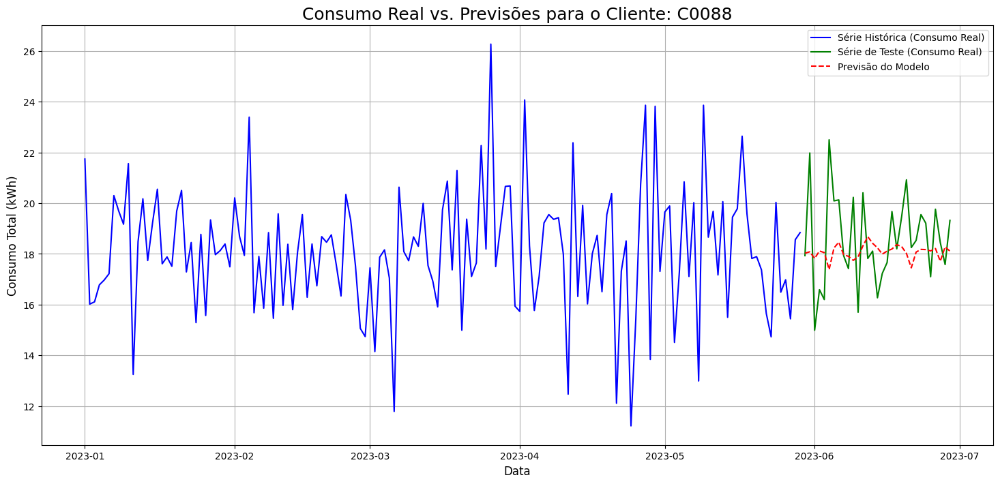

In [ ]:
def plot_full_series_with_predictions(
    model_global: lgb.LGBMRegressor, # Tipo específico para LightGBM
    df_full: pd.DataFrame, #Recebe o DataFrame completo
    exog_cols: List[str],
    categ_cols: List[str],
    client_id_to_plot: str,
    test_size: str # Tamanho do período de teste (ex: '30 days')
):
    """
    Plota a série de consumo completa (histórico e teste) e as previsões
    do modelo LightGBM para um cliente específico.

    Args:
        model_global (lgb.LGBMRegressor): O objeto do modelo LightGBM treinado.
        df_full (pd.DataFrame): DataFrame completo com todos os dados históricos.
        exog_cols (list): Lista de colunas exógenas usadas no modelo.
        categ_cols (list): Lista de colunas que devem ser tratadas como categóricas.
        client_id_to_plot (str): O ID do cliente a ser plotado.
        test_size (str): O tamanho do período de teste (ex: '30 days', '1 month').
    """
    # Filtra os dados para o cliente desejado
    df_client = df_full[df_full['client_id'] == client_id_to_plot].copy()

    if df_client.empty:
        print(f"❌ Cliente {client_id_to_plot} não encontrado no DataFrame completo.")
        return

    # Garante que o índice seja de data e esteja ordenado
    if 'date' in df_client.columns:
        df_client['date'] = pd.to_datetime(df_client['date'])
        df_client = df_client.set_index('date').sort_index()
    elif not isinstance(df_client.index, pd.DatetimeIndex):
        print("❌ O DataFrame deve ter um índice DatetimeIndex ou uma coluna 'date'.")
        return

    # ----Define o ponto de corte para o teste ----
    # Calcula a data de início do período de teste
    test_start_date = df_client.index.max() - create_offset(test_size)

    # Divide o DataFrame do cliente em histórico e teste
    df_client_history = df_client[df_client.index < test_start_date].copy()
    df_client_test = df_client[df_client.index >= test_start_date].copy()

    if df_client_test.empty:
        print(f"❌ Não há dados suficientes para o período de teste para o cliente {client_id_to_plot}. Verifique `test_size`.")
        return
    if df_client_history.empty:
        print(f"❌ Não há dados históricos suficientes para o cliente {client_id_to_plot}. Verifique `test_size`.")
        return

    # Prepara os dados de teste para a previsão
    X_test_client = df_client_test[exog_cols].copy()
    y_true_client = df_client_test['total_consumption']

    # Trata as colunas categóricas para a previsão
    for col in categ_cols:
        if col in X_test_client.columns:
            X_test_client[col] = X_test_client[col].astype('category')
        else:
            print(f"⚠️ Aviso: Coluna categórica '{col}' não encontrada em X_test_client.")

    # Preenche NaNs nas features numéricas antes da previsão (consistente com o treino)
    numeric_cols_test = X_test_client.select_dtypes(include=np.number).columns
    X_test_client[numeric_cols_test] = X_test_client[numeric_cols_test].fillna(0)

    # Faz as previsões para o período de teste
    y_pred_client = model_global.predict(X_test_client)

    # Cria o gráfico
    plt.figure(figsize=(18, 8))

    # ---- Plota a série histórica completa (treino + validação) em azul ----
    plt.plot(df_client_history.index, df_client_history['total_consumption'],
             label='Série Histórica (Consumo Real)', color='b')

    # Plota a série de teste (consumo real) em verde
    plt.plot(df_client_test.index, y_true_client,
             label='Série de Teste (Consumo Real)', color='g')

    # Plota as previsões para o período de teste em vermelho tracejado
    plt.plot(y_true_client.index, y_pred_client,
             label='Previsão do Modelo', color='r', linestyle='--')

    # Adiciona título e rótulos
    plt.title(f'Consumo Real vs. Previsões para o Cliente: {client_id_to_plot}', fontsize=18)
    plt.xlabel('Data', fontsize=12)
    plt.ylabel('Consumo Total (kWh)', fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.show()


plot_full_series_with_predictions(
    model_global=model_global,
    df_full=df_global,
    exog_cols=exog_cols_global,
    categ_cols=categ_cols_global,
    client_id_to_plot='C0088',
    test_size='30 days'
)


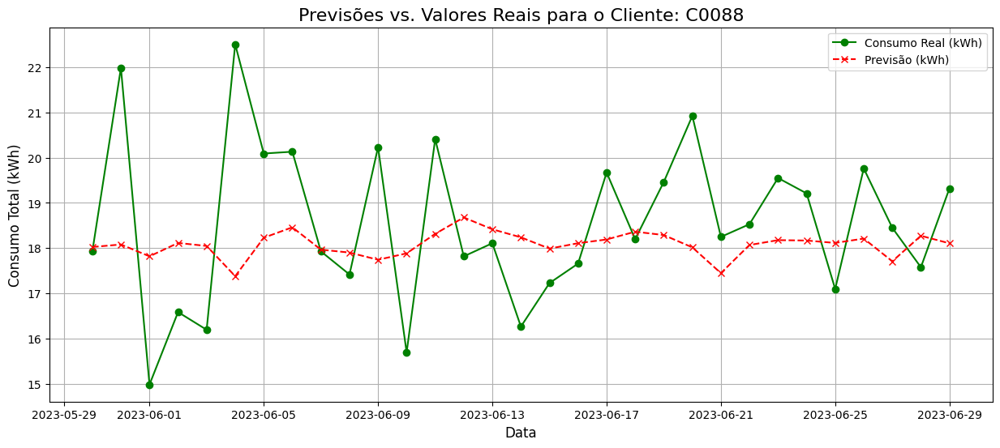

In [ ]:
def plot_lgbm_predictions(
    model_global: lgb.LGBMRegressor,
    df_full: pd.DataFrame,
    exog_cols: List[str],
    categ_cols: List[str],
    client_id_to_plot: str,
    test_size: str 
):
    """
    Plota o consumo real e as previsões do modelo LightGBM para um cliente específico.

    Args:
        model_global (lgb.LGBMRegressor): O objeto do modelo LightGBM treinado.
        df_full (pd.DataFrame): DataFrame completo com todos os dados históricos.
        exog_cols (list): Lista de colunas exógenas usadas no modelo.
        categ_cols (list): Lista de colunas que devem ser tratadas como categóricas.
        client_id_to_plot (str): O ID do cliente a ser plotado.
        test_size (str): O tamanho do período de teste (ex: '30 days', '1 month').
    """
    # Filtra os dados para o cliente desejado
    df_client = df_full[df_full['client_id'] == client_id_to_plot].copy()

    if df_client.empty:
        print(f"❌ Cliente {client_id_to_plot} não encontrado no DataFrame completo.")
        return

    # Garante que o índice seja de data e esteja ordenado
    if 'date' in df_client.columns:
        df_client['date'] = pd.to_datetime(df_client['date'])
        df_client = df_client.set_index('date').sort_index()
    elif not isinstance(df_client.index, pd.DatetimeIndex):
        print("❌ O DataFrame deve ter um índice DatetimeIndex ou uma coluna 'date'.")
        return

    # ----Define o ponto de corte para o teste ----
    # Calcula a data de início do período de teste
    test_start_date = df_client.index.max() - create_offset(test_size)

    # Divide o DataFrame do cliente no período de teste
    df_client_test = df_client[df_client.index >= test_start_date].copy()

    if df_client_test.empty:
        print(f"❌ Não há dados suficientes para o período de teste para o cliente {client_id_to_plot}. Verifique `test_size`.")
        return

    # Prepara os dados de features para a previsão
    X_test_client = df_client_test[exog_cols].copy()
    y_true_client = df_client_test['total_consumption']

    # Trata as colunas categóricas
    for col in categ_cols:
        if col in X_test_client.columns:
            X_test_client[col] = X_test_client[col].astype('category')
        else:
            print(f"⚠️ Aviso: Coluna categórica '{col}' não encontrada em X_test_client.")

    # Preenche NaNs nas features numéricas antes da previsão (consistente com o treino)
    numeric_cols_test = X_test_client.select_dtypes(include=np.number).columns
    X_test_client[numeric_cols_test] = X_test_client[numeric_cols_test].fillna(0)

    # Faz as previsões
    y_pred_client = model_global.predict(X_test_client)

    # Cria o gráfico
    plt.figure(figsize=(15, 6))
    plt.plot(y_true_client.index, y_true_client, label='Consumo Real (kWh)', color='g', marker='o', linestyle='-')
    plt.plot(y_true_client.index, y_pred_client, label='Previsão (kWh)', color='r', marker='x', linestyle='--')

    # Adiciona título e rótulos
    plt.title(f'Previsões vs. Valores Reais para o Cliente: {client_id_to_plot}', fontsize=16)
    plt.xlabel('Data', fontsize=12)
    plt.ylabel('Consumo Total (kWh)', fontsize=12)
    plt.legend()
    plt.grid(True)
    plt.show()


plot_lgbm_predictions(
        model_global=model_global,
        df_full=df_global,
        exog_cols=exog_cols_global,
        categ_cols=categ_cols_global,
        client_id_to_plot='C0088',
        test_size='30 days' # Definindo o tamanho do teste
)

O que os Gráficos Revelam 🔍
- **A Previsão está Estática:** A linha tracejada vermelha, que representa a previsão do modelo, está quase reta. Ela não consegue capturar a alta variabilidade, os picos e as quedas do consumo real (linha verde) no período de teste.
- **A Métrica Enganou:** O MAE de 1.84 pode ser baixo porque a linha de previsão está "flutuando" perto da média dos valores reais no período de teste, o que é um resultado muito ruim. O R² de 0.627 é um número alto, mas ele está sendo inflado pelo fato de o modelo ter capturado a tendência média do consumo.


Porém, as métricas de validação e de teste são praticamente idênticas. Isso é um sinal excelente, pois mostra que o modelo estava generalizando bem e não havia superajuste (overfitting). O modelo capturou padrões que se aplicam tanto ao período de validação quanto ao período de teste.

**PRÓXIMOS PASSOS**:
- Refinar ainda mais a etapa de engenharia de features para o modelo que teve melhor resutado até aqui (lgbm), de maneira que consiga aprender não só a tendência geral das séries mas a variabilidade por cliente.

## Versão 2

Tabela 'dados_lgbm_global' criada com sucesso. ✅

Iniciando o treinamento do modelo global LightGBM...

MLflow está salvando os logs no URI: file:/content/drive/MyDrive/CaseTécnico_Aquarela_TimeSeries/mlruns

Train end date: 2023-03-01 00:00:00
Val size offset:  30 days 00:00:00
Test init date:  2023-05-30 00:00:00
💻 Processando Fold 1...
✅ Fold 1 concluído. MAE: 0.1953


2025/08/04 18:43:27 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


💻 Processando Fold 2...
✅ Fold 2 concluído. MAE: 0.1637


2025/08/04 18:43:37 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



🏁 Validação walk-forward concluída.
Métricas Médias Finais:
- AVG_MAE: 0.1795
- AVG_RMSE: 0.2721
- AVG_R2: 0.9945
- AVG_MAPE: 1.3369
- AVG_MASE: 0.0418

Modelo treinado com sucesso e DataFrames retornados.


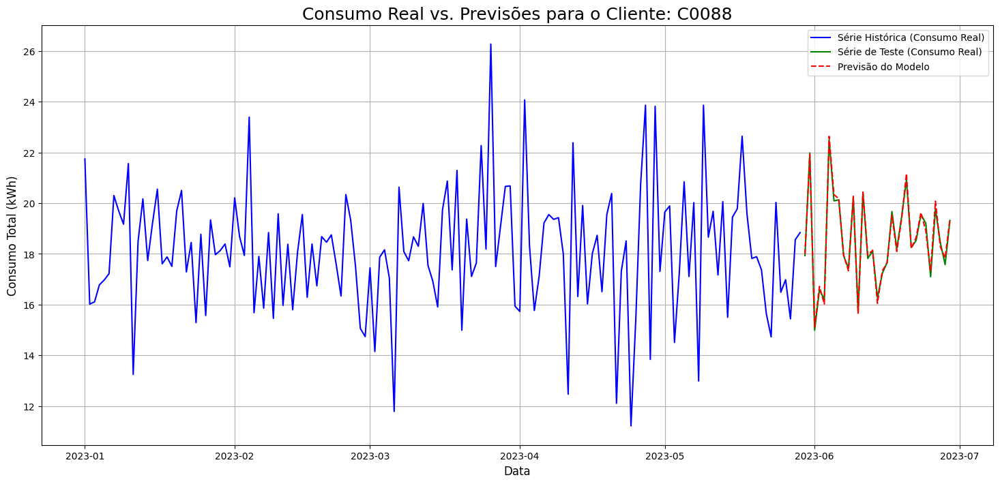

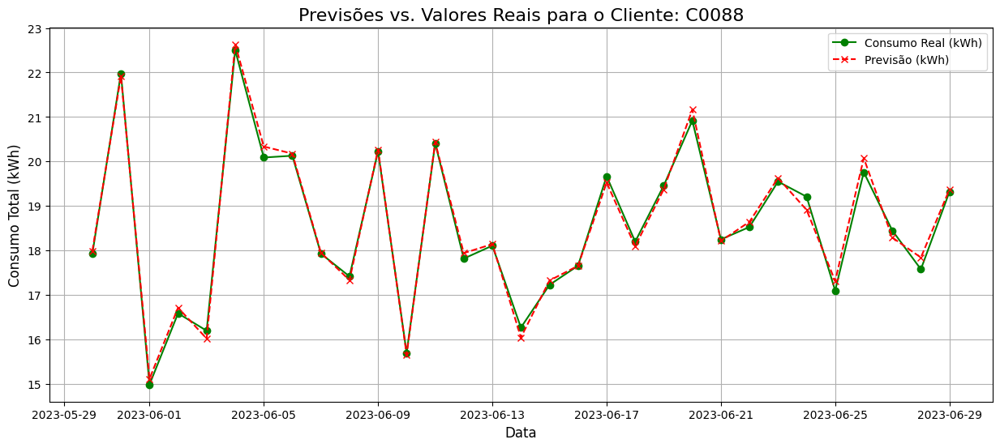

In [ ]:
# --- Cria uma única tabela global para o treinamento ---
query_global = """
CREATE OR REPLACE TABLE dados_lgbm_global AS
SELECT
    f.date, f.client_id, f.total_consumption, f.avg_temperature, f.avg_humidity,
    f.temp_humid_interaction, f.day_counter, f.consumption_lag_1,
    f.consumption_lag_2, f.consumption_lag_3, f.consumption_lag_4,
    f.consumption_lag_7, f.consumption_lag_15,
    f.rolling_mean_3, f.rolling_std_3, f.rolling_mean_7,
    f.rolling_std_7, f.diff_lag_1,
    cal.day_of_week AS day_of_week_name, cal.month,
    cal.tipo_feriado
FROM features AS f
JOIN calendario AS cal ON f.date = cal.date
ORDER BY f.client_id, f.date;
"""
con.execute(query_global)
print("Tabela 'dados_lgbm_global' criada com sucesso. ✅")

# ---Carrega a tabela global para o Pandas ---
df_global = con.execute("SELECT * FROM dados_lgbm_global").fetchdf()

exog_cols_global2 = [
        'client_id', 'avg_temperature', 'avg_humidity', 'temp_humid_interaction',
        'day_counter', 'consumption_lag_1', 'consumption_lag_2', 'consumption_lag_3',
        'consumption_lag_4', 'consumption_lag_7','consumption_lag_15',
        'rolling_mean_3', 'rolling_std_3', 'rolling_mean_7',
        'rolling_std_7', 'diff_lag_1','tipo_feriado', 'day_of_week_name', 'month'
    ]

categ_cols_global = ['client_id', 'tipo_feriado', 'day_of_week_name', 'month']

# Chama a função de treinamento e desempacota a tupla de retorno
model_global2, df_train_global, df_val_global, df_test_global =train_lgbm_model(
    df=df_global,
    mlflow_experiment_name="Treinamento LightGBM Global_v2",
    exog_cols=exog_cols_global2,
    categ_cols=categ_cols_global,
    initial_train_size='2 months',
    validation_size='30 days',
    test_size='30 days'
)

if model_global2:
    print("\nModelo treinado com sucesso e DataFrames retornados.")
else:
    print("\nOcorreu um erro durante o treinamento.")

# Avaliação do modelo LGBM Global
lgbm2_results = evaluate_lgbm_global_model(model_global2, df_test_global
                                          ,exog_cols_global2, df_train_global, categ_cols_global)
#Adiciona os resultados do modelo global (LGBM) ao DataFrame final
num_clients_test = df_test_global['client_id'].nunique()
lgbm2_results.drop(columns='client_id', inplace=True)
lgbm2_results['num_clients'] = num_clients_test
lgbm2_results = lgbm2_results.set_index('model')

plot_full_series_with_predictions(
    model_global=model_global2,
    df_full=df_global,
    exog_cols=exog_cols_global2,
    categ_cols=categ_cols_global,
    client_id_to_plot='C0088',
    test_size='30 days'
)

plot_lgbm_predictions(
        model_global=model_global2,
        df_full=df_global,
        exog_cols=exog_cols_global2,
        categ_cols=categ_cols_global,
        client_id_to_plot='C0088',
        test_size='30 days' # Definindo o tamanho do teste
)

In [ ]:
lgbm2_results.head()

,mae,rmse,r2,mape,mase,y_true_std,num_clients
model,,,,,,,
LGBM Global,0.169836,0.258619,0.99525,1.275827,0.039516,2.2498,100


Versão 2: O Modelo com Features de Janela
- Validação: MAE=0.18, R²=0.995, MASE=0.041
- Teste: MAE=0.17, R²=0.995, MASE=0.039

Interpretação das Métricas
- **MAE (Mean Absolute Error): 0.17**
 Um MAE de aproximadamente 0.17 é um resultado excelente, significa que, em média, a previsão do modelo está errada por apenas 0.17 kWh.
- **y_true_std (Desvio Padrão do Consumo Real): 2.25**
Este é o desvio padrão médio do consumo para os clientes no conjunto de dados. O desvio padrão é uma medida da volatilidade dos dados.
A interpretação é a seguinte: o erro médio (MAE = 0.17) é muito menor do que a volatilidade média dos dados (std = 2.25). Isso significa que o modelo não apenas está acertando bem, mas também está fazendo isso consistentemente, apesar das flutuações naturais no consumo.
- **RMSE (Root Mean Squared Error): 0.25**
O fato de o RMSE ser um pouco maior que o MAE indica que o modelo tem alguns erros maiores, mas eles não são tão frequentes ou extremos a ponto de desviar significativamente a métrica. Ainda assim, o valor é muito baixo.
- **R² (R-squared): 0.995**
O R² mede a proporção da variância do target que é explicada pelas features do modelo. Um R² de 0.995 é quase perfeito. Isso significa que o modelo está explicando 99.5% da variação no consumo de energia. Isso sugere que as features criadas (lags, janelas de rolagem, etc.) são extremamente eficazes.
- **MAPE (Mean Absolute Percentage Error): 1.27**
O MAPE expressa o erro em porcentagem. Um MAPE de 1.27% é extraordinariamente baixo. Em média, o modelo tem um erro de pouco mais de 1% em relação ao valor real, o que é um resultado excepcional para um problema de previsão.
- **MASE (Mean Absolute Scaled Error): 0.039**
O MASE é uma métrica que compara o erro do próprio modelo com o erro de um modelo ingênuo (que usa o valor do dia anterior como previsão). Um MASE menor que 1.0 indica que o modelo é melhor que o modelo ingênuo. Um valor de 0.039 significa que o modelo treinado é cerca de 27 vezes mais preciso que o modelo ingênuo, um resultado fantástico.


Os resultados estão tão bons que que poderíamos consdierar Overfitting, se não pelo seguinte:
- Divisão Temporal: O modelo está sendo testado em um período de tempo que ele nunca viu antes (df_test_global). Isso simula um cenário real, onde o modelo precisa prever o futuro. Se a performance no conjunto de teste se mantiver tão boa quanto a de validação, é um forte indicativo de que o modelo não está superajustado.
- Métricas Diversas: O resultado não se baseou apenas no R², havendo MAE, MAPE e MASE com valores excelentes, e de o MAE ser muito menor que o desvio padrão (y_true_std), é um sinal robusto de que a performance é genuína. O MASE, em particular, confirma que modelo é substancialmente melhor que uma abordagem ingênua.

**Em resumo**, a performance no conjunto de teste continua sendo quase idêntica à performance no conjunto de validação. Isso é a sua garantia contra o overfitting. **A inclusão das features de janela não fez com que o modelo "decorasse" os dados de treino**, em vez disso, ela o ajudou a entender o contexto temporal e os padrões cíclicos dos dados de forma muito mais eficaz.

# Construção da Pipeline

Construção de um pipeline contendo:
  - Ingestão dos CSVs✅
  - Transformações✅
  - Treinamento✅
  - Inferência✅

  E Registro do modelo treinado (MLflow ou pickle versionado).✅

## Funções

In [ ]:

# --- 1. Ingestão e Tratamento de Dados Brutos: ingestion.py---

# Define os caminhos para os arquivos
path_clientes = '/content/drive/MyDrive/CaseTécnico_Aquarela_TimeSeries/data/clientes.csv'
path_clima = '/content/drive/MyDrive/CaseTécnico_Aquarela_TimeSeries/data/clima.csv'
path_consumo = '/content/drive/MyDrive/CaseTécnico_Aquarela_TimeSeries/data/consumo.csv'

# Conecta ao DuckDB em memória
con = duckdb.connect(database=':memory:', read_only=False)
print("✅ Conexão com DuckDB estabelecida.")

def ingest_and_treat_data(con: duckdb.DuckDBPyConnection) -> pd.DataFrame:
    """
    Ingere os dados, trata os valores ausentes no clima e materializa as tabelas
    no DuckDB para posterior feature engineering.
    """
    print("--- 1. INGESTÃO E TRATAMENTO DE DADOS ---")

    # Ingestão bruta
    try:
        qry_cli = f"SELECT * FROM '{path_clientes}'"
        cli_raw = con.execute(qry_cli).fetchdf()

        qry_clima = f"SELECT * FROM '{path_clima}'"
        clima_raw = con.execute(qry_clima).fetchdf()

        qry_con = f"SELECT * FROM '{path_consumo}'"
        con_raw = con.execute(qry_con).fetchdf()
        print("✅ Dados brutos ingeridos com sucesso.")
    except Exception as e:
        print(f"❌ Falha na ingestão de dados: {e}")
        return None

    # Tratamento de dados de clima
    print("\n--- Tratando valores ausentes no clima ---")
    clima_raw_sorted = clima_raw.sort_values(by=['region', 'date']).reset_index(drop=True)
    clima_raw_sorted['temperature'] = clima_raw_sorted.groupby('region')['temperature'].transform(lambda x: x.interpolate(method='linear'))
    clima_raw_sorted['temperature'] = clima_raw_sorted.groupby('region')['temperature'].transform(lambda x: x.fillna(method='ffill'))
    clima_raw_sorted['temperature'] = clima_raw_sorted.groupby('region')['temperature'].transform(lambda x: x.fillna(method='bfill'))
    print("✅ Valores ausentes de temperatura tratados com sucesso.")

    # Materializa as tabelas no DuckDB
    con.execute("CREATE OR REPLACE TABLE clientes AS SELECT * FROM cli_raw")
    con.execute("CREATE OR REPLACE TABLE consumo AS SELECT * FROM con_raw")
    con.execute("CREATE OR REPLACE TABLE clima AS SELECT * FROM clima_raw_sorted")
    print("✅ Tabelas 'clientes', 'consumo' e 'clima' materializadas no DuckDB.")

    return con


# --- 2. Feature Engineering com DuckDB: feature_engineering.py  ---
def feature_engineering(con: duckdb.DuckDBPyConnection) -> pd.DataFrame:
    """
    Executa todas as queries de feature engineering no DuckDB e
    retorna o DataFrame final pronto para o treinamento.
    """
    print("\n--- 2. FEATURE ENGINEERING COM DUCKDB ---")

    # Query SQL para a criação da tabela de calendário
    query_calendario_sql = """
    CREATE OR REPLACE TABLE calendario AS
        SELECT
            date,
            MONTH(date) AS month,
            CAST(strftime(date, '%W') AS BIGINT) + 1 AS week_of_year,
            DAYOFWEEK(date) AS day_of_week,
            DAYOFYEAR(date) AS day_of_year,
            CASE WHEN DAYOFWEEK(date) IN (0, 6) THEN TRUE ELSE FALSE END AS is_final_semana,
            CASE WHEN (MONTH(date) = 12 AND DAY(date) >= 21) OR (MONTH(date) IN (1, 2)) OR (MONTH(date) = 3 AND DAY(date) < 21) THEN 'Verao'
                 WHEN (MONTH(date) = 3 AND DAY(date) >= 21) OR (MONTH(date) IN (4, 5)) OR (MONTH(date) = 6 AND DAY(date) < 21) THEN 'Outono'
                 WHEN (MONTH(date) = 6 AND DAY(date) >= 21) OR (MONTH(date) IN (7, 8)) OR (MONTH(date) = 9 AND DAY(date) < 21) THEN 'Inverno'
                 ELSE 'Primavera' END AS estacao,
            CASE WHEN date IN ('2023-01-01', '2023-04-21', '2023-05-01', '2023-09-07', '2023-10-12', '2023-11-02', '2023-11-15', '2023-12-25') THEN TRUE ELSE FALSE END AS is_feriado,
            CASE WHEN is_feriado = TRUE AND DAYOFWEEK(date) IN (1, 2, 4, 5) THEN TRUE ELSE FALSE END AS is_feriado_prolongado,
            CASE WHEN is_feriado = TRUE THEN 'Feriado'
                 WHEN is_feriado_prolongado = TRUE THEN 'Feriado Prolongado'
                 ELSE 'Nenhum' END AS tipo_feriado,
            CASE WHEN DAYOFWEEK(date) IN (0, 6) OR is_feriado = TRUE THEN FALSE ELSE TRUE END AS is_dia_util,
            DAYOFWEEK(date) as day_of_week_name, -- Usado para o LightGBM, pois o nome do dia é mais intuitivo
            MONTH(date) as month
        FROM (SELECT DISTINCT date FROM clima)
        ORDER BY date;
    """
    con.execute(query_calendario_sql)
    print("✅ Tabela 'calendario' criada com sucesso.")

    # Query SQL para a criação da tabela de features
    query_create_features = """
    CREATE OR REPLACE TABLE features AS
    SELECT
        c.date,
        c.client_id,
        c.consumption_kwh AS total_consumption,
        cl.temperature as avg_temperature,
        cl.humidity as avg_humidity,
        cl.temperature * cl.humidity AS temp_humid_interaction,
        ROW_NUMBER() OVER (PARTITION BY c.client_id ORDER BY c.date) AS day_counter,
        LAG(c.consumption_kwh, 1) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_1,
        LAG(c.consumption_kwh, 2) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_2,
        LAG(c.consumption_kwh, 3) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_3,
        LAG(c.consumption_kwh, 4) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_4,
        LAG(c.consumption_kwh, 7) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_7,
        LAG(c.consumption_kwh, 15) OVER (PARTITION BY c.client_id ORDER BY c.date) AS consumption_lag_15,
        AVG(c.consumption_kwh) OVER (PARTITION BY c.client_id ORDER BY c.date ROWS BETWEEN 3 PRECEDING AND 1 PRECEDING) AS rolling_mean_3,
        STDDEV(c.consumption_kwh) OVER (PARTITION BY c.client_id ORDER BY c.date ROWS BETWEEN 3 PRECEDING AND 1 PRECEDING) AS rolling_std_3,
        AVG(c.consumption_kwh) OVER (PARTITION BY c.client_id ORDER BY c.date ROWS BETWEEN 7 PRECEDING AND 1 PRECEDING) AS rolling_mean_7,
        STDDEV(c.consumption_kwh) OVER (PARTITION BY c.client_id ORDER BY c.date ROWS BETWEEN 7 PRECEDING AND 1 PRECEDING) AS rolling_std_7,
        c.consumption_kwh - LAG(c.consumption_kwh, 1) OVER (PARTITION BY c.client_id ORDER BY c.date) AS diff_lag_1
    FROM consumo AS c
    JOIN clientes AS cli ON c.client_id = cli.client_id
    LEFT JOIN clima AS cl ON c.date = cl.date AND cli.region = cl.region
    ORDER BY c.client_id, c.date;
    """
    con.execute(query_create_features)
    print("✅ Tabela 'features' criada com sucesso.")

    # Query SQL para a criação da tabela global de treinamento
    query_global = """
    CREATE OR REPLACE TABLE dados_lgbm_global AS
    SELECT
        f.date, f.client_id, f.total_consumption, f.avg_temperature, f.avg_humidity,
        f.temp_humid_interaction, f.day_counter, f.consumption_lag_1,
        f.consumption_lag_2, f.consumption_lag_3, f.consumption_lag_4,
        f.consumption_lag_7, f.consumption_lag_15,
        f.rolling_mean_3, f.rolling_std_3, f.rolling_mean_7,
        f.rolling_std_7, f.diff_lag_1,
        cal.day_of_week AS day_of_week_name, cal.month,
        cal.tipo_feriado
    FROM features AS f
    JOIN calendario AS cal ON f.date = cal.date
    ORDER BY f.client_id, f.date;
    """
    con.execute(query_global)
    print("✅ Tabela 'dados_lgbm_global' criada com sucesso.")

    # Carrega a tabela final para o Pandas
    df_global = con.execute("SELECT * FROM dados_lgbm_global").fetchdf()
    print("✅ DataFrame final carregado para o Pandas.")
    return df_global

# --- 3. Treinamentom, função  train_lgbm_model(): train_model.py ---

# --- 4. Função de Inferência: predict_model.py---
def make_predictions(model: lgb.LGBMRegressor, df_to_predict: pd.DataFrame,
                     exog_cols: List[str], categ_cols: List[str]) -> pd.DataFrame:
    """
    Faz previsões em novos dados usando um modelo LightGBM treinado.

    Esta função replica as etapas de pré-processamento aplicadas no treino
    para garantir consistência.

    Args:
        model (lgb.LGBMRegressor): O modelo LightGBM treinado.
        df_to_predict (pd.DataFrame): O DataFrame com novos dados.
        exog_cols (List[str]): Lista de colunas a serem usadas como features.
        categ_cols (List[str]): Lista de colunas categóricas.

    Returns:
        pd.DataFrame: DataFrame original com a coluna 'prediction' adicionada.
    """
    print("\n--- 4. INFERÊNCIA DO MODELO ---")
    df_infer = df_to_predict.copy()

    # Aplica as mesmas transformações de pré-treinamento
    numeric_cols = df_infer.select_dtypes(include=np.number).columns
    df_infer[numeric_cols] = df_infer[numeric_cols].fillna(0)
    df_infer[categ_cols] = df_infer[categ_cols].astype('category')

    # Faz a previsão
    X_predict = df_infer[exog_cols]
    df_infer['prediction'] = model.predict(X_predict)
    print("✅ Previsões realizadas com sucesso.")

    return df_infer

✅ Conexão com DuckDB estabelecida.


## Pipeline completo

Criei a pasta **pipeline/**, que simula uma modularização mais próxima do ambiente de produção real. Abaixo estão apenas as funções de base para esta pipeline executável .py

In [ ]:
# --- Execução do Pipeline Completo ---
if __name__ == '__main__':
    mlflow_drive_path = "file:/content/drive/MyDrive/CaseTécnico_Aquarela_TimeSeries/mlruns"
    mlflow.set_tracking_uri(mlflow_drive_path)

    # --- PARÂMETROS DO PIPELINE ---
    exog_cols_global = [
        'client_id', 'avg_temperature', 'avg_humidity', 'temp_humid_interaction',
        'day_counter', 'consumption_lag_1', 'consumption_lag_2', 'consumption_lag_3',
        'consumption_lag_4', 'consumption_lag_7','consumption_lag_15',
        'rolling_mean_3', 'rolling_std_3', 'rolling_mean_7',
        'rolling_std_7', 'diff_lag_1','tipo_feriado', 'day_of_week_name', 'month'
    ]
    categ_cols_global = ['client_id', 'tipo_feriado', 'day_of_week_name', 'month']
    mlflow_experiment_name = "Treinamento LightGBM Global_v3"

    # Etapa 1 & 2: Ingestão, Tratamento e Feature Engineering
    con_db = ingest_and_treat_data(con)
    if con_db is None:
        exit()
    df_global = feature_engineering(con_db)

    # Fecha a conexão com o DuckDB após a extração dos dados
    #con_db.close()

    # Etapa 3: Treinamento do Modelo
    model_global, _, _, df_test_global = train_lgbm_model(
    df=df_global,
    mlflow_experiment_name="Treinamento LightGBM Global_v1",
    exog_cols=exog_cols_global,
    categ_cols=categ_cols_global,
    initial_train_size='2 months',
    validation_size='30 days',
    test_size='30 days'
)

    # Etapa 4: Inferência em novos dados (usando o conjunto de teste como exemplo)
    df_test_with_predictions = make_predictions(
        model=model_global,
        df_to_predict=df_test_global.copy(), # Usa uma cópia para não alterar o original
        exog_cols=exog_cols_global,
        categ_cols=categ_cols_global
    )

    print("\n✅ Exemplo de previsões no conjunto de teste:")
    print(df_test_with_predictions[['client_id', 'total_consumption', 'prediction']].tail())

    print("\n--- PIPELINE COMPLETO CONCLUÍDO COM SUCESSO ---")

--- 1. INGESTÃO E TRATAMENTO DE DADOS ---
✅ Dados brutos ingeridos com sucesso.

--- Tratando valores ausentes no clima ---
✅ Valores ausentes de temperatura tratados com sucesso.
✅ Tabelas 'clientes', 'consumo' e 'clima' materializadas no DuckDB.

--- 2. FEATURE ENGINEERING COM DUCKDB ---
✅ Tabela 'calendario' criada com sucesso.


2025/08/04 17:22:07 INFO mlflow.tracking.fluent: Experiment with name 'Treinamento LightGBM Global_v1' does not exist. Creating a new experiment.


✅ Tabela 'features' criada com sucesso.
✅ Tabela 'dados_lgbm_global' criada com sucesso.
✅ DataFrame final carregado para o Pandas.

Iniciando o treinamento do modelo global LightGBM...

MLflow está salvando os logs no URI: file:/content/drive/MyDrive/CaseTécnico_Aquarela_TimeSeries/mlruns

Train end date: 2023-03-01 00:00:00
Val size offset:  30 days 00:00:00
Test init date:  2023-05-30 00:00:00
💻 Processando Fold 1...
✅ Fold 1 concluído. MAE: 0.1953


2025/08/04 17:22:17 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


💻 Processando Fold 2...
✅ Fold 2 concluído. MAE: 0.1637


2025/08/04 17:22:25 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.



🏁 Validação walk-forward concluída.
Métricas Médias Finais:
- AVG_MAE: 0.1795
- AVG_RMSE: 0.2721
- AVG_R2: 0.9945
- AVG_MAPE: 1.3369
- AVG_MASE: 0.0418

--- 4. INFERÊNCIA DO MODELO ---
✅ Previsões realizadas com sucesso.

✅ Exemplo de previsões no conjunto de teste:
           client_id  total_consumption  prediction
date                                               
2023-06-29     C0069              18.60   18.597669
2023-06-29     C0070               9.68    9.862389
2023-06-29     C0071              15.20   15.173634
2023-06-29     C0073              18.44   18.294940
2023-06-29     C0099              16.61   16.434464

--- PIPELINE COMPLETO CONCLUÍDO COM SUCESSO ---


# Resultados Finais

Dashboard interativo com visualizações de previsões e métricas (pode ser interativo dentro de um jupyter).


**VER PASTA dashboard/**